 ### todos


 **general todos**

 [ ] eventually fix the paths for anyone not running this from src directory (remove ...)



 [x] map setup numbers to better names for all plots



 [x] traverse setup folders and concat dfs



 [x] do some significance tests based on results_df



 [ ] combine ALL the run results and do a regression with a lot more parameters!



 **Plots I want this to work on**

 [ ] Time plot?



 [x] Fitness_plot



     [ ] comparing best vs. avg vs best species (needs to be only done once)



 [x] Total components?



 [x] Unique components per generation



 [x] Mutation boxplot effects



 [x] fitness Metrics plots



 [ ] best genome mutation analysis



 [x] Mutation lineplots



 [x] Average metrics?



 [ ] Number species



 [x] Spawn rank histogram



 [x] Scatterplot



 **Do not forget about single-run plots, they should also be in here**

 [ ] best genome lineage



 [ ] species leaders??



 [ ] species stackplot



 [ ] species tree



 [ ] species ridgeline



 [ ] species average fitnesses



 [ ] fitness scatterplot (as implemented in look_at_dfs) - can only do that for one run



 **Other analysis implemented someplace else**

 [ ] ... check the onenote



 **Interesting one-off analysis**

 [ ] Mutation lineage for a selected run



 [ ] Component similarity drift



 [ ] Fitness of components plotting



     - Look at the components in the fittest genome at the end, plot their t-values obtained from the component dict over the generations



 **Those can only be copied from a run**

 [ ] improvements (combine them into something)



 [ ] species leaders??

# Parameters for the analysis file

In [15]:
analysis_plot_fp = "C:/Users/pauls/Documents/GitHubRepos/GeneticPetriNetsThesis/diagrams/analysis_plots/"

# Selection Strategies
In this notebook, I will track all the plots used in the Thesis.

The first step will be evaluating individual selection strategies, with the goal of determining appropriate parameter settings for each selection strategy before comparing the selection strategies against one another.

For those initial comparisons, I will be sticking to the `running_example.xes` log, but bigger logs will be compared.

## Selection strategy - truncation
First off, analyzing the truncation selection strategy

The Data is from a run with the following parameter permutations

* `spawn_cutoff`: 0.1, 0.25, 0.5, 0.75
* `pop_perc_elite`: 0.01, 0.05
* `pop_perc_crossover`: 0.0, 0.1, 0.2, 0.3, 0.4

### Regression on truncation parameters

Probably the most influental parameter, it should directly expose the trade-offs of diversity vs. focus during the search. I.e. trading faster convergence for a narrower search. `spawn_cutoff` determines which portion of the population will be moved into the next.

For every parameter change, all the other parameter changes are also tested, resulting in a total of `4*2*5 = 40` setups. That also means that The spawn cutoff was tested with all `pop_perc_elite` and `pop_perc_crossover` settings. Each setup was run 20 times.

I did not run a test with 0% elitism. Usually elitism is crucial to ensuring that the best mutations cannot possibly get lost in the unlikely event of not being selected for the next generation. This event cannot occur in truncation selection, as the selection function simply iterates the population in descending order to spawn offspring. However - elitism is definitely crucial for speciation selection; and while extremely unlikely - roulette selection could also in theory loose the best genome in one generation by not selecting it as a parent. To ensure that I can easily compare my results and reduce the number of possible setups, I did not test truncation without elitism.

To investigate the hypothesis that spawn cutoff has the largest effect on achieved diversity, I rely on the num_components metric which was calculated for every run, as well as the highest achieved fitness and do a regression for both of those target variables. Predictors are the params that were changed, i.e. spawn cutoff, % elite spawns and % crossover spawns.

In [9]:
from importlib import reload # TODO: remove this later
import scripts.helper_scripts.setup_analysis as sa # helper module for fetching setup analysis
# crawl the results data and load it into a dict
res = sa.exec_results_crawler("../analysis/data/truncation_test", load_best_genomes=False)


Processing setup directories: 0it [00:00, ?it/s]

setup_1

Found cached results for setup_1


Processing setup directories: 4it [00:04,  1.20s/it]

Successfully loaded cached results for setup_1
setup_10

Found cached results for setup_10


Processing setup directories: 5it [00:09,  2.03s/it]

Successfully loaded cached results for setup_10
setup_11

Found cached results for setup_11


Processing setup directories: 6it [00:15,  3.26s/it]

Successfully loaded cached results for setup_11
setup_12

Found cached results for setup_12


Processing setup directories: 7it [00:22,  4.28s/it]

Successfully loaded cached results for setup_12
setup_13

Found cached results for setup_13


Processing setup directories: 8it [00:28,  4.75s/it]

Successfully loaded cached results for setup_13
setup_14

Found cached results for setup_14


Processing setup directories: 9it [00:34,  5.06s/it]

Successfully loaded cached results for setup_14
setup_15

Found cached results for setup_15


Processing setup directories: 10it [00:39,  5.18s/it]

Successfully loaded cached results for setup_15
setup_16

Found cached results for setup_16


Processing setup directories: 11it [00:46,  5.51s/it]

Successfully loaded cached results for setup_16
setup_17

Found cached results for setup_17


Processing setup directories: 12it [00:52,  5.72s/it]

Successfully loaded cached results for setup_17
setup_18

Found cached results for setup_18


Processing setup directories: 13it [00:57,  5.68s/it]

Successfully loaded cached results for setup_18
setup_19

Found cached results for setup_19


Processing setup directories: 14it [01:03,  5.62s/it]

Successfully loaded cached results for setup_19
setup_2

Found cached results for setup_2


Processing setup directories: 15it [01:09,  5.75s/it]

Successfully loaded cached results for setup_2
setup_20

Found cached results for setup_20


Processing setup directories: 16it [01:14,  5.58s/it]

Successfully loaded cached results for setup_20
setup_21

Found cached results for setup_21


Processing setup directories: 17it [01:28,  7.95s/it]

Successfully loaded cached results for setup_21
setup_22

Found cached results for setup_22


Processing setup directories: 18it [01:37,  8.42s/it]

Successfully loaded cached results for setup_22
setup_23

Found cached results for setup_23


Processing setup directories: 19it [01:45,  8.25s/it]

Successfully loaded cached results for setup_23
setup_24

Found cached results for setup_24


Processing setup directories: 20it [01:52,  7.76s/it]

Successfully loaded cached results for setup_24
setup_25

Found cached results for setup_25


Processing setup directories: 21it [01:58,  7.47s/it]

Successfully loaded cached results for setup_25
setup_26

Found cached results for setup_26


Processing setup directories: 22it [02:09,  8.33s/it]

Successfully loaded cached results for setup_26
setup_27

Found cached results for setup_27


Processing setup directories: 23it [02:18,  8.48s/it]

Successfully loaded cached results for setup_27
setup_28

Found cached results for setup_28


Processing setup directories: 24it [02:25,  8.29s/it]

Successfully loaded cached results for setup_28
setup_29

Found cached results for setup_29


Processing setup directories: 25it [02:32,  7.85s/it]

Successfully loaded cached results for setup_29
setup_3

Found cached results for setup_3


Processing setup directories: 26it [02:37,  7.07s/it]

Successfully loaded cached results for setup_3
setup_30

Found cached results for setup_30


Processing setup directories: 27it [02:43,  6.72s/it]

Successfully loaded cached results for setup_30
setup_31

Found cached results for setup_31


Processing setup directories: 28it [02:55,  8.30s/it]

Successfully loaded cached results for setup_31
setup_32

Found cached results for setup_32


Processing setup directories: 29it [03:05,  8.70s/it]

Successfully loaded cached results for setup_32
setup_33

Found cached results for setup_33


Processing setup directories: 30it [03:15,  8.94s/it]

Successfully loaded cached results for setup_33
setup_34

Found cached results for setup_34


Processing setup directories: 31it [03:22,  8.52s/it]

Successfully loaded cached results for setup_34
setup_35

Found cached results for setup_35


Processing setup directories: 32it [03:29,  8.16s/it]

Successfully loaded cached results for setup_35
setup_36

Found cached results for setup_36


Processing setup directories: 33it [03:39,  8.69s/it]

Successfully loaded cached results for setup_36
setup_37

Found cached results for setup_37


Processing setup directories: 34it [03:48,  8.81s/it]

Successfully loaded cached results for setup_37
setup_38

Found cached results for setup_38


Processing setup directories: 35it [03:58,  9.20s/it]

Successfully loaded cached results for setup_38
setup_39

Found cached results for setup_39


Processing setup directories: 36it [04:07,  8.93s/it]

Successfully loaded cached results for setup_39
setup_4

Found cached results for setup_4


Processing setup directories: 37it [04:12,  7.85s/it]

Successfully loaded cached results for setup_4
setup_40

Found cached results for setup_40


Processing setup directories: 38it [04:19,  7.65s/it]

Successfully loaded cached results for setup_40
setup_5

Found cached results for setup_5


Processing setup directories: 39it [04:25,  6.93s/it]

Successfully loaded cached results for setup_5
setup_6

Found cached results for setup_6


Processing setup directories: 40it [04:30,  6.57s/it]

Successfully loaded cached results for setup_6
setup_7

Found cached results for setup_7


Processing setup directories: 41it [04:36,  6.33s/it]

Successfully loaded cached results for setup_7
setup_8

Found cached results for setup_8


Processing setup directories: 42it [04:41,  6.02s/it]

Successfully loaded cached results for setup_8
setup_9

Found cached results for setup_9


Processing setup directories: 43it [04:46,  6.67s/it]

Successfully loaded cached results for setup_9


In [10]:
reload(sa)

regression_result = sa.run_regression(res, ["spawn_cutoff", "pop_perc_elite", "pop_perc_crossover"]);
regression_result
# print(regression_result.to_latex())
# regression_result


\begin{table}[h]
\centering
 \begin{tabular}{lll}
\toprule \rowcolor[gray]{0.9}
 & \makecell{\textbf{num\_components}\\ (Adj R² = 0.8621)} & \makecell{\textbf{max\_fitness}\\ (Adj R² = 0.0073)} \\[12pt]
\midrule
spawn\_cutoff & \makecell{949.3926 \\ (p$\approx$0.0000)} & \makecell{0.0073 \\ (p$\approx$0.0139)} \\[12pt]
pop\_perc\_elite & \makecell{-106.7737 \\ (p$\approx$0.0000)} & \makecell{-0.0040 \\ (p$\approx$0.1755)} \\[12pt]
pop\_perc\_crossover & \makecell{-432.3445 \\ (p$\approx$0.0000)} & \makecell{0.0029 \\ (p$\approx$0.3354)} \\[12pt]
\bottomrule
\end{tabular}
 \caption{XXX}
\label{tab:XXX}
\end{table}


,\makecell{\textbf{num\_components}\\ (Adj R² = 0.8621)},\makecell{\textbf{max\_fitness}\\ (Adj R² = 0.0073)}
spawn\_cutoff,\makecell{949.3926 \\ (p$\approx$0.0000)},\makecell{0.0073 \\ (p$\approx$0.0139)}
pop\_perc\_elite,\makecell{-106.7737 \\ (p$\approx$0.0000)},\makecell{-0.0040 \\ (p$\approx$0.1755)}
pop\_perc\_crossover,\makecell{-432.3445 \\ (p$\approx$0.0000)},\makecell{0.0029 \\ (p$\approx$0.3354)}


Turns out that 86% of the variance in num_components can be explained by the selected parameters. All three predictors have significant effects on the number of components, with the largest effect being the positive effect of increasing the cutoff. Increasing the number of elite spawns, which are simply cloning the best genome without mutations (with the goal to increase the fraction of elite genomes in the spawnpool so they will mutate in the next generation) leads as expected to a decrease in diversity.

Crossover also has a pretty strong negative effect on the number of components discovered, which does make sense, because crossover effectively replaces one component in one genome with that of another genome, thus reducing the total number of unique components in the genepool. Furthermore, crossover genomes do not undergo any mutations.

On the other hand, the effects of the tested parameters are pretty minimal on the achieved maximum fitness, with none being significant. This is because for this small log there is almost no correlation between diversity and max fitness achieved - as will be seen later in

When it comes to the highest achievable fitness, there are bigger knobs to turn - other selection strategies, mutation rates and of course the fitness function itself.





 ### Interaction cutoff ~ elitism on absolute fitness and number of components at the end of run

 The barcharts below plot the average max fitness of each run, along with the avg. num of components that were discovered, when filtering for runs with both elitism and all 4 cutoff settings. The different crossover settings that were used for each of those parameter configurations are averaged out, i.e. each one of those bars includes data from all 5 crossover settings.

An error occurred: unable to append to a DataFrame of width 46 with a DataFrame of width 49
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 49 with a DataFrame of width 46
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 46 with a DataFrame of width 49
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 46 with a DataFrame of width 49
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 46 with a DataFrame of width 49
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: u

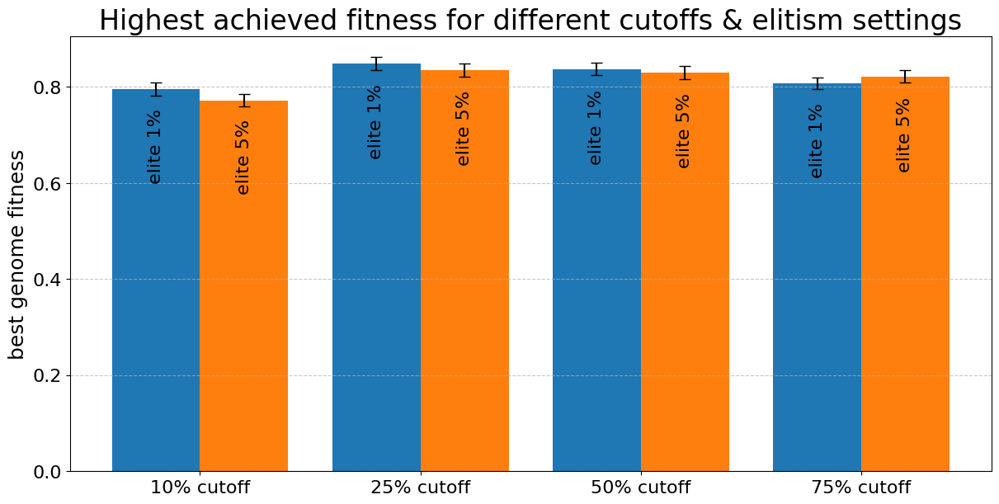

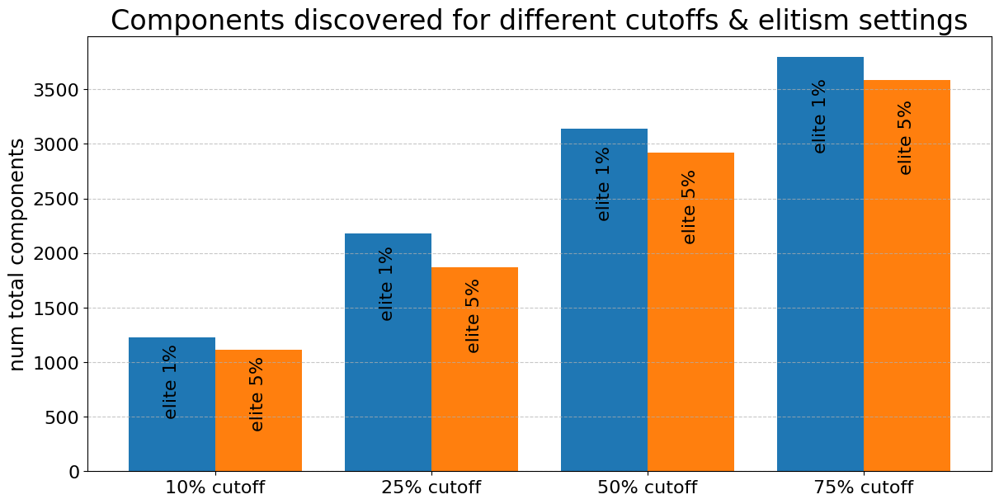

In [16]:
reload(sa)
# TODO: update text above

cutoff_elite_search = {
    "cutoff 10% & elite 1%": {"spawn_cutoff": 0.1, "pop_perc_elite":  0.01}, "cutoff 10% & elite 5%": {"spawn_cutoff": 0.1, "pop_perc_elite":  0.05},
    "cutoff 25% & elite 1%": {"spawn_cutoff": 0.25, "pop_perc_elite": 0.01}, "cutoff 25% & elite 5%": {"spawn_cutoff": 0.25, "pop_perc_elite": 0.05},
    "cutoff 50% & elite 1%": {"spawn_cutoff": 0.50, "pop_perc_elite": 0.01}, "cutoff 50% & elite 5%": {"spawn_cutoff": 0.50, "pop_perc_elite": 0.05},
    "cutoff 75% & elite 1%": {"spawn_cutoff": 0.75, "pop_perc_elite": 0.01}, "cutoff 75% & elite 5%": {"spawn_cutoff": 0.75, "pop_perc_elite": 0.05}
}


elite_plt_layout = [
    ["cutoff 10% & elite 1%", "cutoff 10% & elite 5%"],
    ["cutoff 25% & elite 1%", "cutoff 25% & elite 5%"],
    ["cutoff 50% & elite 1%", "cutoff 50% & elite 5%"],
    ["cutoff 75% & elite 1%", "cutoff 75% & elite 5%"]
]

elite_data_sources = sa.search_and_aggregate_param_results(res, cutoff_elite_search)
strip_first_param = lambda l: l.split('&')[1].strip().split('\n')[0] # lambda to be applied on labels
trunc_bp_cutoff_elite_fit = sa.generalized_barplot(elite_plt_layout, elite_data_sources, "best_genome_fitness", title="Highest achieved fitness for different cutoffs & elitism settings", group_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], label_lambda=strip_first_param)
trunc_bp_cutoff_elite_fit.savefig(analysis_plot_fp + "truncation/cutoff_elite_fitness.pdf", bbox_inches='tight', pad_inches=0.1)
trunc_bp_cutoff_elite_comp = sa.generalized_barplot(elite_plt_layout, elite_data_sources, "num_total_components", title="Components discovered for different cutoffs & elitism settings", group_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], label_lambda=strip_first_param)
trunc_bp_cutoff_elite_comp.savefig(analysis_plot_fp + "truncation/cutoff_elite_components.pdf", bbox_inches='tight', pad_inches=0.1)

 This again shows how none of the settings really have an impact on the achieved mean fitness. At the end, I will compare all setups, i.e. all parameter permutations to identify the best settings within my sample and compare that to the analysis here. However elitism clearly exhibits a negative effect on the total number of components. At really high cutoffs of 75%, elitism ensures that the proportion of good genomes is higher in the gene pool, resulting to a slight boost in fitness compared to a 1% elitism rate. Overall - when aggregating the different crossover settings and looking just at elitism and crossover, the first barchart indicates that a cutoff rate of about 25% is beneficial for fitness when using the current small log, as the search becomes more focused.



 ### Interaction cutoff ~ crossover on absolute fitness and number of components at the end of run

 I will now do the same visualization, this time filtering by cutoff and crossover rate, and both elitism settings will be averaged out.

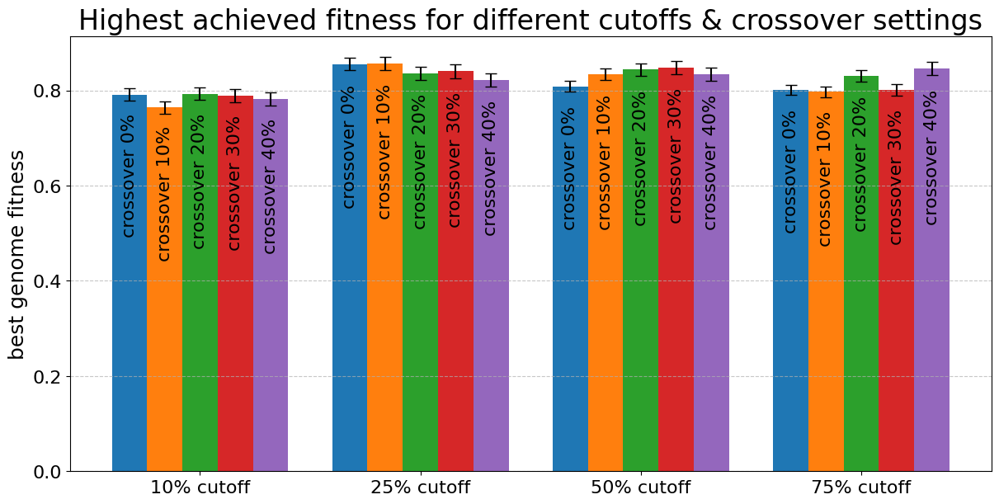

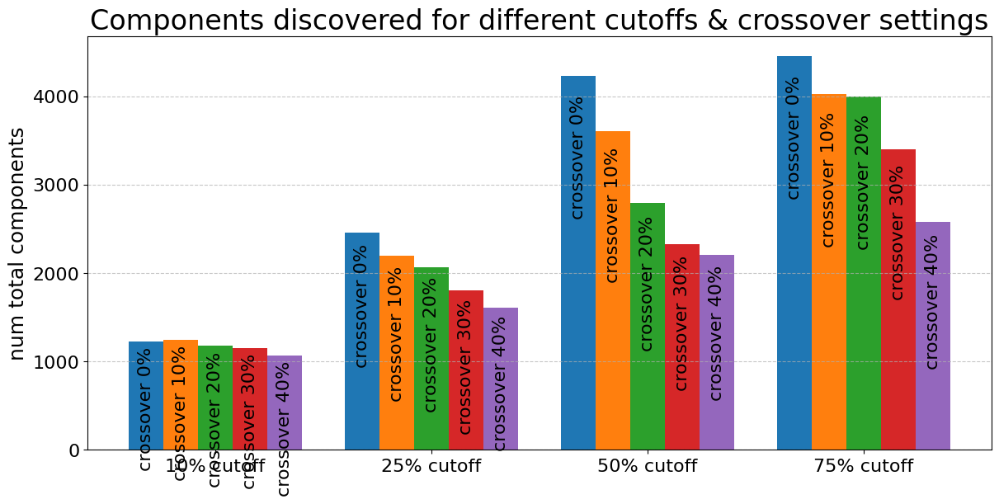

In [162]:
reload(sa)
cutoff_crossover_search = {
    "cutoff 10% & crossover 0%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.0}, "cutoff 10% & crossover 10%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.1}, "cutoff 10% & crossover 20%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.2}, "cutoff 10% & crossover 30%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.3}, "cutoff 10% & crossover 40%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.4},
    "cutoff 25% & crossover 0%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.0}, "cutoff 25% & crossover 10%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.1}, "cutoff 25% & crossover 20%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.2}, "cutoff 25% & crossover 30%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.3}, "cutoff 25% & crossover 40%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.4},
    "cutoff 50% & crossover 0%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.0}, "cutoff 50% & crossover 10%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.1}, "cutoff 50% & crossover 20%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.2}, "cutoff 50% & crossover 30%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.3}, "cutoff 50% & crossover 40%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.4},
    "cutoff 75% & crossover 0%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.0}, "cutoff 75% & crossover 10%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.1}, "cutoff 75% & crossover 20%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.2}, "cutoff 75% & crossover 30%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.3}, "cutoff 75% & crossover 40%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.4},
}

crossover_plt_layout = [
    ["cutoff 10% & crossover 0%", "cutoff 10% & crossover 10%", "cutoff 10% & crossover 20%", "cutoff 10% & crossover 30%", "cutoff 10% & crossover 40%"],
    ["cutoff 25% & crossover 0%", "cutoff 25% & crossover 10%", "cutoff 25% & crossover 20%", "cutoff 25% & crossover 30%", "cutoff 25% & crossover 40%"],
    ["cutoff 50% & crossover 0%", "cutoff 50% & crossover 10%", "cutoff 50% & crossover 20%", "cutoff 50% & crossover 30%", "cutoff 50% & crossover 40%"],
    ["cutoff 75% & crossover 0%", "cutoff 75% & crossover 10%", "cutoff 75% & crossover 20%", "cutoff 75% & crossover 30%", "cutoff 75% & crossover 40%"]
]


crossover_data_sources = sa.search_and_aggregate_param_results(res, cutoff_crossover_search)
strip_first_param = lambda l: l.split('&')[1].strip().split('\n')[0] # lambda to be applied on labels
_ = sa.generalized_barplot(crossover_plt_layout, crossover_data_sources, "best_genome_fitness", title="Highest achieved fitness for different cutoffs & crossover settings", group_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], label_lambda=strip_first_param)
_.savefig(analysis_plot_fp + "truncation/cutoff_crossover_fitness.pdf", bbox_inches='tight', pad_inches=0.1)
_ = sa.generalized_barplot(crossover_plt_layout, crossover_data_sources, "num_total_components", title="Components discovered for different cutoffs & crossover settings", group_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], label_lambda=strip_first_param)
_.savefig(analysis_plot_fp + "truncation/cutoff_crossover_components.pdf", bbox_inches='tight', pad_inches=0.1)


 The fitness barcharts indicate a bit of a tradeoff: Generally, a low cutoff of 25% is beneficial, combined with a low crossover rate of 0-10% percent. However there seems to be a second path to high fitness values, which is choosing a high cutoff but then focusing the search by also using a high crossover rate. Since crossover for truncation selection uses a tournament approach for finding 2 mates (current tournament size = 10), there is increased selection from the top genomes. This can also be seen in the spawn rank plots [below](#truncation-spawn-plots). I.e. when using 40% crossover spawns, 40% of the next generation will be selected by a tournament.

 ### Cutoff ~ Crossover - fitness plot

 In the next step, I want to analyze how truncation selection convergences towards it's optimum in the different parameter settings.

 First, I will plot the maximum fitness in each generation, averaged across all runs sharing the same cutoff & crossover settings



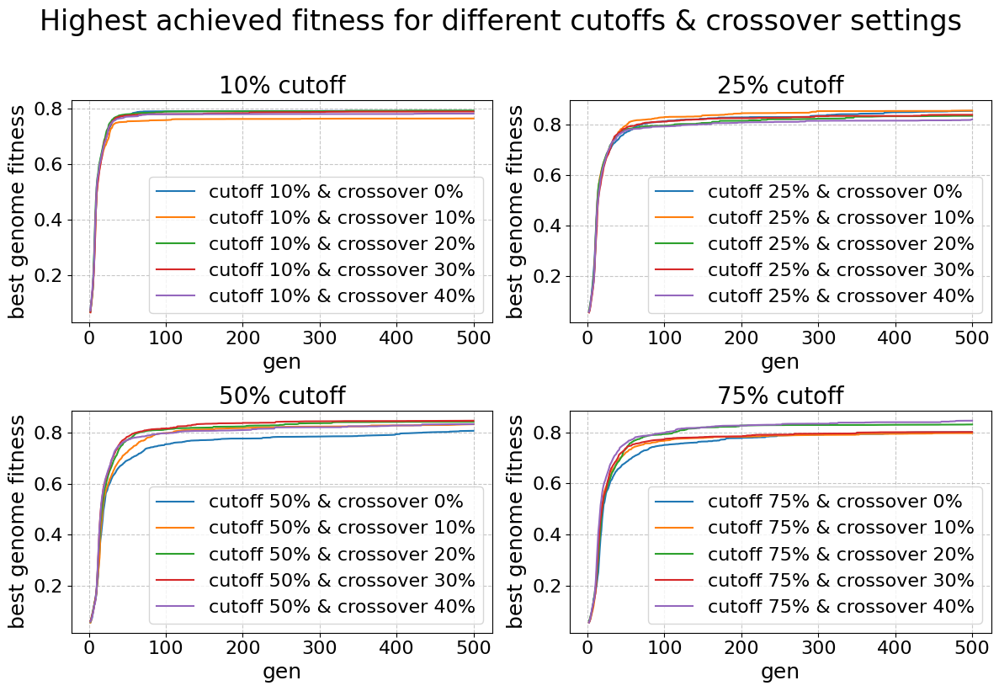

In [5]:
_ = sa.generalized_lineplot(crossover_plt_layout, crossover_data_sources, "best_genome_fitness", title="Highest achieved fitness for different cutoffs & crossover settings", subplt_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"])


 In all of the selection strategy test setups, a fitness function was used that also considers the `num_arcs` metric, where a perfect score of 1.0 is not sensible to achieve - thus the overall fitness cannot reach 1.0.



 Even though fitness seems to plateau on these graphs after ~100 gens, there is often a long tail of optimizations that should not be discarded - even though it is barely visible in these zoomed-out graphs. Examples of such improvements include removing one superfluous arc, leading to a slightly better `num_arcs` score.



 While there is not much of a difference between the fitness plots, the 75% cutoff (4. Quadrant) is very interesting.

 Here, a higher crossover rate is relatively beneficial, and both the 40% and 20% crossover achieve the highest fitness scores.



 The benefit of crossover to fitness will be later investigated in more detail in the section on mutations (**TODO**: add a reference to this section here).



 ### Cutoff ~ Crossover - diversity & convergence



 Now, I want to look at the interaction between cutoff and crossover when converging on the final set of components.

 For this, I will plot the number of components discovered in each generation on average to see how quickly the search widens (again aggregating the two elitism settings for each cutoff/crossover combination).

 Then I will plot the number of unique components, as selection pressure discards most components that are not useful.

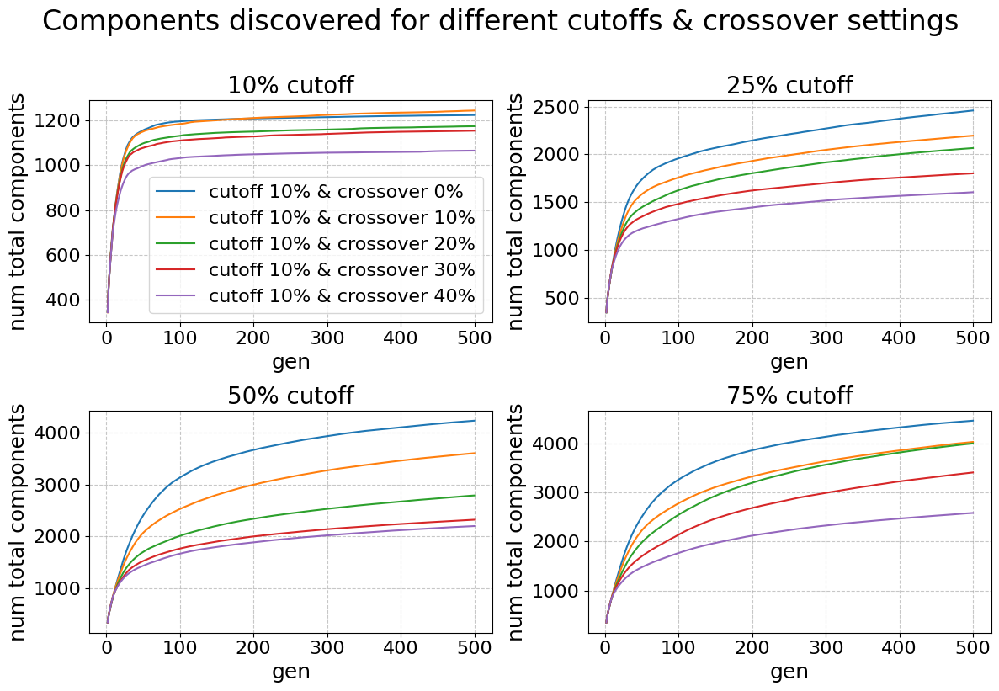

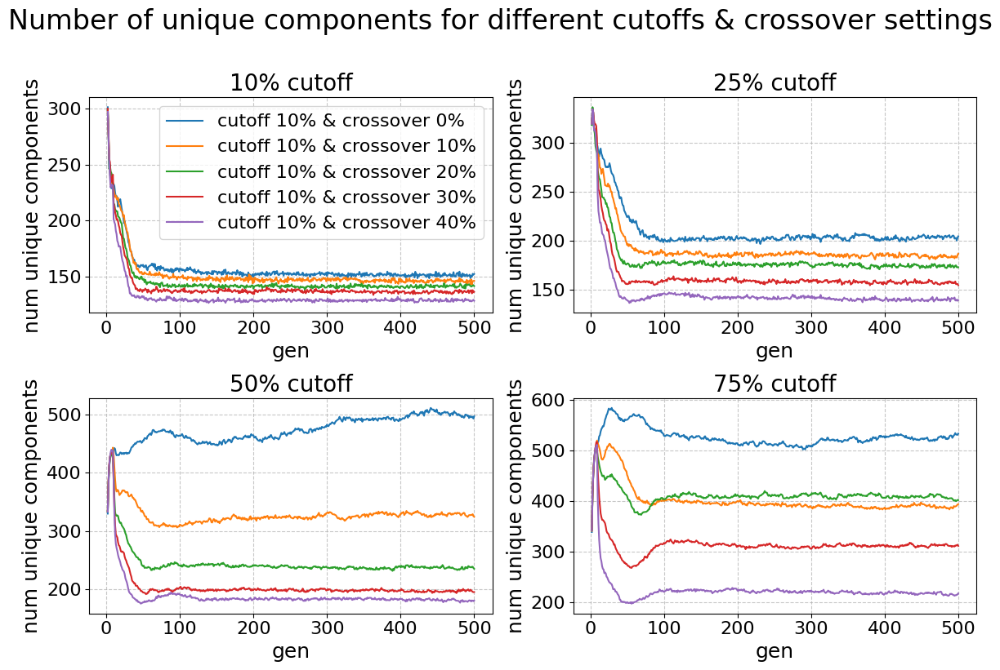

In [21]:
from copy import deepcopy
reload(sa)

# crossover components
_ = sa.generalized_lineplot(crossover_plt_layout, crossover_data_sources, "num_total_components", title="Components discovered for different cutoffs & crossover settings", subplt_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], show_all_legends=False)
_.savefig(analysis_plot_fp + "truncation/cutoff_crossover_total_components.pdf", bbox_inches='tight', pad_inches=0.1)
_ = sa.generalized_lineplot(crossover_plt_layout, crossover_data_sources, "num_unique_components", title="Number of unique components for different cutoffs & crossover settings", subplt_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], legend_loc="upper right", show_all_legends=False)
_.savefig(analysis_plot_fp + "truncation/cutoff_crossover_unique_components.pdf", bbox_inches='tight', pad_inches=0.1)


**num components**

* Here the effect of the cutoff parameter can be seeen dramatically. As indicated in the regression, a low cutoff leads to much fewer components. However only a really low cutoff of 10% leads to an early plateau, all other cutoff levels continue to grow the number of components discovered, albeit more slowly for the lower cutoffs.

* Crossovers decreasing effect is also clearly visible here

**unique components**

* Independent of the chosen cutoff setting, all graphs show that there are roughly ~300 components in the first generation. All graphs generally decrease in the number of unique components and then plateau (one exception: 0% crossover, 50% cutoff - at least for the observed number of generations). The difference is how long it takes until this stagnation starts

    * With a low spawn cutoff (10% & 25%), the diversity starts to decrease pretty much at the start.

    * With a higher cutoff (50% & 75%), the diversity continues to rise for longer. and there are more unique components both at the peak and also towards the end of the run.

    * I think the decline in unique componenets starts as soon as the population starts to improve. Because it takes much longer to filter for good genomes with a high cutoff, the selection pressure on components is lower for a longer amount of time. That it takes longer to improve in fitness with a high cutoff is self-evident, but it can also be seen in the next graphs which plot fitness.



* The negative effect of crossover on diversity becomes very visible, especially in the 4th. Quadrant. Crossover is only enabled after 10 generations, after which pretty much all setups except the 0% crossover start to immediately decline, and based on the crossover rate, the decline in the number of unique components is stronger the higher the chosen crossover.

**Calculating the total number of possible components:**
I think the total number of possible components can be calculated by considering all the connection that a place may have to transitions (not considering nets with hidden transitions here). For each transition there are three possibilities when connecting to a place:
* no connection
* outgoing
* incoming

The algorithm prevents symmetric connections between places and transitions, thus the number of possible connections and thus also components should be:

$3^{\sum transitions} = 3^{8} = 6561$

The setups with >= 50% cutoffs thus reach about half the search space with a population size of 500 within 500 generations, i.e. 250.000 models (though a lot of them share components or are elite spawns). This shows that the selection pressure does indeed work to stop the algorithm from just testing every random connection.





 ### Cutoff ~ elitism - diversity, convergence & fitness

 After investigating the relation of crossover and cutoff, lets do the same for elitism.

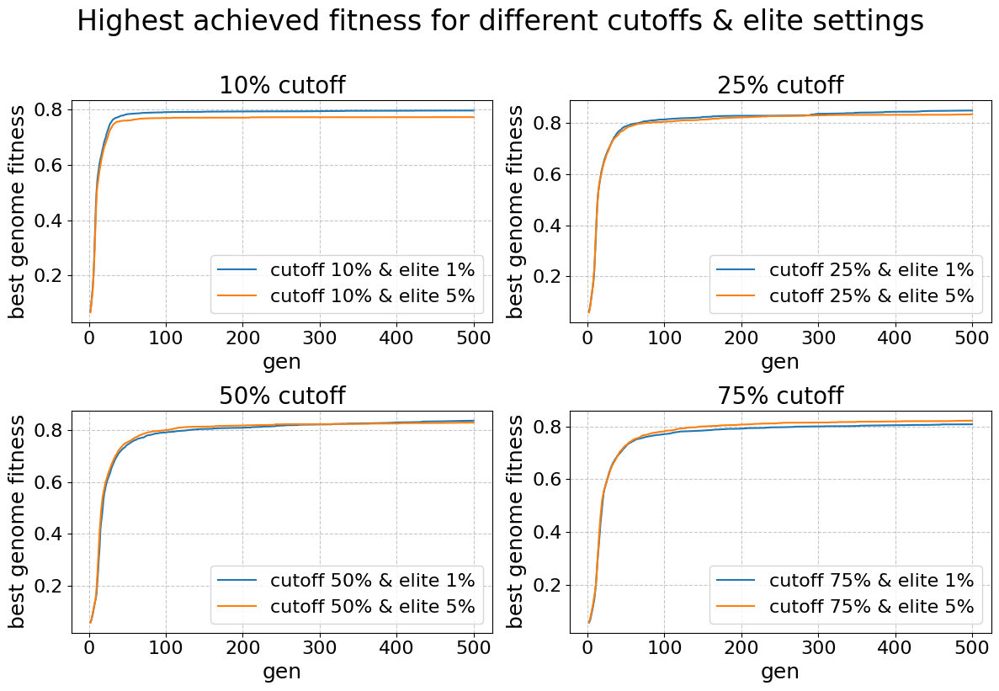

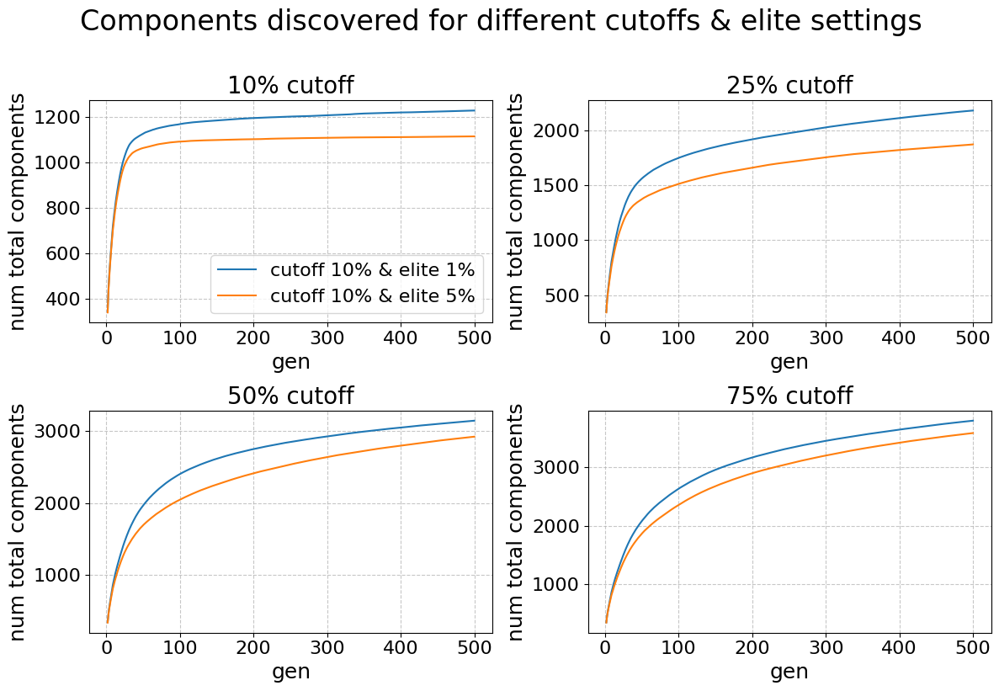

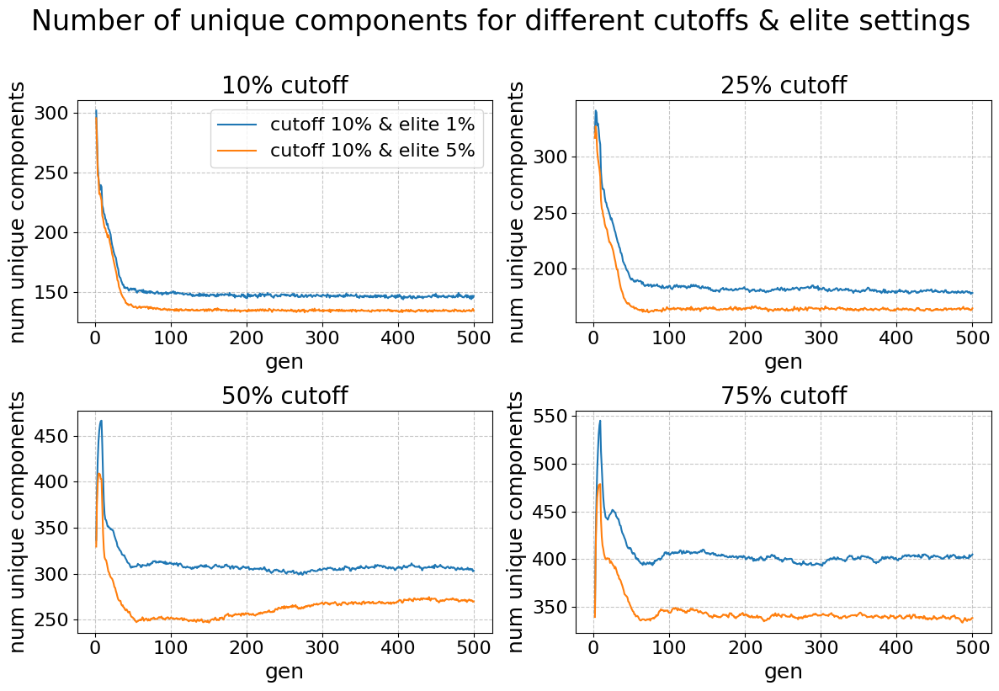

In [24]:
_ = sa.generalized_lineplot(elite_plt_layout, elite_data_sources, "best_genome_fitness", title="Highest achieved fitness for different cutoffs & elite settings", subplt_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"])
_ = sa.generalized_lineplot(elite_plt_layout, elite_data_sources, "num_total_components", title="Components discovered for different cutoffs & elite settings", subplt_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], show_all_legends=False)
_ = sa.generalized_lineplot(elite_plt_layout, elite_data_sources, "num_unique_components", title="Number of unique components for different cutoffs & elite settings", subplt_titles=["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"], legend_loc="upper right", show_all_legends=False)
_.savefig(analysis_plot_fp + "truncation/cutoff_elite_unique_components.pdf", bbox_inches='tight', pad_inches=0.1)




 This time, the plots tell a consistent story:



 **fitness:**

 * cutoffs 0.1, 0.25, 0.5: lower elitism -> very slightly higher fitness

 * cutoff 0.75: higher elitism -> very slightly higher fitness



 **num components:**

 * lower elitism -> more components discovered



 **unique components:**

 * lower elitism -> more components preserved for longer

 ### Truncation spawn plots

 The following plots show the distribution of spawns each fitness rank gets. I.e. I rank the previous generation by fitness in descending order, then check the current generations parent ids and increment the number of spawns the parents fitness rank got. This means that it is just the parents position in the fitness ranking matters, and the plot effectively shows what fraction of the entire population gets to procreate.



 The spawn rank plots shown here are from setups using 1% elitism, all 4 cutoff settings, as well as either 0% or 30% crossover, resulting in 8 plots.

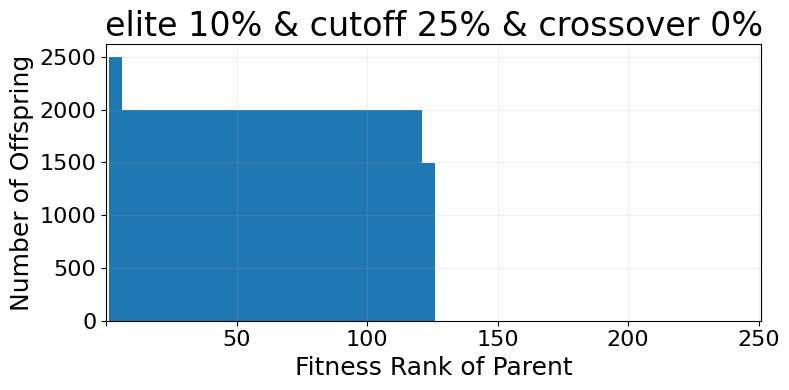

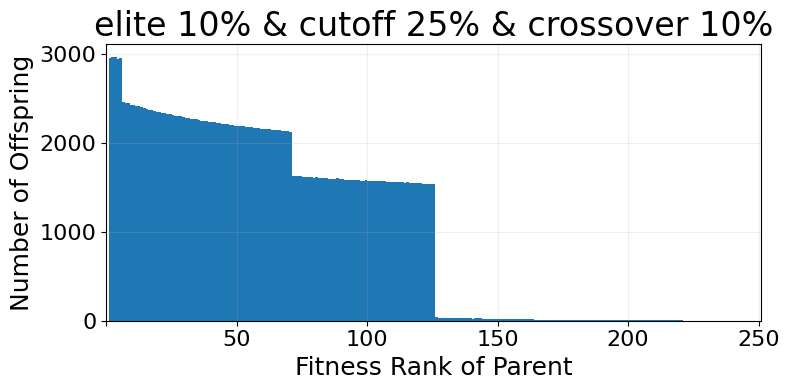

In [55]:
from copy import deepcopy
reload(sa)

chosen_setups = [
    "cutoff 25% & crossover 0%", "cutoff 25% & crossover 10%",
]

# chosen_setups = [
#     "cutoff 10% & crossover 0%", "cutoff 10% & crossover 30%",
#     "cutoff 25% & crossover 0%", "cutoff 25% & crossover 30%",
#     "cutoff 50% & crossover 0%", "cutoff 50% & crossover 30%",
#     "cutoff 75% & crossover 0%", "cutoff 75% & crossover 30%"
# ]

# using a fixed 0.01 elitism rate
search_params = {}
for d_id in chosen_setups:
    data = deepcopy(cutoff_crossover_search[d_id])
    data["pop_perc_elite"] = 0.01
    search_params[d_id] = data

# filtering for the setups containing these settings and plotting their aggregated spawn ranks
# t = 'Offspring by Fitness Rank: elite 10% & '
t = 'elite 10% & '
search_res = sa.search_setups(res, search_params)
for s_name, s_id in sorted(search_res.items(), key= lambda x: x[0]):
    rs_data = res["setups"][s_id[0]]['spawn_rank_agg']
    _ = sa.plot_offspring_distribution(rs_data, title=t+s_name, cap_limit=250, fsize=(8,4))
    _.savefig(analysis_plot_fp + f"truncation/offspring_{s_id[0]}.pdf", bbox_inches='tight', pad_inches=0.1)


**Spawn rank plot observations:**

The first two plots show a 10% cutoff. With no crossover, it is really only the first 50 genomes that get to spawn. The first spike in the barplot is the result of the 5 elites. The small chip at the end of the bar is because the iteration of the remaining asex spawns could not quite finish.

When using crossover, the distribution caused by tournament selection is stacked on top of the normal cutoff selection. With a low cutoff of just 10%, the tail of crossover distribution extends out of the truncated section of the population.

This basic pattern continues for all other cutoff plots as well. With 25% cutoff, exactly the top 125 genomes get to spawn offspring, at 50% It is exactly half the population at 250, and with 75%, 375 members of the population get to spawn.

At 75%, the effect of iterating with modulo over the population becomes very visible. The first spawn loop iteration spawns 375 genomes. Add to that 5 elite spawns, that leaves 500 - 380 = 120 spawns for the second iteration when using no crossover. With crossover of 30%, the asex spawns are only 500*0.7=350 to begin with, allowing for just about that many asex spawns, and there is no visible step in the histogram. Thus crossover further intensivies elitism, because the second iteration of the spawn loop after all selected genomes had their first asex spawn becomes shorter.

Another thing that can be seen in those spawn rank plots is that with an increasing fraction of the population that gets to spawn into the next generation, the delta between the number of offspring the elites get relative to the rest of the spawning population becomes even more pronounced, as a higher cutoff leads to fewer spawns per member that makes the cutoff.

 ### Truncation - Overall results comparison

 Lastly, I will look at the maximum fitness achieved by each setup - aggregated across all 20 runs and sorted by the mean of the aggregate to identify the best setups.

In [9]:
max_fitness_results = sa.get_best_setups(res["final_report"])
max_fitness_results.head(10)


setupname,mean_fitness,max_fitness,median_fitness,std_fitness
str,f64,f64,f64,f64
"""setup_12""",0.874216,0.903509,0.903509,0.060692
"""setup_11""",0.869983,0.903509,0.893939,0.056047
"""setup_40""",0.861852,0.903509,0.891304,0.057745
"""setup_24""",0.86062,0.903509,0.903509,0.074118
"""setup_22""",0.852567,0.903509,0.888986,0.069148
"""setup_28""",0.85086,0.903509,0.888986,0.063484
"""setup_14""",0.849953,0.903509,0.886667,0.061867
"""setup_25""",0.844953,0.903509,0.888986,0.06832
"""setup_16""",0.840538,0.903509,0.883536,0.071115


 **Disclaimer about fitness values**

 As already suggested by the linear regression - the effects of the tested parameters on fitness are not that big in absolute numbers. However, we have to consider that the range of possible fitness in my normalized fitness function is just 0-1, so so a difference in mean fitness of about 3,5% between the best and 10th. best should be considered when selecting parameters. Especially because the fitness function is also weighted more heavily towards the aggregated replay fitness which alone does not tell the complete story about a model's quality. And while the num-arcs score cannot reach perfect fitness, even small differences of one or two arcs more or less can have a huge impact on both a models performance on unseen trace variants not in the log, as well as readability.



 Thus I want to pay attention to these results, even though the numeric differences are pretty small.



 The parameter configurations for each setup can be obtained from the `data/truncation_test/param_changes.txt` file.



 **Results**

 * All but 4 selection strategies managed to discover the optimum process model for the simple log (max fitness = 0.903509), which is encouraging.

 * The best two setups according to their mean achieved fitness (12 & 11) both use 25% cutoff and 1% elitism, with setup 12 using 10% crossover spawns and 11 using no crossover. This seems consistent with the testing thus far, and this result can also be seen in the [barplots showing the mean fitness](#interaction-cutoff--crossover-on-absolute-fitness-and-number-of-components-at-the-end-of-run).

 * The 3rd best setup follows the radically different strategy of using a 75% spawn cutoff but with 40% crossover and 5% elitism, indicating that the crossover's tournament selection method almost acts as a sort of elitism, buffering against the fitness decline that results from using a high cutoff as is the case with setups 31-40.

 * Setup 24 offers a middle ground, using 50% cutoff, but also 30% crossover (1% elites). Setup 22 is simillar, but it uses just 10% elitism

 * the rest of the top 10 uses either 25% or 50% cutoff. None of the 10% cutoff setups are present in the top ten, and the only 75% cutoff that made the cut is setup 40.

### Truncation selection - summarized findings
Since all the parameters are in theory continuous, I could not test every possible value - nor would that have been productive. It seems that discarding about 75% of the population while keeping a very small number of elites and crossover spawns yields the best results for truncation selection.

At least for this small log, there does not really seem to be a relation between total search space coverage (i.e. total num components discovered) and achieved fitness, which is why a more focused search yields the best results. This does make sense, there is a combinatorial explosion of possible components, and with the simple log just consisting of 8 unique tasks and no necessity for hidden transitions, it is encouraging that a search space coverage of less than 50% percent ([total components: ~6.500](#cutoff--crossover---diversity--convergence)) is generally a good path for finding the optimum.

Next, I will investigate the roulette selection strategy.

 ## Selection strategy - roulette

 For the roulette selection strategy there is no cutoff that needs to be manually set. The likelihood of spawning an offspring is directly dependant on a genomes fitness relative to the rest of the population. Numpys weighted random choice function is used, the weights being calculatd on a genomes share of fitness relative to the total population.

 The "roulette" analogy comes from spinning a roulette wheel, where the segments sizes are adjusted according to the fitness.

 Except for cutoff, the same parameter permutations were used:

 * `pop_perc_elite`: 0.01, 0.05

 * `pop_perc_crossover`: 0.0, 0.1, 0.2, 0.3, 0.4



 resulting in 2 * 5 = just 10 setups.



 ### Regression on roulette parameters

 Again, the first step is a regression on the chosen parameters. I expect the parameters to have very similar effects to those they had with truncation selection.

In [56]:
# crawl the results data and load it into a dict
roulette_res = sa.exec_results_crawler("../analysis/data/roulette_test", force_recalculation=True, load_best_genomes=False)


Processing setup directories: 0it [00:00, ?it/s]

setup_1


Processing setup directories: 4it [00:13,  3.35s/it]


Saved aggregated results for setup_1
setup_10


Processing setup directories: 5it [00:26,  6.01s/it]


Saved aggregated results for setup_10
setup_2


Processing setup directories: 6it [00:40,  8.17s/it]


Saved aggregated results for setup_2
setup_3


Processing setup directories: 7it [00:55,  9.99s/it]


Saved aggregated results for setup_3
setup_4


Processing setup directories: 8it [01:08, 10.93s/it]


Saved aggregated results for setup_4
setup_5


Processing setup directories: 9it [01:21, 11.50s/it]


Saved aggregated results for setup_5
setup_6


Processing setup directories: 10it [01:33, 11.76s/it]


Saved aggregated results for setup_6
setup_7


Processing setup directories: 11it [01:45, 11.81s/it]


Saved aggregated results for setup_7
setup_8


Processing setup directories: 12it [01:58, 12.05s/it]


Saved aggregated results for setup_8
setup_9


Processing setup directories: 13it [02:10, 10.06s/it]


Saved aggregated results for setup_9


In [58]:
roulette_regression = sa.run_regression(roulette_res, ["pop_perc_elite", "pop_perc_crossover"]);
roulette_regression

\begin{table}[h]
\centering
 \begin{tabular}{lll}
\toprule \rowcolor[gray]{0.9}
 & \makecell{\textbf{num\_components}\\ (Adj R² = 0.8749)} & \makecell{\textbf{max\_fitness}\\ (Adj R² = 0.0798)} \\[12pt]
\midrule
pop\_perc\_elite & \makecell{-359.6100 \\ (p$\approx$0.0000)} & \makecell{0.0167 \\ (p$\approx$0.0005)} \\[12pt]
pop\_perc\_crossover & \makecell{-258.3556 \\ (p$\approx$0.0000)} & \makecell{0.0125 \\ (p$\approx$0.0094)} \\[12pt]
\bottomrule
\end{tabular}
 \caption{XXX}
\label{tab:XXX}
\end{table}


,\makecell{\textbf{num\_components}\\ (Adj R² = 0.8749)},\makecell{\textbf{max\_fitness}\\ (Adj R² = 0.0798)}
pop\_perc\_elite,\makecell{-359.6100 \\ (p$\approx$0.0000)},\makecell{0.0167 \\ (p$\approx$0.0005)}
pop\_perc\_crossover,\makecell{-258.3556 \\ (p$\approx$0.0000)},\makecell{0.0125 \\ (p$\approx$0.0094)}


**num components**
Very similar R-Squared for the number of components. Both predictors for num_components are significant. This time elitism had a slightly more negative effect than crossover, while for truncation, the negative effect of crossover was 4 times stronger than elitism. But increasing both parameters predictably decreases the number of components.

**max fitness**
Both parameters have a (very small) positive effect on fitness of about 1% each. Only elitism's effect is significant though. This is also in contrast to truncation selection, where elitism has a negative effect on fitness (at least when using more than 1%).

**On crossover**
It should be noted here that crossover in the roulette selection functions differently than in the truncation and speciation selection methods. Both use a tournament selection to find mates, whereas the roulette selection method simply uses the weighted probabilities again for selecting two mates. Thus a difference in the effectiveness of crossover for roulette could be at least partially explained by the difference in how parents are selected for crossover.

 ### Interaction crossover ~ elitism on absolute fitness and number of components at the end of run

 This time, there are only two parameters that were tested, meaning I can easily visualize their effects using simple barplots. Thus there are also no aggregations of the other parameter settings as was the case with elitism/crossover in truncation visualizations.

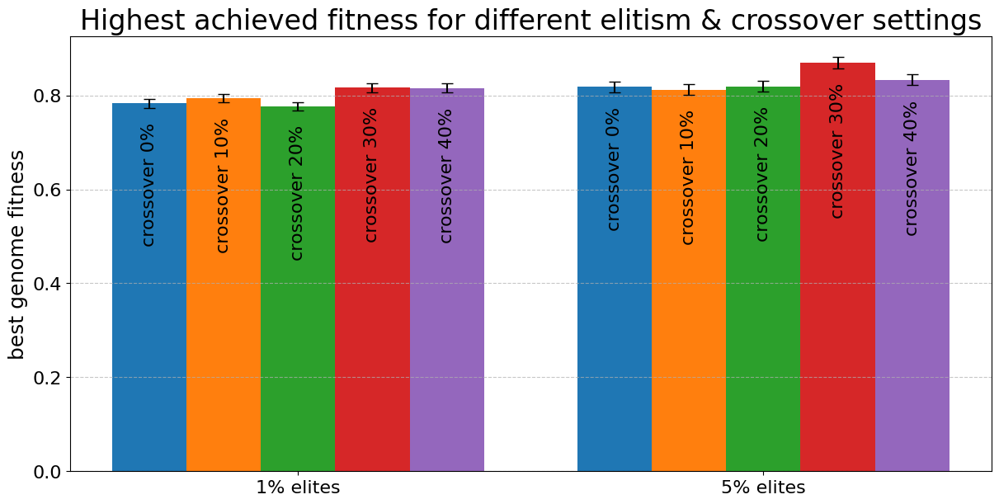

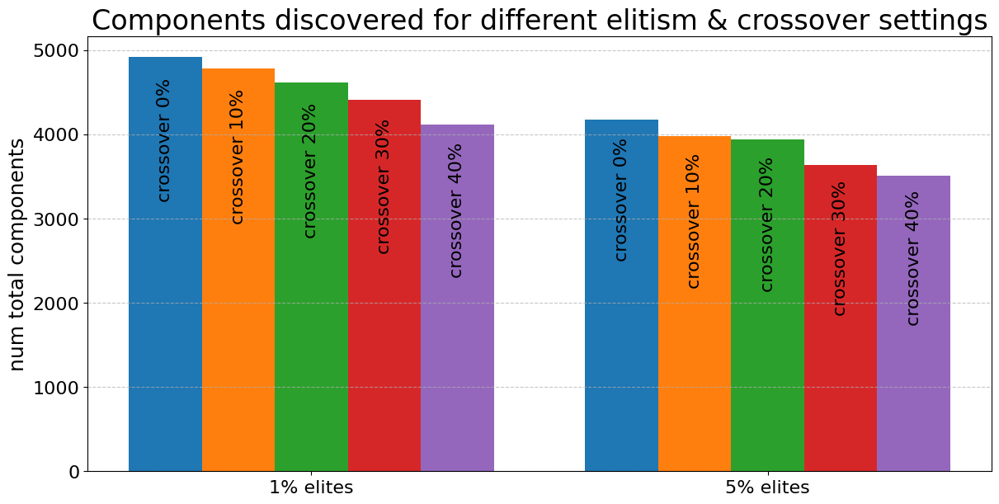

In [59]:
roulette_search = {
    "crossover 0% & elite 1%": {"pop_perc_crossover": 0.0 , "pop_perc_elite": 0.01}, "crossover 0% & elite 5%": {"pop_perc_crossover": 0.0 , "pop_perc_elite": 0.05}, 
    "crossover 10% & elite 1%": {"pop_perc_crossover": 0.10, "pop_perc_elite": 0.01}, "crossover 10% & elite 5%": {"pop_perc_crossover": 0.10 , "pop_perc_elite": 0.05}, 
    "crossover 20% & elite 1%": {"pop_perc_crossover": 0.20, "pop_perc_elite": 0.01}, "crossover 20% & elite 5%": {"pop_perc_crossover": 0.20, "pop_perc_elite": 0.05}, 
    "crossover 30% & elite 1%": {"pop_perc_crossover": 0.30, "pop_perc_elite": 0.01}, "crossover 30% & elite 5%": {"pop_perc_crossover": 0.30, "pop_perc_elite": 0.05}, 
    "crossover 40% & elite 1%": {"pop_perc_crossover": 0.40, "pop_perc_elite": 0.01}, "crossover 40% & elite 5%": {"pop_perc_crossover": 0.40, "pop_perc_elite": 0.05}, 
}


roulette_plt_layout = [
    ["crossover 0% & elite 1%", "crossover 10% & elite 1%", "crossover 20% & elite 1%", "crossover 30% & elite 1%", "crossover 40% & elite 1%"],
    ["crossover 0% & elite 5%", "crossover 10% & elite 5%", "crossover 20% & elite 5%", "crossover 30% & elite 5%", "crossover 40% & elite 5%"]
]

 
strip_second_param = lambda l: l.split('&')[0].strip().split('\n')[0] # lambda to be applied on labels
roulette_data_sources = sa.search_and_aggregate_param_results(roulette_res, roulette_search)
_ = sa.generalized_barplot(roulette_plt_layout, roulette_data_sources, "best_genome_fitness", title="Highest achieved fitness for different elitism & crossover settings", group_titles=["1% elites", "5% elites"], label_lambda=strip_second_param)
_.savefig(analysis_plot_fp + "roulette/crossover_elitism_fitness.pdf", bbox_inches='tight', pad_inches=0.1)
_ = sa.generalized_barplot(roulette_plt_layout, roulette_data_sources, "num_total_components", title="Components discovered for different elitism & crossover settings", group_titles=["1% elites", "5% elites"], label_lambda=strip_second_param)
_.savefig(analysis_plot_fp + "roulette/crossover_elitism_components.pdf", bbox_inches='tight', pad_inches=0.1)



 Again, an inverse relation between the fitness and number of components discovered can be seen. While higher elitism leads to fewer components discovered, it also leads to higher fitness. But the fitness difference is not much. Overall the components plot also suggests that roulette selection selects from a much larger subset of the population, as it averaged a relatively high number of components discovered in 500 generations. The 0% crossover, 1% elites combination leads to close to 5.000 components discovered, which is roughly 75% percent of possible components.

 ### elitism ~ crossover - fitness

 First, lets look at the fitness progression when using the different crossover and fitness settings

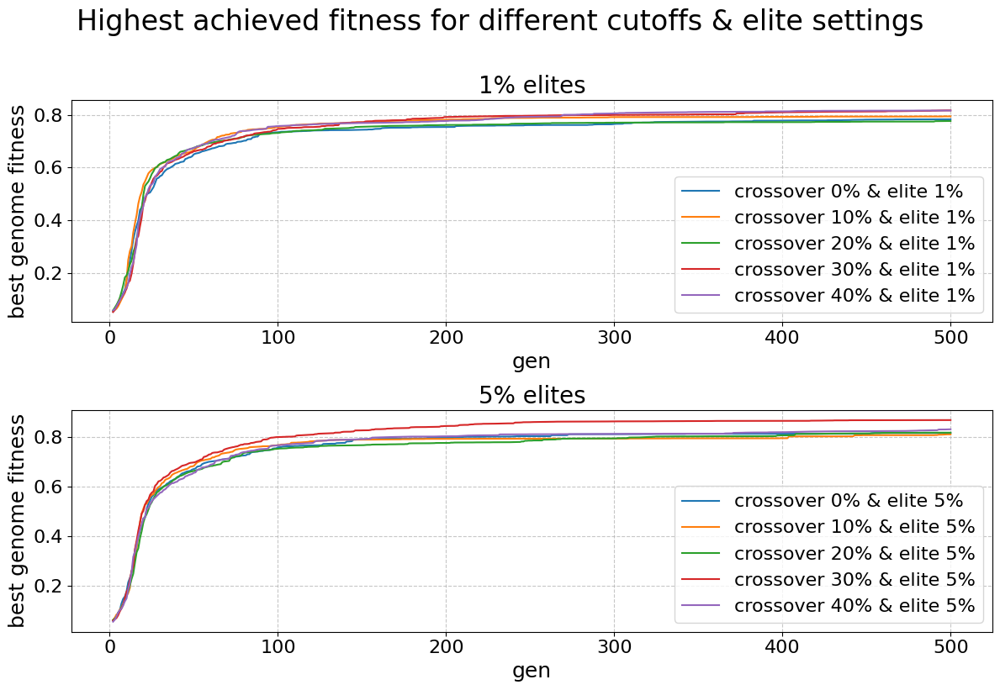

In [60]:
_ = sa.generalized_lineplot(roulette_plt_layout, roulette_data_sources, "best_genome_fitness", title="Highest achieved fitness for different cutoffs & elite settings", subplt_titles=["1% elites", "5% elites"])


 Not much of a difference, though it becomes visible that with a higher degree of elitism, roulette convergess earlier on a high fitness. Also, the only notable setup difference here is the much better fitness performance of 30% crossover when using 5% elitism, whose line is pretty seperated from the other setups. It also seems that this setup was the best overall, as can be seen in the barcharts above. The setup comparison at the end will reveal just how much better this setup is than all other tested setups.

 ### elitism ~ crossover - diversity, convergence

 Next I will look again at the search space coverage and convergence on a set of components.

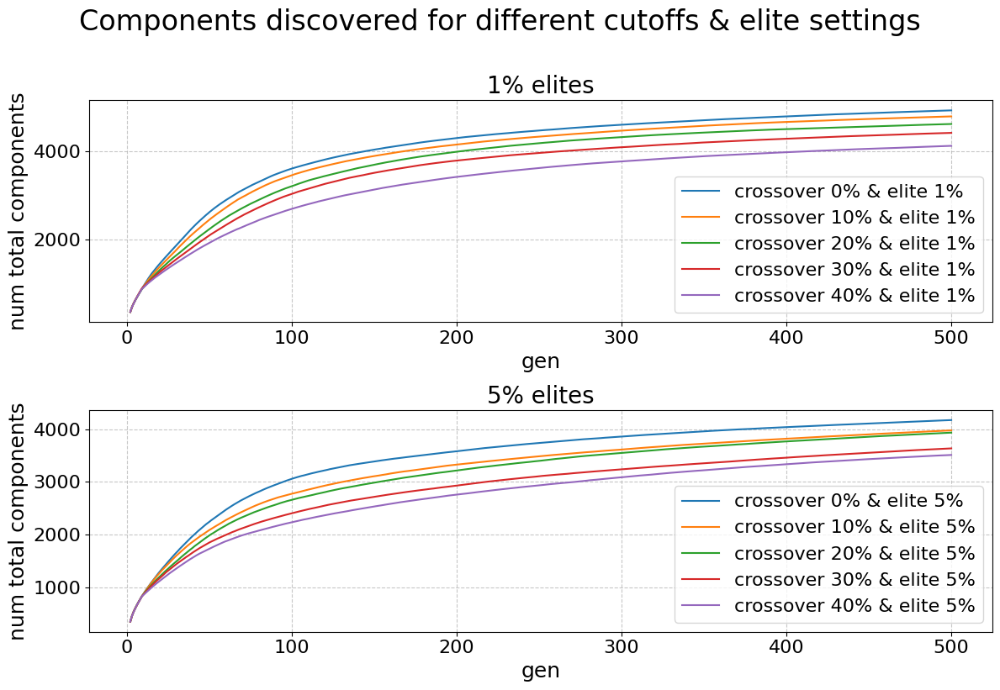

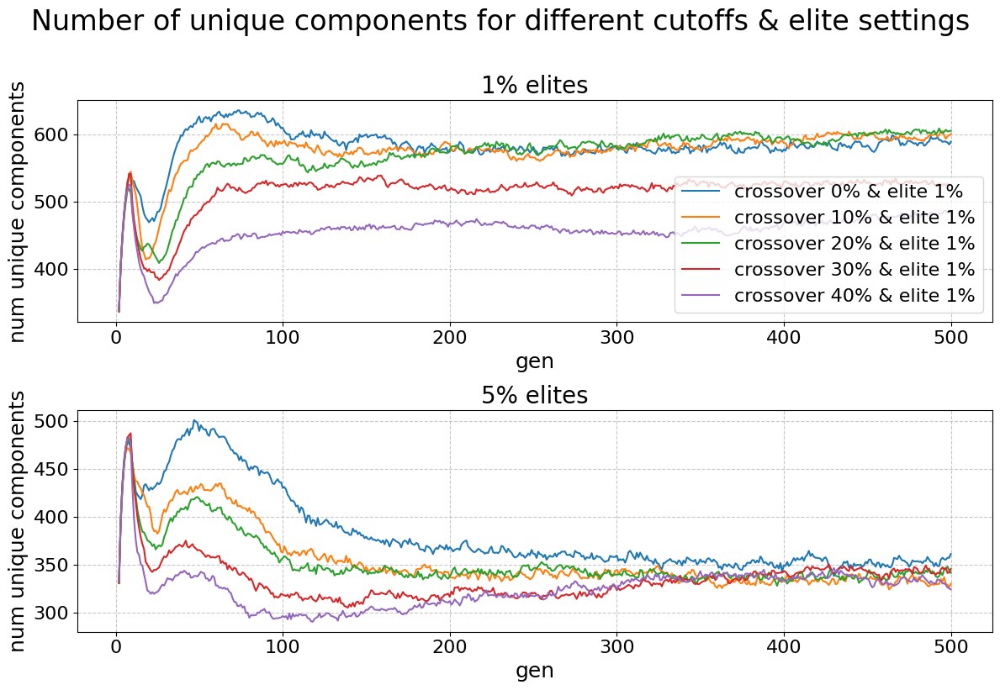

In [63]:
_ = sa.generalized_lineplot(roulette_plt_layout, roulette_data_sources, "num_total_components", title="Components discovered for different cutoffs & elite settings", subplt_titles=["1% elites", "5% elites"])
_ = sa.generalized_lineplot(roulette_plt_layout, roulette_data_sources, "num_unique_components", title="Number of unique components for different cutoffs & elite settings", subplt_titles=["1% elites", "5% elites"], legend_loc="lower right", show_all_legends=False)
_.savefig(analysis_plot_fp + "roulette/crossover_elites_unique_components.pdf", bbox_inches='tight', pad_inches=0.1)


 **num components discovered**

 The graphs make the negative relation between crossover and total number of components discovered visible, both for 1% and 5% elitism, increasing the number of crossover spawns leads to fewer components.



 **num unique components per generation**

 Higher crossover rates generally lead to a lower number of unique components. However the effect of elitism on the number of unique components seems stronger, even though it is only a 4% increase, compared to the total 40% delta between highest and lowest crossover rates. At 5% elitism, after 300 generations it barely makes a difference which crossover setting is used, they all plateau at around ~350 components.



 Also, the the curve of unique components per generation is interesting. Since 5% elitism generally leads to quicker convergence on good genomes (as can be seen in the [fitness graphs](#elitism--crossover---fitness)), the decline of unqiue compoents starts earlier in the bottom graph using 5% elitism.

 ### Roulette spawn plots

 As for truncation selection, here I plot the spawn ranks of different setups. Again, I only visualize the setups with 1% elitism

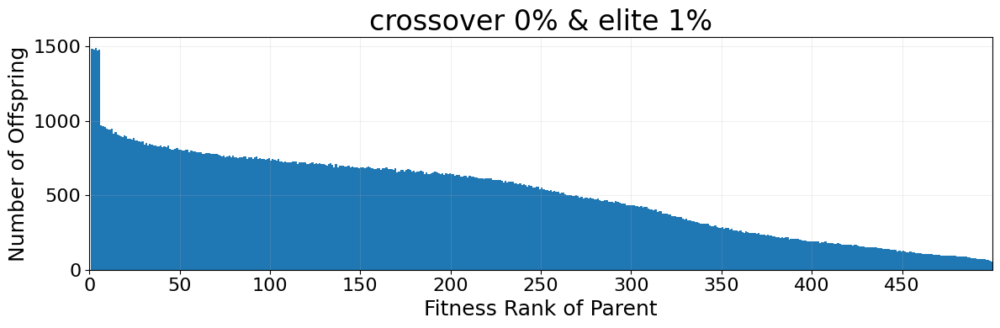

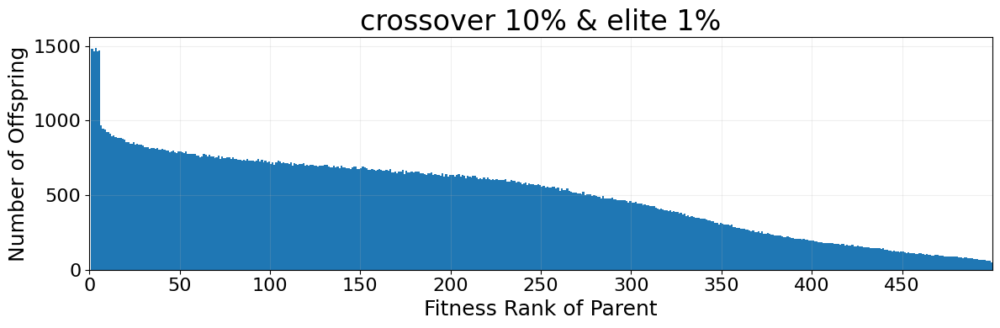

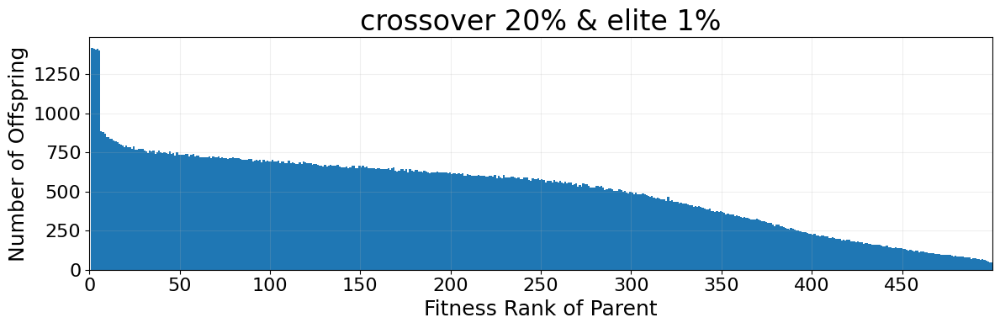

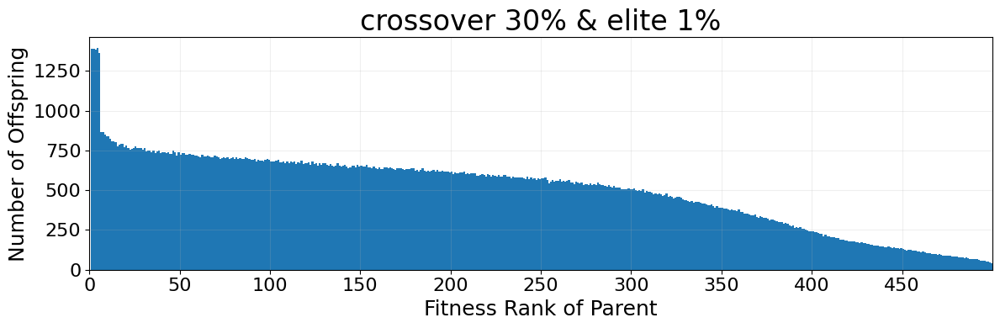

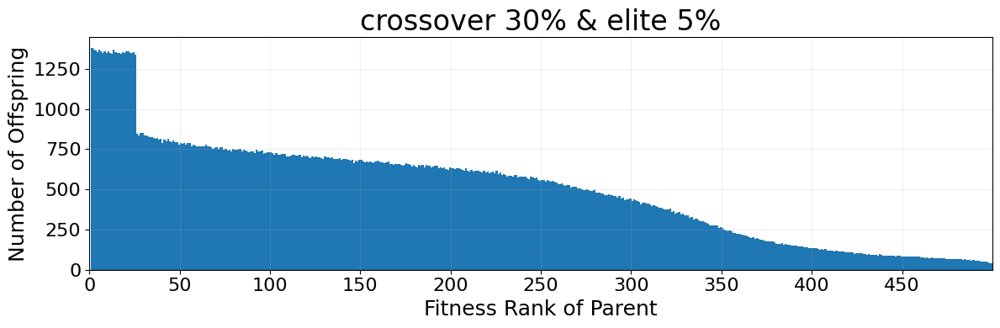

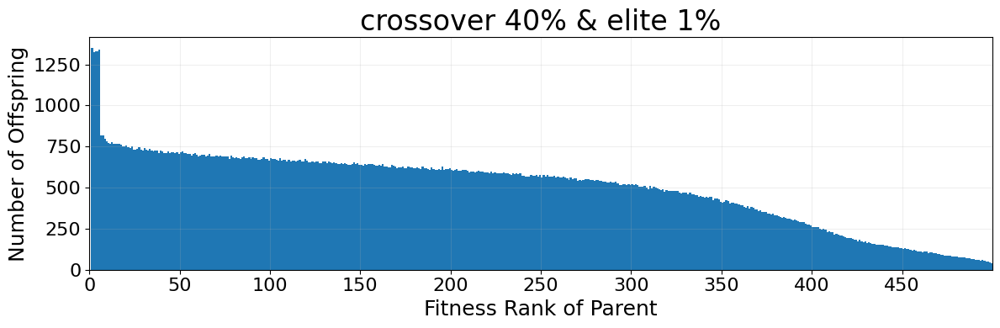

In [80]:
reload(sa)
# only plotting 1% elitism
roulette_sr = ["crossover 0% & elite 1%", "crossover 10% & elite 1%", "crossover 20% & elite 1%", "crossover 30% & elite 1%", "crossover 30% & elite 5%", "crossover 40% & elite 1%"]
roulette_sr_search = {n: roulette_search[n] for n in roulette_sr}

# t = 'Distribution of Offspring by Parent Fitness Rank: '
t = ''
for s_name, s_id in sorted(sa.search_setups(roulette_res, roulette_sr_search).items(), key= lambda x: x[0]):
    rs_data = roulette_res["setups"][s_id[0]]['spawn_rank_agg']
    _ = sa.plot_offspring_distribution(rs_data, title=t+s_name, fsize=(12,4))
    if s_name == "crossover 30% & elite 5%":
        _.savefig(analysis_plot_fp + f"roulette/offspring_{s_id[0]}.pdf", bbox_inches='tight', pad_inches=0.1)


 **Spawn rank plot observations**

 On first glance, there is hardly any difference between the plots. However, when looking at them in detail, one can see that with increasing crossover rates, the distribution becomes less heavy on the left side, e.g. with 0% crossover, almost all of the top 50 genomes get to spawn more than 800 offspring over a whole run, while at 40% crossover - with exception of the elite spawns - the top 50 spawn less than 800 genomes on average.



 It thus seems that roulette-based crossover's spawn selection distribution is flatter. Thats about it for the differences between the plots.



 Compared to truncation selection, the roulette's spawn selections' tail reaches all the way to the end of the distribution. It is also a reflection of the distribution of relative fitness among the population, as this is what determines the spawns. Looking at it from this lense, we can see that for the first ~350 genomes, the fitness decreases, but only slightly. After that, the rate of the decline increases a bit. This does not really suggest that the first ~350 genomes are that much fitter than the last ~150 - I would assume they are all pretty bad. **TODO: add reference to best vs. avg. fitness comparisons**. However it does show that the fitness differences within most of the population are pretty small.

 ### Roulette - Overall results comparison

 As a last step, I want to identify the best setup.

 As the fitness plot already shows, the best setup uses 30% crossover with 5% elitism.

In [16]:
roulette_fitness_results = sa.get_best_setups(roulette_res["final_report"])
roulette_fitness_results


setupname,mean_fitness,max_fitness,median_fitness,std_fitness
str,f64,f64,f64,f64
"""setup_9""",0.870063,0.903509,0.894065,0.053811
"""setup_10""",0.832869,0.903509,0.856967,0.072317
"""setup_8""",0.819275,0.903509,0.837828,0.069322
"""setup_6""",0.817839,0.896825,0.814547,0.067619
"""setup_4""",0.816489,0.903509,0.812495,0.063141
"""setup_5""",0.815801,0.903509,0.824509,0.071996
"""setup_7""",0.812401,0.903509,0.810001,0.072702
"""setup_2""",0.793853,0.903509,0.767175,0.070014
"""setup_1""",0.782706,0.880952,0.794814,0.058586


 **Results**

 * Only the top 3 setups managed to discover the optimum process model for the simple log (max fitness = 0.903509), and there is overall a much bigger difference among the setups when compared to truncation selection. The best setup is 4% better than the second best and almost 10% better than the worst.

 * The setups using 5% elitism (6-10) dominate the charts, the best setup with 1% elitism is setup 4 with 1% elitism and 30% crossover in place 5. The only 5% elitism setup that ranks among the 1%ers is setup 7, with a crossover rate of 10% - all other 5%ers do much better.

 * Maybe it would have been interesting to test with more than 5% elitism, but this made the comparison to truncation easier, and vastly reduced the number of setups that I needed to run & test. Also, more than 5% elitism does seem a bit excessive and the results from truncation did not suggest to me that there would have been a benefit in increasing elitism much for the roulette strategy. I think the best setup (9) using 5% elitism with a 30% crossover rate hits the sweet spot

### Roulette selection - summarized findings
In contrast to the truncation selection method, when using roulette there is a clear benefit to elitism. There is also a benefit in using crossover, though that benefit seems to be very unique to the 5% elitism 30% crossover combination. Why it is exactly this combination that hits the sweetspot and not say 5%elite and 20% or 40% crossover is unclear to me at the moment, but it does seem important to have a moderate amount of crossover to mix with the elitism.

Overall, the efficiency difference between the best truncation & roulette setups does not seem to be that much, with both having very comparable mean, median and stdev values.

## Speciation selection



Didn't change

* `elitism`: True; False
* `enough_gens_to_change_things` because this should be more a part of mutation tests and I don't want to f*ck with different mutation rates/ annealing anyways
* The multipliers for young/old age

Change
* `species_boundary`: 0.8, 0.9, 0.95
* `pop_perc_crossover`: 0.0, 0.1, 0.2, 0.3, 0.4
* `spawn_cutoff`: 0.1, 0.25, 0.5, 0.75
* `species_component_pool_size`: 1, 5, 10
* `allowed_gens_no_improvement`: 50, inf

This results in 3 * 5 * 4 * 3 * 2 = 360 setups

In [84]:
from importlib import reload # TODO: remove this later
import scripts.helper_scripts.setup_analysis as sa # helper module for fetching setup analysis
reload(sa)
# crawl the results data and load it into a dict
speciation_res = sa.exec_results_crawler("../analysis/data/speciation_test", load_best_genomes=False)


i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:787: SyntaxWarning: invalid escape sequence '\_'
  columns = []
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:815: SyntaxWarning: invalid escape sequence '\m'
  columns.append(col_name)
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:815: SyntaxWarning: invalid escape sequence '\_'
  columns.append(col_name)
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:815: SyntaxWarning: invalid escape sequence '\ '
  columns.append(col_name)
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:815: SyntaxWarning: invalid escape sequence '\_'
  columns.append(col_name)
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:819: SyntaxWarning: invalid escape sequence '\m'
  for coef, p_val in zip(model.coef_, p_values)]
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:819: SyntaxWarning: invalid escape sequence '\ '
  for coef, p_val in zip(model.coef_,

setup_1

Found cached results for setup_1
Successfully loaded cached results for setup_1
setup_10

Found cached results for setup_10
Successfully loaded cached results for setup_10
setup_100

Found cached results for setup_100
Successfully loaded cached results for setup_100
setup_101

Found cached results for setup_101
Successfully loaded cached results for setup_101
setup_102

Found cached results for setup_102
Successfully loaded cached results for setup_102
setup_103

Found cached results for setup_103
Successfully loaded cached results for setup_103
setup_104

Found cached results for setup_104
Successfully loaded cached results for setup_104
setup_105

Found cached results for setup_105
Successfully loaded cached results for setup_105
setup_106

Found cached results for setup_106
Successfully loaded cached results for setup_106
setup_107

Found cached results for setup_107
Successfully loaded cached results for setup_107
setup_108

Found cached results for setup_108
Successfully 

Processing setup directories: 33it [00:00, 94.99it/s] 


Found cached results for setup_111
Successfully loaded cached results for setup_111
setup_112

Found cached results for setup_112
Successfully loaded cached results for setup_112
setup_113

Found cached results for setup_113
Successfully loaded cached results for setup_113
setup_114

Found cached results for setup_114
Successfully loaded cached results for setup_114
setup_115

Found cached results for setup_115
Successfully loaded cached results for setup_115
setup_116

Found cached results for setup_116
Successfully loaded cached results for setup_116
setup_117

Found cached results for setup_117
Successfully loaded cached results for setup_117
setup_118

Found cached results for setup_118
Successfully loaded cached results for setup_118
setup_119

Found cached results for setup_119
Successfully loaded cached results for setup_119
setup_12

Found cached results for setup_12
Successfully loaded cached results for setup_12
setup_120

Found cached results for setup_120
Successfully load

Processing setup directories: 54it [00:00, 82.83it/s]


Found cached results for setup_126
Successfully loaded cached results for setup_126
setup_127

Found cached results for setup_127
Successfully loaded cached results for setup_127
setup_128

Found cached results for setup_128
Successfully loaded cached results for setup_128
setup_129

Found cached results for setup_129
Successfully loaded cached results for setup_129
setup_13

Found cached results for setup_13
Successfully loaded cached results for setup_13
setup_130

Found cached results for setup_130
Successfully loaded cached results for setup_130
setup_131

Found cached results for setup_131
Successfully loaded cached results for setup_131
setup_132

Found cached results for setup_132
Successfully loaded cached results for setup_132
setup_133

Found cached results for setup_133
Successfully loaded cached results for setup_133
setup_134

Found cached results for setup_134
Successfully loaded cached results for setup_134
setup_135

Found cached results for setup_135
Successfully load

Processing setup directories: 63it [00:00, 80.40it/s]

Successfully loaded cached results for setup_14
setup_140

Found cached results for setup_140
Successfully loaded cached results for setup_140
setup_141

Found cached results for setup_141
Successfully loaded cached results for setup_141
setup_142

Found cached results for setup_142
Successfully loaded cached results for setup_142
setup_143

Found cached results for setup_143
Successfully loaded cached results for setup_143
setup_144

Found cached results for setup_144
Successfully loaded cached results for setup_144
setup_145

Found cached results for setup_145
Successfully loaded cached results for setup_145
setup_146

Found cached results for setup_146
Successfully loaded cached results for setup_146
setup_147

Found cached results for setup_147
Successfully loaded cached results for setup_147
setup_148

Found cached results for setup_148
Successfully loaded cached results for setup_148
setup_149

Found cached results for setup_149
Successfully loaded cached results for setup_149
se

Processing setup directories: 81it [00:00, 77.76it/s]

Successfully loaded cached results for setup_154
setup_155

Found cached results for setup_155
Successfully loaded cached results for setup_155
setup_156

Found cached results for setup_156
Successfully loaded cached results for setup_156
setup_157

Found cached results for setup_157
Successfully loaded cached results for setup_157
setup_158

Found cached results for setup_158
Successfully loaded cached results for setup_158
setup_159

Found cached results for setup_159
Successfully loaded cached results for setup_159
setup_16

Found cached results for setup_16
Successfully loaded cached results for setup_16
setup_160

Found cached results for setup_160
Successfully loaded cached results for setup_160
setup_161

Found cached results for setup_161
Successfully loaded cached results for setup_161
setup_162

Found cached results for setup_162
Successfully loaded cached results for setup_162
setup_163

Found cached results for setup_163
Successfully loaded cached results for setup_163
setu

Processing setup directories: 97it [00:01, 72.55it/s]


Found cached results for setup_17
Successfully loaded cached results for setup_17
setup_170

Found cached results for setup_170
Successfully loaded cached results for setup_170
setup_171

Found cached results for setup_171
Successfully loaded cached results for setup_171
setup_172

Found cached results for setup_172
Successfully loaded cached results for setup_172
setup_173

Found cached results for setup_173
Successfully loaded cached results for setup_173
setup_174

Found cached results for setup_174
Successfully loaded cached results for setup_174
setup_175

Found cached results for setup_175
Successfully loaded cached results for setup_175
setup_176

Found cached results for setup_176
Successfully loaded cached results for setup_176
setup_177

Found cached results for setup_177
Successfully loaded cached results for setup_177
setup_178

Found cached results for setup_178
Successfully loaded cached results for setup_178
setup_179

Found cached results for setup_179
Successfully loa

Processing setup directories: 113it [00:01, 72.12it/s]

Successfully loaded cached results for setup_181
setup_182

Found cached results for setup_182
Successfully loaded cached results for setup_182
setup_183

Found cached results for setup_183
Successfully loaded cached results for setup_183
setup_184

Found cached results for setup_184
Successfully loaded cached results for setup_184
setup_185

Found cached results for setup_185
Successfully loaded cached results for setup_185
setup_186

Found cached results for setup_186
Successfully loaded cached results for setup_186
setup_187

Found cached results for setup_187
Successfully loaded cached results for setup_187
setup_188

Found cached results for setup_188
Successfully loaded cached results for setup_188
setup_189

Found cached results for setup_189
Successfully loaded cached results for setup_189
setup_19

Found cached results for setup_19
Successfully loaded cached results for setup_19
setup_190

Found cached results for setup_190
Successfully loaded cached results for setup_190
setu

Processing setup directories: 129it [00:01, 72.40it/s]


Found cached results for setup_196
Successfully loaded cached results for setup_196
setup_197

Found cached results for setup_197
Successfully loaded cached results for setup_197
setup_198

Found cached results for setup_198
Successfully loaded cached results for setup_198
setup_199

Found cached results for setup_199
Successfully loaded cached results for setup_199
setup_2

Found cached results for setup_2
Successfully loaded cached results for setup_2
setup_20

Found cached results for setup_20
Successfully loaded cached results for setup_20
setup_200

Found cached results for setup_200
Successfully loaded cached results for setup_200
setup_201

Found cached results for setup_201
Successfully loaded cached results for setup_201
setup_202

Found cached results for setup_202
Successfully loaded cached results for setup_202
setup_203

Found cached results for setup_203
Successfully loaded cached results for setup_203
setup_204

Found cached results for setup_204
Successfully loaded cac

Processing setup directories: 145it [00:01, 72.84it/s]

Successfully loaded cached results for setup_208
setup_209

Found cached results for setup_209
Successfully loaded cached results for setup_209
setup_21

Found cached results for setup_21
Successfully loaded cached results for setup_21
setup_210

Found cached results for setup_210
Successfully loaded cached results for setup_210
setup_211

Found cached results for setup_211
Successfully loaded cached results for setup_211
setup_212

Found cached results for setup_212
Successfully loaded cached results for setup_212
setup_213

Found cached results for setup_213
Successfully loaded cached results for setup_213
setup_214

Found cached results for setup_214
Successfully loaded cached results for setup_214
setup_215

Found cached results for setup_215
Successfully loaded cached results for setup_215
setup_216

Found cached results for setup_216
Successfully loaded cached results for setup_216
setup_217

Found cached results for setup_217
Successfully loaded cached results for setup_217
setu

Processing setup directories: 161it [00:02, 72.47it/s]

Successfully loaded cached results for setup_222
setup_223

Found cached results for setup_223
Successfully loaded cached results for setup_223
setup_224

Found cached results for setup_224
Successfully loaded cached results for setup_224
setup_225

Found cached results for setup_225
Successfully loaded cached results for setup_225
setup_226

Found cached results for setup_226
Successfully loaded cached results for setup_226
setup_227

Found cached results for setup_227
Successfully loaded cached results for setup_227
setup_228

Found cached results for setup_228
Successfully loaded cached results for setup_228
setup_229

Found cached results for setup_229
Successfully loaded cached results for setup_229
setup_23

Found cached results for setup_23
Successfully loaded cached results for setup_23
setup_230

Found cached results for setup_230
Successfully loaded cached results for setup_230
setup_231

Found cached results for setup_231
Successfully loaded cached results for setup_231
setu

Processing setup directories: 177it [00:02, 73.51it/s]


Found cached results for setup_237
Successfully loaded cached results for setup_237
setup_238

Found cached results for setup_238
Successfully loaded cached results for setup_238
setup_239

Found cached results for setup_239
Successfully loaded cached results for setup_239
setup_24

Found cached results for setup_24
Successfully loaded cached results for setup_24
setup_240

Found cached results for setup_240
Successfully loaded cached results for setup_240
setup_241

Found cached results for setup_241
Successfully loaded cached results for setup_241
setup_242

Found cached results for setup_242
Successfully loaded cached results for setup_242
setup_243

Found cached results for setup_243
Successfully loaded cached results for setup_243
setup_244

Found cached results for setup_244
Successfully loaded cached results for setup_244
setup_245

Found cached results for setup_245
Successfully loaded cached results for setup_245
setup_246

Found cached results for setup_246
Successfully load

Processing setup directories: 193it [00:02, 74.63it/s]

Successfully loaded cached results for setup_251
setup_252

Found cached results for setup_252
Successfully loaded cached results for setup_252
setup_253

Found cached results for setup_253
Successfully loaded cached results for setup_253
setup_254

Found cached results for setup_254
Successfully loaded cached results for setup_254
setup_255

Found cached results for setup_255
Successfully loaded cached results for setup_255
setup_256

Found cached results for setup_256
Successfully loaded cached results for setup_256
setup_257

Found cached results for setup_257
Successfully loaded cached results for setup_257
setup_258

Found cached results for setup_258
Successfully loaded cached results for setup_258
setup_259

Found cached results for setup_259
Successfully loaded cached results for setup_259
setup_26

Found cached results for setup_26
Successfully loaded cached results for setup_26
setup_260

Found cached results for setup_260
Successfully loaded cached results for setup_260
setu

Processing setup directories: 209it [00:02, 74.59it/s]

Successfully loaded cached results for setup_266
setup_267

Found cached results for setup_267
Successfully loaded cached results for setup_267
setup_268

Found cached results for setup_268
Successfully loaded cached results for setup_268
setup_269

Found cached results for setup_269
Successfully loaded cached results for setup_269
setup_27

Found cached results for setup_27
Successfully loaded cached results for setup_27
setup_270

Found cached results for setup_270
Successfully loaded cached results for setup_270
setup_271

Found cached results for setup_271
Successfully loaded cached results for setup_271
setup_272

Found cached results for setup_272
Successfully loaded cached results for setup_272
setup_273

Found cached results for setup_273
Successfully loaded cached results for setup_273
setup_274

Found cached results for setup_274
Successfully loaded cached results for setup_274
setup_275

Found cached results for setup_275
Successfully loaded cached results for setup_275
setu

Processing setup directories: 225it [00:02, 73.52it/s]

Successfully loaded cached results for setup_280
setup_281

Found cached results for setup_281
Successfully loaded cached results for setup_281
setup_282

Found cached results for setup_282
Successfully loaded cached results for setup_282
setup_283

Found cached results for setup_283
Successfully loaded cached results for setup_283
setup_284

Found cached results for setup_284
Successfully loaded cached results for setup_284
setup_285

Found cached results for setup_285
Successfully loaded cached results for setup_285
setup_286

Found cached results for setup_286
Successfully loaded cached results for setup_286
setup_287

Found cached results for setup_287
Successfully loaded cached results for setup_287
setup_288

Found cached results for setup_288
Successfully loaded cached results for setup_288
setup_289

Found cached results for setup_289
Successfully loaded cached results for setup_289
setup_29

Found cached results for setup_29
Successfully loaded cached results for setup_29
setu

Processing setup directories: 241it [00:03, 72.40it/s]

Successfully loaded cached results for setup_294
setup_295

Found cached results for setup_295
Successfully loaded cached results for setup_295
setup_296

Found cached results for setup_296
Successfully loaded cached results for setup_296
setup_297

Found cached results for setup_297
Successfully loaded cached results for setup_297
setup_298

Found cached results for setup_298
Successfully loaded cached results for setup_298
setup_299

Found cached results for setup_299
Successfully loaded cached results for setup_299
setup_3

Found cached results for setup_3
Successfully loaded cached results for setup_3
setup_30

Found cached results for setup_30
Successfully loaded cached results for setup_30
setup_300

Found cached results for setup_300
Successfully loaded cached results for setup_300
setup_301

Found cached results for setup_301
Successfully loaded cached results for setup_301
setup_302

Found cached results for setup_302
Successfully loaded cached results for setup_302
setup_303


Processing setup directories: 249it [00:03, 72.46it/s]

Successfully loaded cached results for setup_307
setup_308

Found cached results for setup_308
Successfully loaded cached results for setup_308
setup_309

Found cached results for setup_309
Successfully loaded cached results for setup_309
setup_31

Found cached results for setup_31
Successfully loaded cached results for setup_31
setup_310

Found cached results for setup_310
Successfully loaded cached results for setup_310
setup_311

Found cached results for setup_311
Successfully loaded cached results for setup_311
setup_312

Found cached results for setup_312
Successfully loaded cached results for setup_312
setup_313

Found cached results for setup_313
Successfully loaded cached results for setup_313
setup_314

Found cached results for setup_314
Successfully loaded cached results for setup_314
setup_315

Found cached results for setup_315
Successfully loaded cached results for setup_315
setup_316

Found cached results for setup_316
Successfully loaded cached results for setup_316
setu

Processing setup directories: 265it [00:03, 70.74it/s]

setup_321

Found cached results for setup_321
Successfully loaded cached results for setup_321
setup_322

Found cached results for setup_322
Successfully loaded cached results for setup_322
setup_323

Found cached results for setup_323
Successfully loaded cached results for setup_323
setup_324

Found cached results for setup_324
Successfully loaded cached results for setup_324
setup_325

Found cached results for setup_325
Successfully loaded cached results for setup_325
setup_326

Found cached results for setup_326
Successfully loaded cached results for setup_326
setup_327

Found cached results for setup_327
Successfully loaded cached results for setup_327
setup_328

Found cached results for setup_328
Successfully loaded cached results for setup_328
setup_329

Found cached results for setup_329
Successfully loaded cached results for setup_329
setup_33

Found cached results for setup_33
Successfully loaded cached results for setup_33
setup_330

Found cached results for setup_330
Success

Processing setup directories: 273it [00:03, 55.96it/s]

Successfully loaded cached results for setup_331
setup_332

Found cached results for setup_332
Successfully loaded cached results for setup_332
setup_333

Found cached results for setup_333
Successfully loaded cached results for setup_333
setup_334

Found cached results for setup_334
Successfully loaded cached results for setup_334
setup_335

Found cached results for setup_335
Successfully loaded cached results for setup_335
setup_336

Found cached results for setup_336
Successfully loaded cached results for setup_336
setup_337

Found cached results for setup_337
Successfully loaded cached results for setup_337
setup_338

Found cached results for setup_338
Successfully loaded cached results for setup_338
setup_339


Processing setup directories: 280it [00:03, 49.02it/s]


Found cached results for setup_339
Successfully loaded cached results for setup_339
setup_34

Found cached results for setup_34
Successfully loaded cached results for setup_34
setup_340

Found cached results for setup_340
Successfully loaded cached results for setup_340
setup_341

Found cached results for setup_341
Successfully loaded cached results for setup_341
setup_342

Found cached results for setup_342
Successfully loaded cached results for setup_342
setup_343

Found cached results for setup_343
Successfully loaded cached results for setup_343
setup_344

Found cached results for setup_344
Successfully loaded cached results for setup_344
setup_345

Found cached results for setup_345
Successfully loaded cached results for setup_345
setup_346

Found cached results for setup_346


Processing setup directories: 294it [00:04, 54.57it/s]

Successfully loaded cached results for setup_346
setup_347

Found cached results for setup_347
Successfully loaded cached results for setup_347
setup_348

Found cached results for setup_348
Successfully loaded cached results for setup_348
setup_349

Found cached results for setup_349
Successfully loaded cached results for setup_349
setup_35

Found cached results for setup_35
Successfully loaded cached results for setup_35
setup_350

Found cached results for setup_350
Successfully loaded cached results for setup_350
setup_351

Found cached results for setup_351
Successfully loaded cached results for setup_351
setup_352

Found cached results for setup_352
Successfully loaded cached results for setup_352
setup_353

Found cached results for setup_353
Successfully loaded cached results for setup_353
setup_354

Found cached results for setup_354
Successfully loaded cached results for setup_354
setup_355

Found cached results for setup_355
Successfully loaded cached results for setup_355
setu

Processing setup directories: 310it [00:04, 63.42it/s]

Successfully loaded cached results for setup_360
setup_37

Found cached results for setup_37
Successfully loaded cached results for setup_37
setup_38

Found cached results for setup_38
Successfully loaded cached results for setup_38
setup_39

Found cached results for setup_39
Successfully loaded cached results for setup_39
setup_4

Found cached results for setup_4
Successfully loaded cached results for setup_4
setup_40

Found cached results for setup_40
Successfully loaded cached results for setup_40
setup_41

Found cached results for setup_41
Successfully loaded cached results for setup_41
setup_42

Found cached results for setup_42
Successfully loaded cached results for setup_42
setup_43

Found cached results for setup_43
Successfully loaded cached results for setup_43
setup_44

Found cached results for setup_44
Successfully loaded cached results for setup_44
setup_45

Found cached results for setup_45
Successfully loaded cached results for setup_45
setup_46

Found cached results for

Processing setup directories: 326it [00:04, 70.02it/s]

Successfully loaded cached results for setup_50
setup_51

Found cached results for setup_51
Successfully loaded cached results for setup_51
setup_52

Found cached results for setup_52
Successfully loaded cached results for setup_52
setup_53

Found cached results for setup_53
Successfully loaded cached results for setup_53
setup_54

Found cached results for setup_54
Successfully loaded cached results for setup_54
setup_55

Found cached results for setup_55
Successfully loaded cached results for setup_55
setup_56

Found cached results for setup_56
Successfully loaded cached results for setup_56
setup_57

Found cached results for setup_57
Successfully loaded cached results for setup_57
setup_58

Found cached results for setup_58
Successfully loaded cached results for setup_58
setup_59

Found cached results for setup_59
Successfully loaded cached results for setup_59
setup_6

Found cached results for setup_6
Successfully loaded cached results for setup_6
setup_60

Found cached results for 

Processing setup directories: 342it [00:04, 73.40it/s]

Successfully loaded cached results for setup_66
setup_67

Found cached results for setup_67
Successfully loaded cached results for setup_67
setup_68

Found cached results for setup_68
Successfully loaded cached results for setup_68
setup_69

Found cached results for setup_69
Successfully loaded cached results for setup_69
setup_7

Found cached results for setup_7
Successfully loaded cached results for setup_7
setup_70

Found cached results for setup_70
Successfully loaded cached results for setup_70
setup_71

Found cached results for setup_71
Successfully loaded cached results for setup_71
setup_72

Found cached results for setup_72
Successfully loaded cached results for setup_72
setup_73

Found cached results for setup_73
Successfully loaded cached results for setup_73
setup_74

Found cached results for setup_74
Successfully loaded cached results for setup_74
setup_75

Found cached results for setup_75
Successfully loaded cached results for setup_75
setup_76

Found cached results for 

Processing setup directories: 358it [00:04, 74.13it/s]

setup_81

Found cached results for setup_81
Successfully loaded cached results for setup_81
setup_82

Found cached results for setup_82
Successfully loaded cached results for setup_82
setup_83

Found cached results for setup_83
Successfully loaded cached results for setup_83
setup_84

Found cached results for setup_84
Successfully loaded cached results for setup_84
setup_85

Found cached results for setup_85
Successfully loaded cached results for setup_85
setup_86

Found cached results for setup_86
Successfully loaded cached results for setup_86
setup_87

Found cached results for setup_87
Successfully loaded cached results for setup_87
setup_88

Found cached results for setup_88
Successfully loaded cached results for setup_88
setup_89

Found cached results for setup_89
Successfully loaded cached results for setup_89
setup_9

Found cached results for setup_9
Successfully loaded cached results for setup_9
setup_90

Found cached results for setup_90
Successfully loaded cached results for 

Processing setup directories: 370it [00:05, 71.76it/s]


Found cached results for setup_95
Successfully loaded cached results for setup_95
setup_96

Found cached results for setup_96
Successfully loaded cached results for setup_96
setup_97

Found cached results for setup_97
Successfully loaded cached results for setup_97
setup_98

Found cached results for setup_98
Successfully loaded cached results for setup_98
setup_99

Found cached results for setup_99
Successfully loaded cached results for setup_99


hacky thing to add num of species in the last gen to final reports df such that it can also be in the regression. because I deleted all run data, I only have avg. num of species

In [134]:
fr_df = speciation_res["final_report"].to_pandas()

fr_df['num_species_last_gen'] = fr_df.apply(
    lambda row: speciation_res["setups"][
        int(row['setupname'].split('_')[1])  # Extract setup number
    ]["gen_info_agg"]["num_total_species"][-1],
    axis=1
)
import polars as pl
speciation_res["final_report"] = pl.DataFrame(fr_df)


In [137]:
import polars as pl
reload(sa)
speciation_predictors = [
    "species_boundary", "pop_perc_crossover", "spawn_cutoff",
    "species_component_pool_size", "allowed_gens_no_improvement"
    ]

speciation_regression = sa.run_regression(speciation_res, speciation_predictors, include_species_target=True)
speciation_regression


\begin{table}[h]
\centering
 \begin{tabular}{llll}
\toprule \rowcolor[gray]{0.9}
 & \makecell{\textbf{num\_components}\\ (Adj R² = 0.9313)} & \makecell{\textbf{max\_fitness}\\ (Adj R² = 0.0881)} & \makecell{\textbf{num\_species\_last\_gen}\\ (Adj R² = 0.7259)} \\[12pt]
\midrule
species\_boundary & \makecell{-13.1653 \\ (p$\approx$0.0000)} & \makecell{-0.0003 \\ (p$\approx$0.4135)} & \makecell{-2.1866 \\ (p$\approx$0.0000)} \\[12pt]
pop\_perc\_crossover & \makecell{-260.3900 \\ (p$\approx$0.0000)} & \makecell{0.0096 \\ (p$\approx$0.0000)} & \makecell{-2.6527 \\ (p$\approx$0.0000)} \\[12pt]
spawn\_cutoff & \makecell{927.5552 \\ (p$\approx$0.0000)} & \makecell{-0.0026 \\ (p$\approx$0.0000)} & \makecell{10.6342 \\ (p$\approx$0.0000)} \\[12pt]
species\_component\_pool\_size & \makecell{-30.1037 \\ (p$\approx$0.0000)} & \makecell{0.0008 \\ (p$\approx$0.0443)} & \makecell{-6.3213 \\ (p$\approx$0.0000)} \\[12pt]
allowed\_gens\_no\_improvement & \makecell{-71.9840 \\ (p$\approx$0.0000)} & \make

,\makecell{\textbf{num\_components}\\ (Adj R² = 0.9313)},\makecell{\textbf{max\_fitness}\\ (Adj R² = 0.0881)},\makecell{\textbf{num\_species\_last\_gen}\\ (Adj R² = 0.7259)}
species\_boundary,\makecell{-13.1653 \\ (p$\approx$0.0000)},\makecell{-0.0003 \\ (p$\approx$0.4135)},\makecell{-2.1866 \\ (p$\approx$0.0000)}
pop\_perc\_crossover,\makecell{-260.3900 \\ (p$\approx$0.0000)},\makecell{0.0096 \\ (p$\approx$0.0000)},\makecell{-2.6527 \\ (p$\approx$0.0000)}
spawn\_cutoff,\makecell{927.5552 \\ (p$\approx$0.0000)},\makecell{-0.0026 \\ (p$\approx$0.0000)},\makecell{10.6342 \\ (p$\approx$0.0000)}
species\_component\_pool\_size,\makecell{-30.1037 \\ (p$\approx$0.0000)},\makecell{0.0008 \\ (p$\approx$0.0443)},\makecell{-6.3213 \\ (p$\approx$0.0000)}
allowed\_gens\_no\_improvement,\makecell{-71.9840 \\ (p$\approx$0.0000)},\makecell{0.0000 \\ (p$\approx$0.9828)},\makecell{8.8175 \\ (p$\approx$0.0000)}


Still it seems like the only parameters that have a big impact in terms of components discovered are pop perc crossover and the spawn cutoff.

And there is barely any effect on the fitness based on chosen parameters.
This could also just be because the algorithm converges to the same maximum fitness very often, and if it does not reach the maximum fitness, it comes close enough that the floating point deltas barely register as effect.
Still I can use the significance values to at least see that again the crossover and spawn cutoff are the only ones that really have a measurable impact (even if it is just a very small one).
The component pool size also has a barely significant impact, taking a p of 0.05.

I am especially surprised that species extinction has no impact on the fitness at all.
And extinction of species also leads to lower diversity.

 ### Investigating the effects of num species



 All the params influence how genomes may speciate, and thus the number of species.

 In the following plots, I want to look at the effects of species on performance of the algorithm.

 Because the number of species may fluctuate within a run, I am relying on the number of species in the last generation.



 #### Correlation num species ~ max achieved fitness

 First, A scatterplot of num species vs. max achieved fitness for all setups.

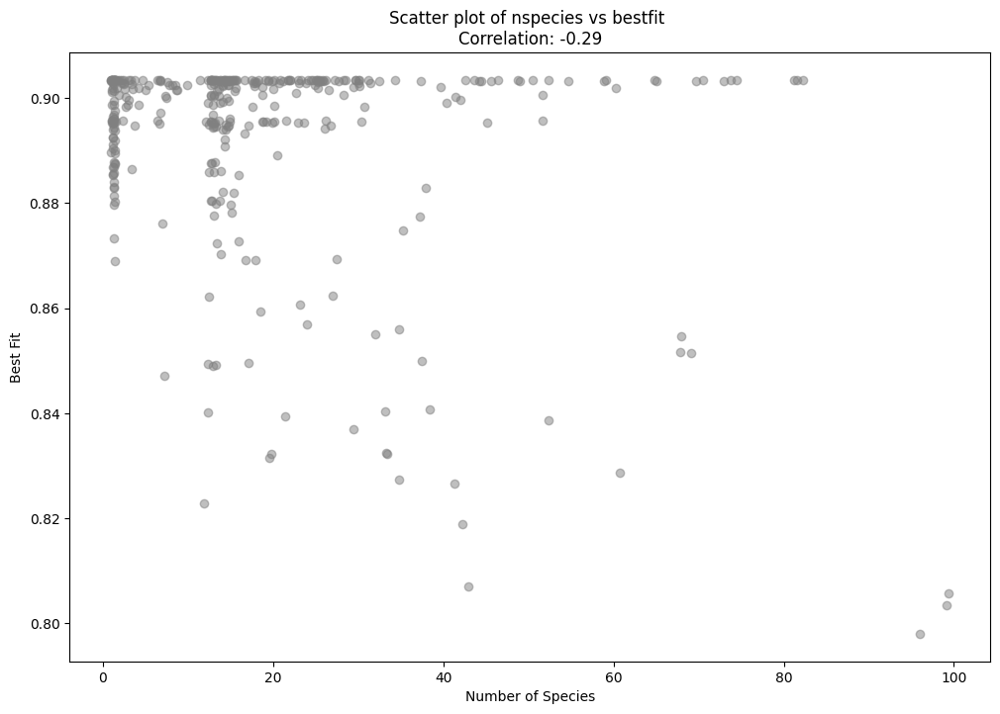

Correlation coefficient: -0.29
P-value: 1.4442724635047018e-08


In [96]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

final_report = speciation_res["final_report"]

nspecies, bestspec, bestfit, nuniquecomp, ntotalcomp = [], [], [], [], []
matching_params = []

for sname in final_report["setupname"].unique():
    snum = int(sname.split("_")[1])
    # average stats in the last generation
    last_gen = speciation_res["setups"][snum]["gen_info_agg"][-1]
    nspecies.append(last_gen["num_total_species"][0])
    bestspec.append(last_gen["best_species_avg_fitness"][0])
    bestfit.append(last_gen["best_genome_fitness"][0])
    nuniquecomp.append(last_gen["num_unique_components"][0])
    ntotalcomp.append(last_gen["num_total_components"][0])
    # params
    p = speciation_res["setups"][snum]["params"]
    matching_params.append({k: p[k] for k in speciation_predictors})

bestfit = np.array(bestfit)
nspecies = np.array(nspecies)
correlation_coefficient, p_value = pearsonr(nspecies, bestfit)

# Plot the scatter plot
plt.figure(figsize=(12, 8))
plt.scatter(nspecies, bestfit, color='grey', alpha=0.5)
plt.title(f'Scatter plot of nspecies vs bestfit \nCorrelation: {correlation_coefficient:.2f}')
plt.xlabel('Number of Species')
plt.ylabel('Best Fit')
plt.show()

print(f'Correlation coefficient: {correlation_coefficient:.2f}')
print(f'P-value: {p_value}')


 It does not seem like there is really any strong correlation between the number of species and the maximum achieved fitness.

 The correlation does seem to be significant though.

 Maybe a non-linear relation, i.e. setups with super small num of species reach lower fitness, but then there is a sweetspot of num species after which the fitness drops again.

 Most observations have 0-20 species.

 Also it is hard to visually differentiate here the super tiny floating-point differences between setups.


 #### Correlation num species ~ best species fitness

 If there are more species, does this lead to a lower maximum achieved species fitness?

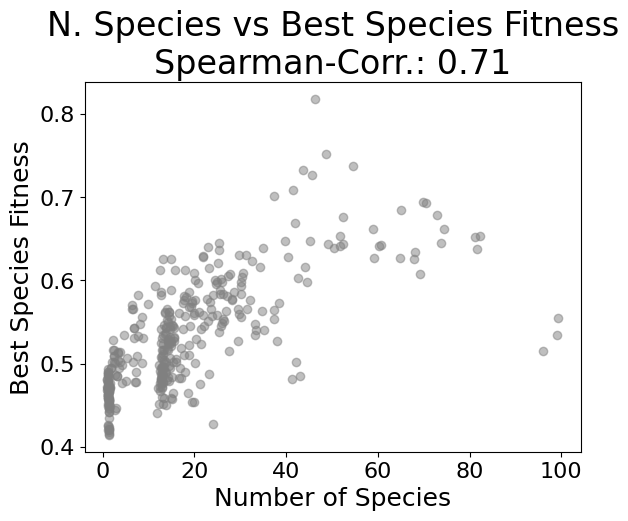

Correlation coefficient: 0.71
P-value: 2.7412345789658867e-56


In [109]:
correlation_coefficient, p_value = pearsonr(nspecies, bestspec)

plt.scatter(nspecies, bestspec, color='grey', alpha=0.5)
plt.title(f'N. Species vs Best Species Fitness\nSpearman-Corr.: {correlation_coefficient:.2f}', fontsize=sa.TITLEFONT)
plt.tick_params(axis='both', labelsize=sa.TICKFONT)
plt.xlabel('Number of Species', fontsize=sa.AXLABELFONT)
plt.ylabel('Best Species Fitness', fontsize=sa.AXLABELFONT)
plt.savefig(analysis_plot_fp + "speciation/nspec_vs_bestspec.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

print(f'Correlation coefficient: {correlation_coefficient:.2f}')
print(f'P-value: {p_value}')


 While the correlation is significant and positive, it does seem to be nonlinear, with a peak around 50 species.

 However the best species average fitness tells us nothing about the overall maximum fitness.

 For completeness sake, lets check if the best average species fitness correlates with a higher fitness

 #### Correlation num species ~ num unqiue components

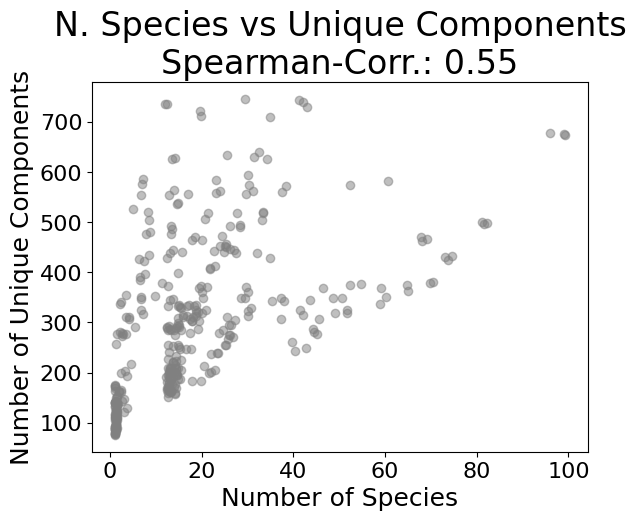

Correlation coefficient: 0.55
P-value: 1.4757861792040154e-29


In [199]:
correlation_coefficient, p_value = pearsonr(nspecies, nuniquecomp)
plt.scatter(nspecies, nuniquecomp, color='grey', alpha=0.5)
plt.title(f'N. Species vs Unique Components\nSpearman-Corr.: {correlation_coefficient:.2f}', fontsize=sa.TITLEFONT)
plt.tick_params(axis='both', labelsize=sa.TICKFONT)
plt.xlabel('Number of Species', fontsize=sa.AXLABELFONT)
plt.ylabel('Number of Unique Components', fontsize=sa.AXLABELFONT)
plt.savefig(analysis_plot_fp + "speciation/nspec_vs_uniquecomp.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()
print(f'Correlation coefficient: {correlation_coefficient:.2f}')
print(f'P-value: {p_value}')

 While there are other factors which influence the number of unique components (my measure of diversity), **the diversity in the population increases with the number of species**.

 No increase in the number of species leads to a decrease in unique components,  which means that **speciation increases diversity**.

 The p value is also significant.

 #### Correlation num species ~ num total components

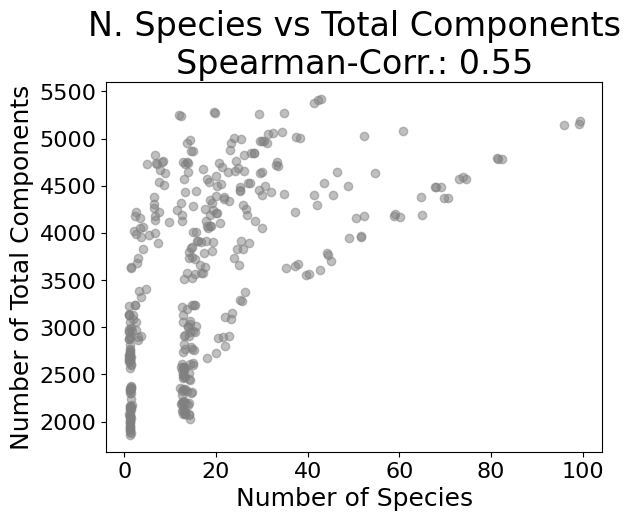

Correlation coefficient: 0.55
P-value: 3.0389147369321527e-30


In [110]:
correlation_coefficient, p_value = pearsonr(nspecies, ntotalcomp)
plt.scatter(nspecies, ntotalcomp, color='grey', alpha=0.5)
plt.title(f'N. Species vs Total Components\nSpearman-Corr.: {correlation_coefficient:.2f}', fontsize=sa.TITLEFONT)
plt.tick_params(axis='both', labelsize=sa.TICKFONT)
plt.xlabel('Number of Species', fontsize=sa.AXLABELFONT)
plt.ylabel('Number of Total Components', fontsize=sa.AXLABELFONT)
plt.savefig(analysis_plot_fp + "speciation/nspec_vs_totalcomp.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()
print(f'Correlation coefficient: {correlation_coefficient:.2f}')
print(f'P-value: {p_value}')



 #### Correlation Best avg species fit ~ max fit

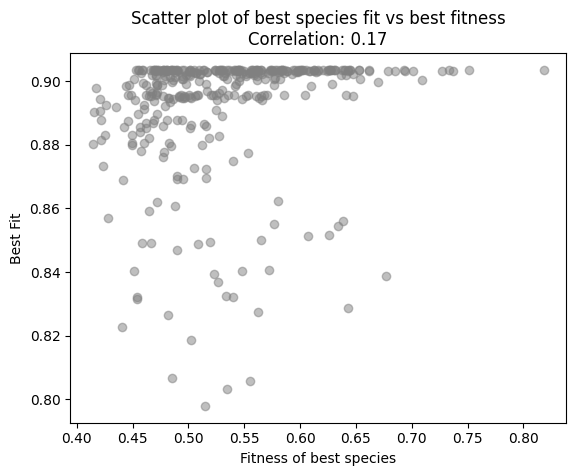

Correlation coefficient: 0.17
P-value: 0.0009345991793022897


In [22]:
correlation_coefficient, p_value = pearsonr(bestspec, bestfit)

plt.scatter(bestspec, bestfit, color='grey', alpha=0.5)
plt.title(f'Scatter plot of best species fit vs best fitness\nCorrelation: {correlation_coefficient:.2f}')
plt.xlabel('Fitness of best species')
plt.ylabel('Best Fit')
plt.show()

print(f'Correlation coefficient: {correlation_coefficient:.2f}')
print(f'P-value: {p_value}')


 Not really interesting. How many species are there in out setups even?

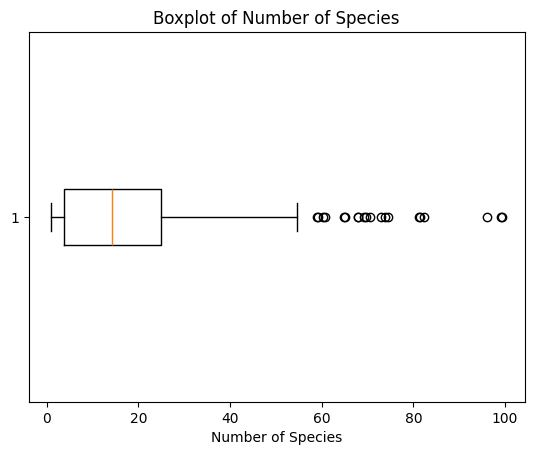

Five-number summary of Number of Species:
Minimum: 1.0
First Quartile (Q1): 3.75
Median: 14.175
Third Quartile (Q3): 24.924999999999997
Maximum: 99.35


In [23]:
plt.boxplot(nspecies, vert=False)
plt.title('Boxplot of Number of Species')
plt.xlabel('Number of Species')
plt.show()

# Calculate the five-number summary
min_val = np.min(nspecies)
q1 = np.percentile(nspecies, 25)
median = np.median(nspecies)
q3 = np.percentile(nspecies, 75)
max_val = np.max(nspecies)

# Print the five-number summary
print("Five-number summary of Number of Species:")
print(f"Minimum: {min_val}")
print(f"First Quartile (Q1): {q1}")
print(f"Median: {median}")
print(f"Third Quartile (Q3): {q3}")
print(f"Maximum: {max_val}")


 Okay, so the last quartile reaches to a bit less than fifty, with the median at 14. Left skewed distribution.

 But this is not really that interesting, it just depends on the parameters I have chosen.



 #### How parameters affect the number of species in the last gen

 Here I will look at how the different paramters affect the number of species in the last generation.

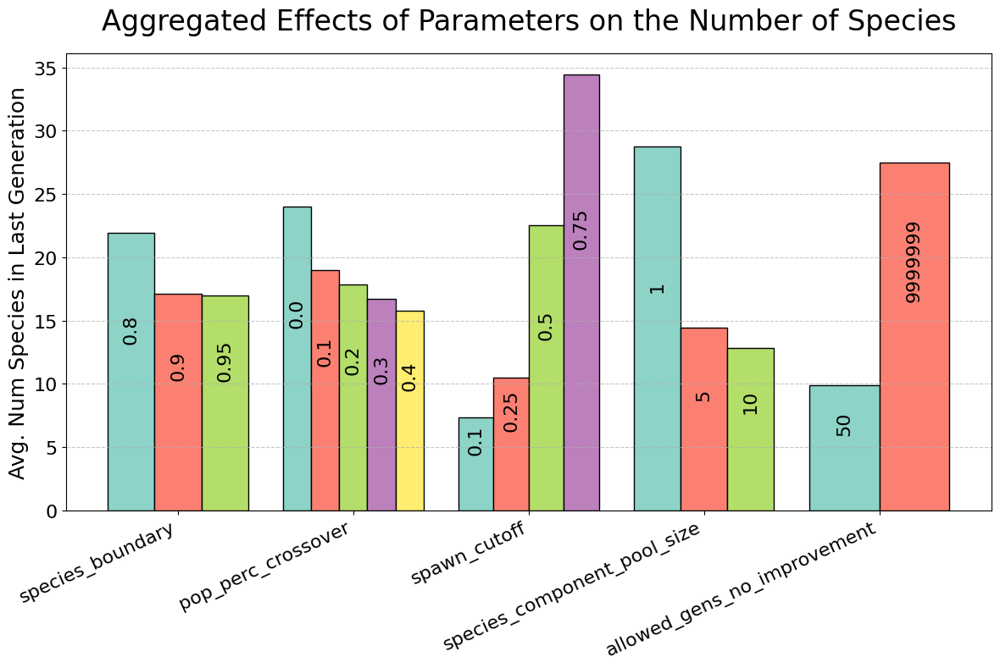

In [156]:
from statistics import mean
from pprint import pprint

pres = {p: {} for p in speciation_predictors}
for params, nspec in zip(matching_params, nspecies):
    for p, val in params.items():
        if val not in pres[p]:
            pres[p][val] = [nspec]
        else:
            pres[p][val].append(nspec)

# Calculate means and sort values
for p in pres:
    sorted_items = {}
    for val in sorted(pres[p].keys()):  # Sort keys in ascending order
        l = pres[p][val]
        sorted_items[val] = mean(l)
    pres[p] = sorted_items

data = pres
plt.figure(figsize=(12, 8))
ax = plt.gca()

# Define color palette for bars within groups
colors = plt.cm.Set3(np.linspace(0, 1, max(len(subdict) for subdict in data.values())))

# Calculate positions for groups and bars
comparison_groups = list(data.keys())
group_positions = np.arange(len(comparison_groups))
bar_width = 0.8  # Total width for each group
    
# Plot bars for each group
for i, (group_name, group_data) in enumerate(data.items()):
    # Calculate number of bars in this group
    n_bars = len(group_data)
    individual_bar_width = bar_width / n_bars
    
    # Get the sorted keys and values
    keys = list(group_data.keys())
    values = list(group_data.values())
    
    # Calculate positions for individual bars within group
    bar_positions = np.linspace(
        group_positions[i] - bar_width/2 + individual_bar_width/2,
        group_positions[i] + bar_width/2 - individual_bar_width/2,
        n_bars
    )
    
    # Plot bars with different colors and black edges
    bars = plt.bar(bar_positions, values, 
                  width=individual_bar_width,
                  color=colors[:n_bars],
                  edgecolor='black',
                  linewidth=1)
    
    # Add key labels on top of each bar
    for bar, key in zip(bars, keys):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height * 0.6,
                f'{key}', ha='center', va='bottom', rotation=90, fontsize=sa.TICKFONT)

# Customize the plot with consistent fontsizes
plt.title('Aggregated Effects of Parameters on the Number of Species', pad=20, fontsize=sa.TITLEFONT)
# plt.xlabel('Parameter', fontsize=sa.AXLABELFONT)
plt.ylabel('Avg. Num Species in Last Generation', fontsize=sa.AXLABELFONT)

# Set x-axis ticks and labels with consistent fontsize
plt.xticks(group_positions, comparison_groups, rotation=25, ha='right')
plt.tick_params(axis='both', labelsize=sa.TICKFONT)

# Add grid for better readability
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save and show the plot
plt.savefig(analysis_plot_fp + "speciation/parameter_values_by_group.pdf", bbox_inches='tight', pad_inches=0.1)
plt.show()

 seems the parameters with the biggest effect on the number of species in the last generation are the spawn cutoff, component pool size and allowed gens no improvement.



 ### Speciation - overall results

 This time, I'm looking at the run results first before further comparing the many parameters present.

In [172]:
speciation_fitness_results = sa.get_best_setups(speciation_res["final_report"])
n_full_converge = len(speciation_fitness_results.filter(pl.col("std_fitness")==0))
print("number of setups where every run converged to max fit:\n", n_full_converge)
speciation_fitness_results.head(105)


number of setups where every run converged to max fit:
 103


setupname,mean_fitness,max_fitness,median_fitness,std_fitness
str,f64,f64,f64,f64
"""setup_158""",0.903509,0.903509,0.903509,0.0
"""setup_149""",0.903509,0.903509,0.903509,0.0
"""setup_298""",0.903509,0.903509,0.903509,0.0
"""setup_25""",0.903509,0.903509,0.903509,0.0
"""setup_88""",0.903509,0.903509,0.903509,0.0
…,…,…,…,…
"""setup_346""",0.903509,0.903509,0.903509,0.0
"""setup_81""",0.903509,0.903509,0.903509,0.0
"""setup_207""",0.903509,0.903509,0.903509,0.0


 ok this is kinda crazy... The top 103 setups converged in all 20 runs to the same maximum fitness. That is actually way better than the other selection strategies.



 ### Which params lead to perfect convergence?



 The below plot filters the setups based on the stdev of the fitness of all their runs.

 If a setup achieved the same fitness across all runs, it's stdev is 0.

 This only happens when all 20 runs reach the maximum fitness.

 Thus I split the results dataframe in two sets, one where all runs had stdev 0 (i.e. they reached max fitness), and those that did not.

 **disclaimer:** Of course this is far from perfect, because a setup might have a really high fraction of perfect runs but just does not make the cut, e.g. 19/20.

 Probably every one of the setups will at some point not reach the maximum fitness (I tried setup 34 for 40 runs, it achieved 39/40 runs max fitness).



 In short, this plot shows the fraction of setups that converged perfectly based on param setting



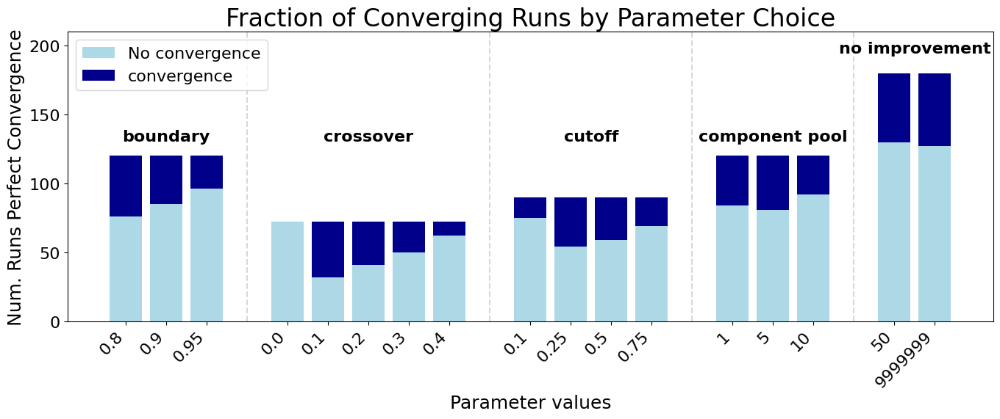

In [242]:
from collections import Counter

# takes in aggregated results df
def get_params_for_setups(df):
    used_params = {p: Counter() for p in speciation_predictors}
    for row in df.iter_rows(named=True):
        snum = int(row["setupname"].split("_")[1])
        cur_params = speciation_res["setups"][snum]["params"]
        # add all the used param values
        # also add frequencies
        for pred in speciation_predictors:
            used_params[pred][cur_params[pred]] += 1
    return used_params

conv_params = get_params_for_setups(speciation_fitness_results.filter(pl.col("std_fitness")==0))
noconv_params = get_params_for_setups(speciation_fitness_results.filter(pl.col("std_fitness")!=0))

gname_map = {
    "species_boundary": "boundary",
    "pop_perc_crossover": "crossover",
    "spawn_cutoff": "cutoff",
    "species_component_pool_size": "component pool",
    "allowed_gens_no_improvement": "no improvement"
}

def plot_stacked_counters(dict1, dict1_name, dict2, dict2_name):
    plt.figure(figsize=(14, 6))

    group_names = list(dict1.keys())

    current_x = 0
    xticks = []
    xtick_labels = []

    for group_name in group_names:
        # Get all unique keys in both counters for this group
        all_keys = sorted(set(list(dict1[group_name].keys()) + list(dict2[group_name].keys())))
        
        # Get values for each counter, using 0 if key doesn't exist
        values1 = [dict1[group_name].get(k, 0) for k in all_keys]
        values2 = [dict2[group_name].get(k, 0) for k in all_keys]
        
        # Create bars
        x = np.arange(len(all_keys)) + current_x
        plt.bar(x, values1, width=0.8, 
                label=f'{dict1_name}' if current_x == 0 else "", 
                color='lightblue')
        plt.bar(x, values2, width=0.8, bottom=values1, 
                label=f'{dict2_name}' if current_x == 0 else "", 
                color='darkblue')
        
        # Add group label above bars
        group_center = x.mean()
        plt.text(group_center, plt.ylim()[1] * 1.02, gname_map[group_name], 
                ha='center', va='bottom', fontsize=sa.TICKFONT, fontweight='bold')
        
        # Store positions for xticks
        xticks.extend(x)
        xtick_labels.extend([str(k) for k in all_keys])
        
        # Update current_x for next group
        current_x = x[-1] + 2

    # Add vertical lines between groups
    group_boundaries = []
    current_x = 0
    for group_name in group_names:
        keys = sorted(set(list(dict1[group_name].keys()) + list(dict2[group_name].keys())))
        current_x += len(keys)
        if current_x < len(xticks):
            group_boundaries.append((xticks[current_x-1] + xticks[current_x])/2)
            
    for boundary in group_boundaries:
        plt.axvline(x=boundary, color='gray', linestyle='--', alpha=0.3)

    # Customize the plot
    plt.ylim((0,210))
    plt.xlabel('Parameter values', fontsize=sa.AXLABELFONT)
    plt.ylabel('Num. Runs Perfect Convergence', fontsize=sa.AXLABELFONT)
    plt.title('Fraction of Converging Runs by Parameter Choice', fontsize=sa.TITLEFONT)
    plt.tick_params(labelsize=sa.TICKFONT)
    plt.xticks(xticks, xtick_labels, rotation=45, ha='right')
    plt.legend(fontsize=sa.LEGENDFONT)
    plt.subplots_adjust(top=0.85)
    plt.tight_layout()
    
    return plt.gcf()

fig = plot_stacked_counters(noconv_params, "No convergence", conv_params, "convergence")
fig.savefig(analysis_plot_fp + "speciation/convergence_fraction.pdf")
plt.show()



when comparing the frequencies, it seems like the parameter that matters the most is pop_perc_crossover.
Some crossover is needed for full convergence, but increasing beyond 10% crossover does not yield better results.
This non-linear relation cannot be captured by the linear regression, which indicates only modest performance increase with increasing crossover rates.
This does not reflect the actual data, where going beyond 10% is detrimental.

furthermore, a low species boundary of 0.8 is beneficial, however the component pool size does not seem to be very important, which is curious because those two parameters both influence the number of species.
For the spawn-cutoff within species there also seems to be a nonlinear relationship, where a very low cutoff of 10% is worse than the best value of 25% - after which the ratio of non-converging setups increases again.
Species extinction does not seem to have a big effect.

If I eye-ball the perfect setup based on this information, it would be speciation selection with:
* species_boundary: 0.8
* pop_perc_crossover: 0.1
* spawn_cutoff: 0.25
* species_component_pool_size: 5
* allowed_gens_no_improvement: inf

which would correspond to Setup 34 in those runs

 ### Interaction species boundary ~ component pool size on absolute fitness and number of components at the end of run

 This time, there are only two parameters that were tested, meaning I can easily visualize their effects using simple barplots. Thus there are also no aggregations of the other parameter settings as was the case with elitism/crossover in truncation visualizations.

An error occurred: unable to append to a DataFrame of width 47 with a DataFrame of width 50
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 47 with a DataFrame of width 50
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 50 with a DataFrame of width 47
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 47 with a DataFrame of width 50
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 47 with a DataFrame of width 50
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: u

i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:789: SyntaxWarning: invalid escape sequence '\_'
  index = pd.Index([p.replace("_", "\_") for p in predictors])
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:817: SyntaxWarning: invalid escape sequence '\m'
  col_name = "\makecell{\\textbf{"+f"{target.replace("_", "\_")}"+"}\\\ (Adj R² = "+f"{adjusted_r2:.4f})" + "}".replace("_", "\_")
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:817: SyntaxWarning: invalid escape sequence '\_'
  col_name = "\makecell{\\textbf{"+f"{target.replace("_", "\_")}"+"}\\\ (Adj R² = "+f"{adjusted_r2:.4f})" + "}".replace("_", "\_")
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:817: SyntaxWarning: invalid escape sequence '\ '
  col_name = "\makecell{\\textbf{"+f"{target.replace("_", "\_")}"+"}\\\ (Adj R² = "+f"{adjusted_r2:.4f})" + "}".replace("_", "\_")
i:\EvolvePetriNets\src\scripts\helper_scripts\setup_analysis.py:817: SyntaxWarning: invalid 

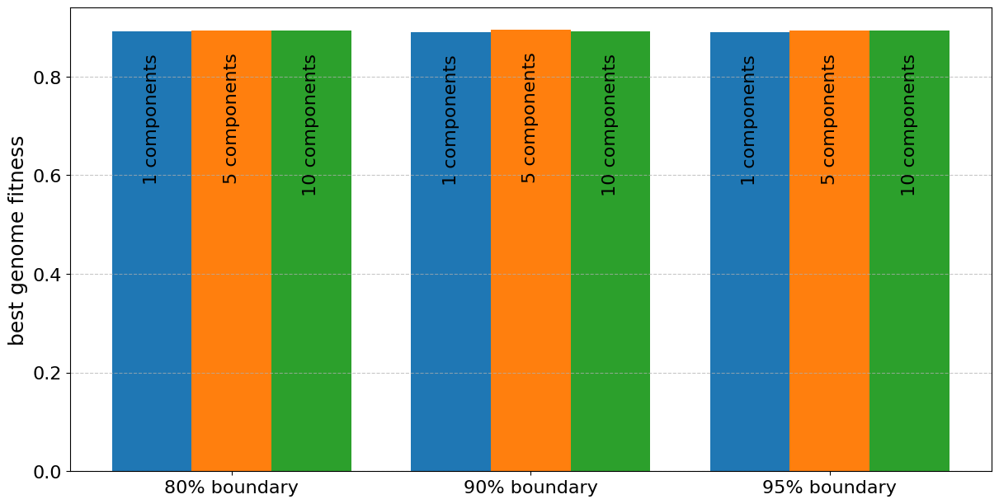

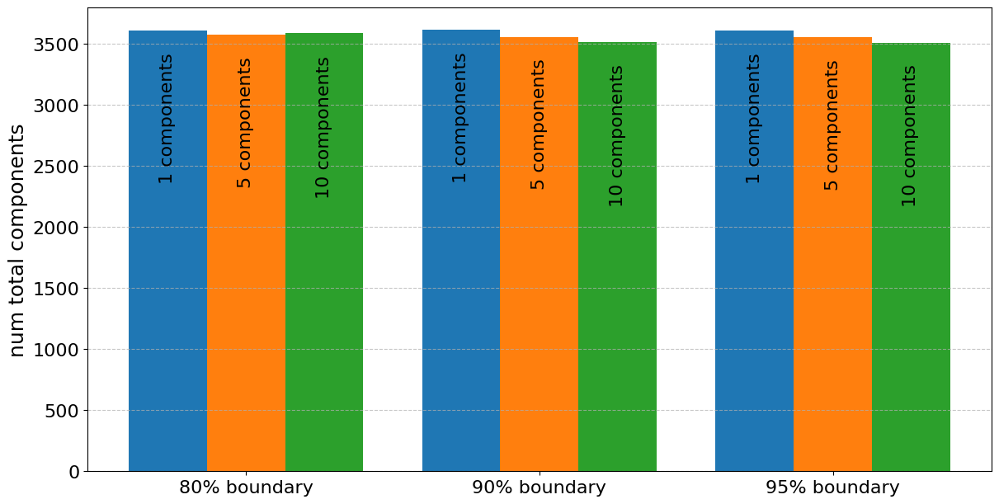

In [197]:
reload(sa)
speciation_search1 = {
    "boundary 80% &  1 components": {"species_boundary": 0.80, "species_component_pool_size": 1}, "boundary 80% &  5 components": {"species_boundary": 0.80, "species_component_pool_size": 5}, "boundary 80% & 10 components": {"species_boundary": 0.80, "species_component_pool_size": 10},
    "boundary 90% &  1 components": {"species_boundary": 0.90, "species_component_pool_size": 1}, "boundary 90% &  5 components": {"species_boundary": 0.90, "species_component_pool_size": 5}, "boundary 90% & 10 components": {"species_boundary": 0.90, "species_component_pool_size": 10},
    "boundary 95% &  1 components": {"species_boundary": 0.95, "species_component_pool_size": 1}, "boundary 95% &  5 components": {"species_boundary": 0.95, "species_component_pool_size": 5}, "boundary 95% & 10 components": {"species_boundary": 0.95, "species_component_pool_size": 10}
}


speciation_plt_layout1 = [
    ["boundary 80% &  1 components", "boundary 80% &  5 components", "boundary 80% & 10 components"],
    ["boundary 90% &  1 components", "boundary 90% &  5 components", "boundary 90% & 10 components"],
    ["boundary 95% &  1 components", "boundary 95% &  5 components", "boundary 95% & 10 components"]
]

 
strip_first_param = lambda l: l.split('&')[1].strip().split('\n')[0] # lambda to be applied on labels
speciation_data_sources1 = sa.search_and_aggregate_param_results(speciation_res, speciation_search1)
grp_titles1 = ["80% boundary", "90% boundary", "95% boundary"]
_ = sa.generalized_barplot(speciation_plt_layout1, speciation_data_sources1, "best_genome_fitness", title="", group_titles=grp_titles1, label_lambda=strip_first_param, show_errors=False)
_ = sa.generalized_barplot(speciation_plt_layout1, speciation_data_sources1, "num_total_components", title="", group_titles=grp_titles1, label_lambda=strip_first_param)


 while the boundary and component pool size certainly affect the number of species, neither seem to really have an effect on either fitness or the number of components.

 I would have intuited that a lower number of species -> bigger species -> more selection pressure within a species (spawn cutoff) -> lower diversity/fewer components.

 But it seems like this is not the case.



 The only other thing I noticed is that even when averaging out the crossover rates (as is the case here), I expected speciation to discover more components.



 Maybe the lineplots are interesting...



 ### boundary ~ component pool size - fitness

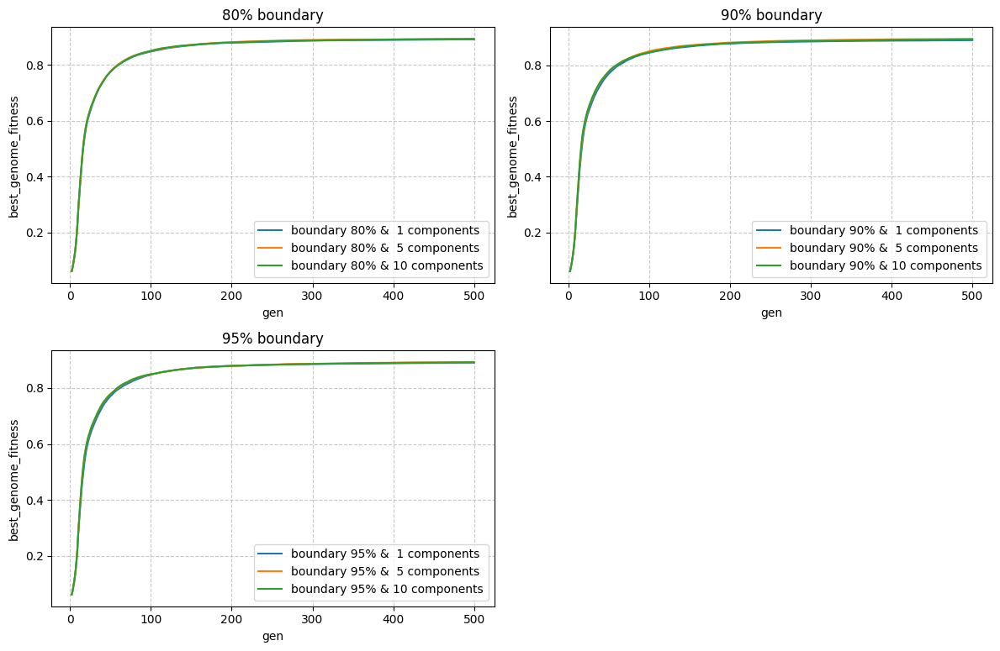

In [28]:
_ = sa.generalized_lineplot(speciation_plt_layout1, speciation_data_sources1, "best_genome_fitness", title="", subplt_titles=grp_titles1)


 nothing of note here, the fitness curve looks the same



 ### boundary ~ component pool size - components & species

 lets look at the number of components and number of unique components with different boundary and component pool sizes



 I will also plot the number of species over time

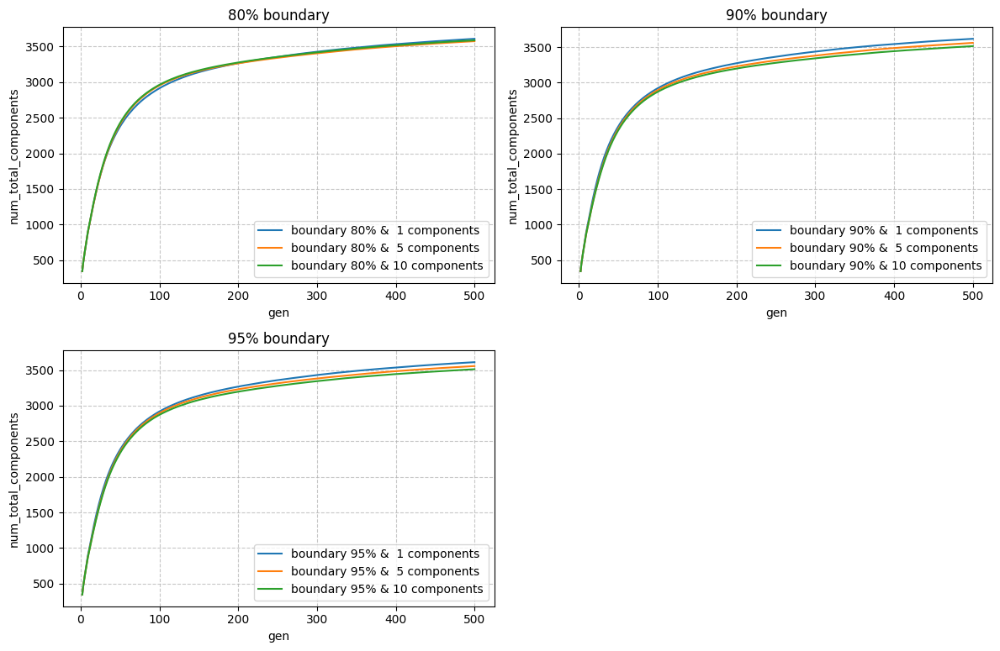

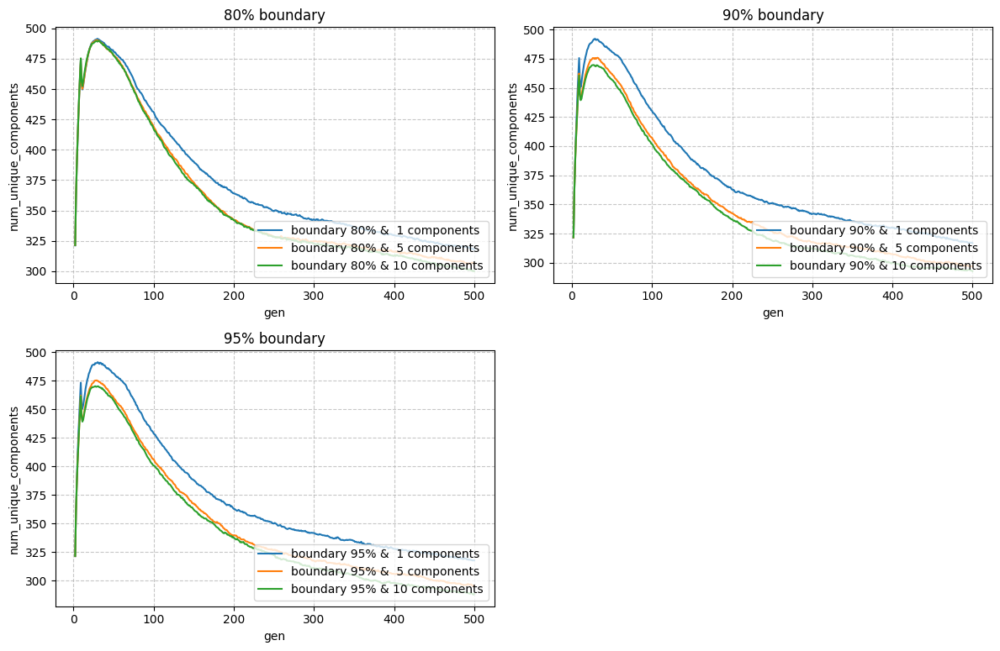

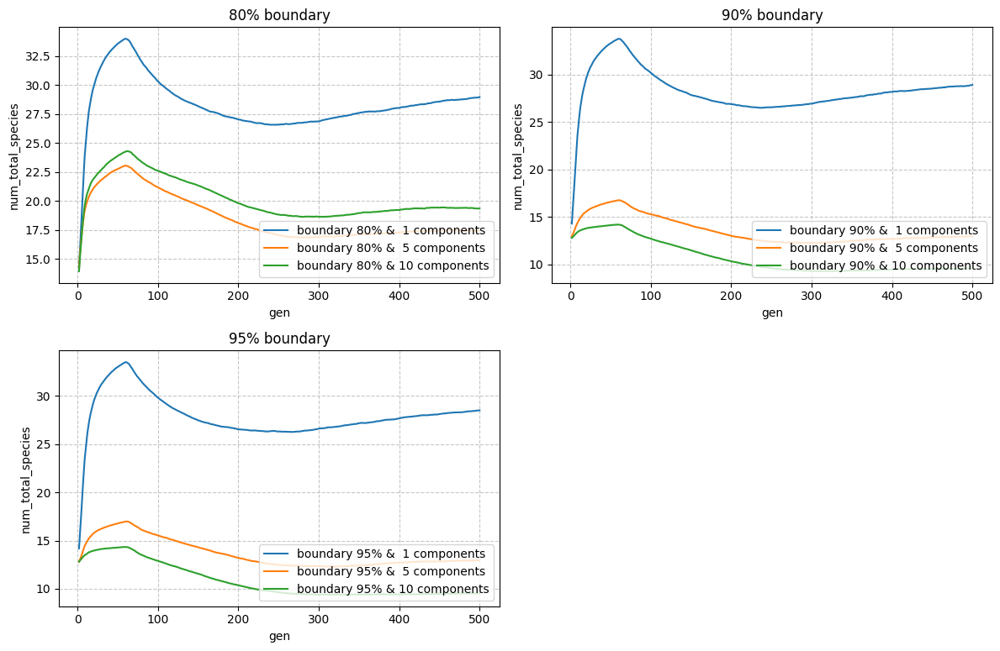

In [29]:
_ = sa.generalized_lineplot(speciation_plt_layout1, speciation_data_sources1, "num_total_components", title="", subplt_titles=grp_titles1)
_ = sa.generalized_lineplot(speciation_plt_layout1, speciation_data_sources1, "num_unique_components", title="", subplt_titles=grp_titles1)
_ = sa.generalized_lineplot(speciation_plt_layout1, speciation_data_sources1, "num_total_species", title="", subplt_titles=grp_titles1)


 **Total num components**

 None of the graphs for the total number of components show a big difference.



 **Num unique components**

 Here the only visible change is that a component pool of size 1 preserves a higher number of unique components for longer.

 A component pool size of one means that a new genome that is spawned is only compared to the species representative (=leader, i.e. genome with the highest fitness in the species).

 With higher component pool sizes, a higher number of genomes is randomly chosen (+ the leader) to compare to, thus increasing the likelihood that the genome will be compatible with it's current species (or any other species).



 **Num total species**

 Interestingly, the boundary does not really affect the peak number of species when just using one representative to compare to, however it does affect the 5 and 10 representative setups more.

 For a boundary of 80%, the peak of 5/10 lies at around 23 species, for 90% and 95% it sits around 15.

 However the most notable result here is that comparing to just one genome does lead to an increase in species, as the 1 component/blue line has quite a lot of separation to the the other two setups.

 ### Interaction crossover ~ cutoff on absolute fitness and number of components at the end of run

 This time, there are only two parameters that were tested, meaning I can easily visualize their effects using simple barplots. Thus there are also no aggregations of the other parameter settings as was the case with elitism/crossover in truncation visualizations.

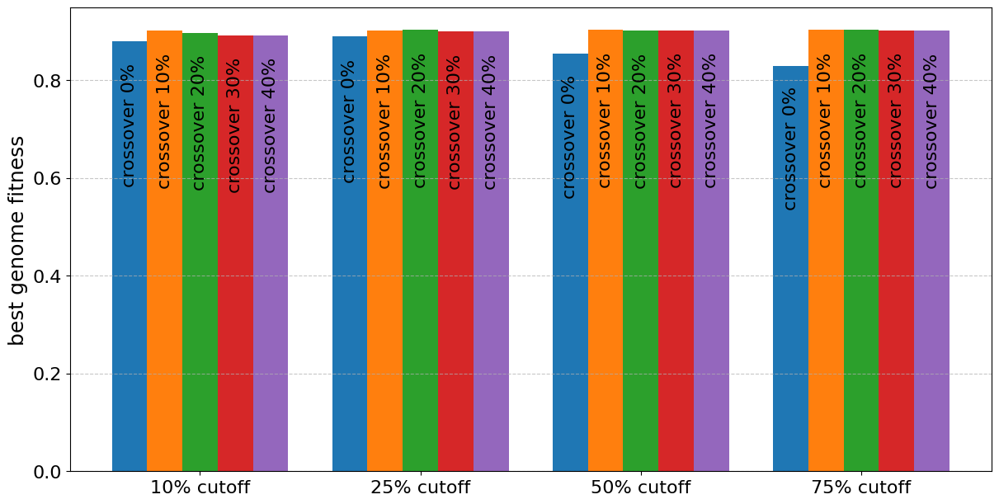

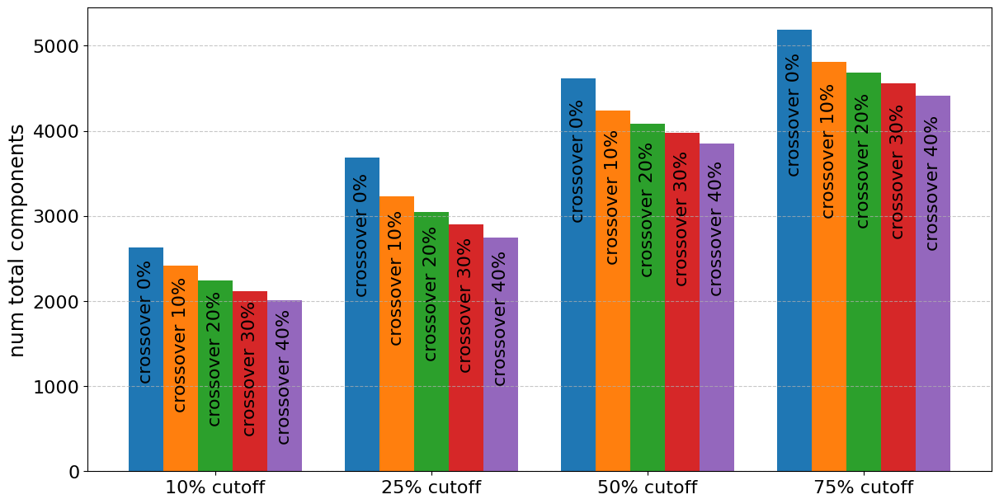

In [203]:
speciation_search2 = {
    "cutoff 10% & crossover 0%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.0}, "cutoff 10% & crossover 10%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.1}, "cutoff 10% & crossover 20%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.2}, "cutoff 10% & crossover 30%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.3}, "cutoff 10% & crossover 40%": {"spawn_cutoff": 0.10, "pop_perc_crossover": 0.4},
    "cutoff 25% & crossover 0%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.0}, "cutoff 25% & crossover 10%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.1}, "cutoff 25% & crossover 20%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.2}, "cutoff 25% & crossover 30%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.3}, "cutoff 25% & crossover 40%": {"spawn_cutoff": 0.25, "pop_perc_crossover": 0.4},
    "cutoff 50% & crossover 0%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.0}, "cutoff 50% & crossover 10%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.1}, "cutoff 50% & crossover 20%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.2}, "cutoff 50% & crossover 30%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.3}, "cutoff 50% & crossover 40%": {"spawn_cutoff": 0.50, "pop_perc_crossover": 0.4},
    "cutoff 75% & crossover 0%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.0}, "cutoff 75% & crossover 10%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.1}, "cutoff 75% & crossover 20%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.2}, "cutoff 75% & crossover 30%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.3}, "cutoff 75% & crossover 40%": {"spawn_cutoff": 0.75, "pop_perc_crossover": 0.4},
}


speciation_plt_layout2 = [
    ["cutoff 10% & crossover 0%", "cutoff 10% & crossover 10%", "cutoff 10% & crossover 20%", "cutoff 10% & crossover 30%", "cutoff 10% & crossover 40%"],
    ["cutoff 25% & crossover 0%", "cutoff 25% & crossover 10%", "cutoff 25% & crossover 20%", "cutoff 25% & crossover 30%", "cutoff 25% & crossover 40%"],
    ["cutoff 50% & crossover 0%", "cutoff 50% & crossover 10%", "cutoff 50% & crossover 20%", "cutoff 50% & crossover 30%", "cutoff 50% & crossover 40%"],
    ["cutoff 75% & crossover 0%", "cutoff 75% & crossover 10%", "cutoff 75% & crossover 20%", "cutoff 75% & crossover 30%", "cutoff 75% & crossover 40%"]
]

 
strip_first_param = lambda l: l.split('&')[1].strip().split('\n')[0] # lambda to be applied on labels
speciation_data_sources2 = sa.search_and_aggregate_param_results(speciation_res, speciation_search2)
grp_titles2 = ["10% cutoff", "25% cutoff", "50% cutoff", "75% cutoff"]
_ = sa.generalized_barplot(speciation_plt_layout2, speciation_data_sources2, "best_genome_fitness", title="", group_titles=grp_titles2, label_lambda=strip_first_param, show_errors=False)
_.savefig(analysis_plot_fp+"speciation/cutoff_crossover_fitness.pdf")
_ = sa.generalized_barplot(speciation_plt_layout2, speciation_data_sources2, "num_total_components", title="", group_titles=grp_titles2, label_lambda=strip_first_param)
_.savefig(analysis_plot_fp+"speciation/cutoff_crossover_components.pdf")


 **fitness**

 Not a big effect on fitness based on cutoff and crossover rates.

 The only clear effect here is that crossover is very important for the speciation algorithm to function well.

 This is a bit in contrast to truncation selection, where 0% crossover did not bring such a performance degradation.

 I assume this is because in truncation selection genomes are not put into niches in which they converge more quickly



 **num components**

 Overall this plot kind of mirrors what was already seen for truncation selection:

 * increasing the cutoff leads to more components

 * increasing the crossover rate leads to fewer components

 ### Cutoff ~ Crossover - fitness plot

 As before, lets look at how cutoff and crossover influence fitness convergence for the speciation selection



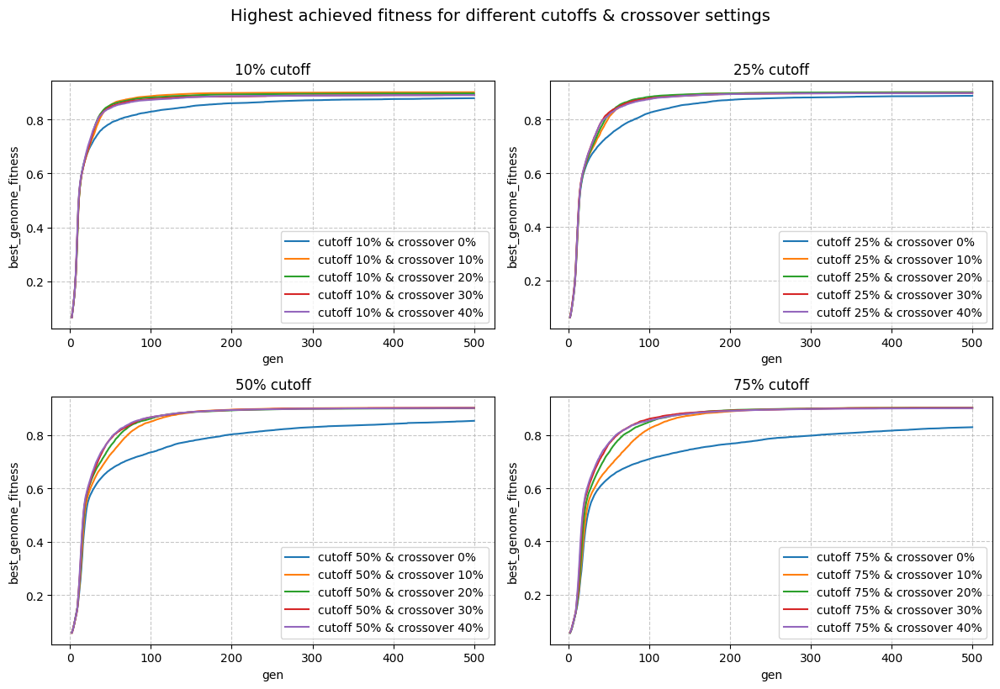

In [31]:
_ = sa.generalized_lineplot(speciation_plt_layout2, speciation_data_sources2, "best_genome_fitness", title="Highest achieved fitness for different cutoffs & crossover settings", subplt_titles=grp_titles2)


 In general, the settings converge similarly, with the exception of 0% crossover.

 The 0% crossover curve flattens out earlier and fails to reach the curves using crossover.

 There is not a big difference between the different crossover rates in terms of max fitness performance, but it is important to have crossover.



 Next, lets look again at component convergence graphs.



 ### Cutoff ~ Crossover - diversity & convergence

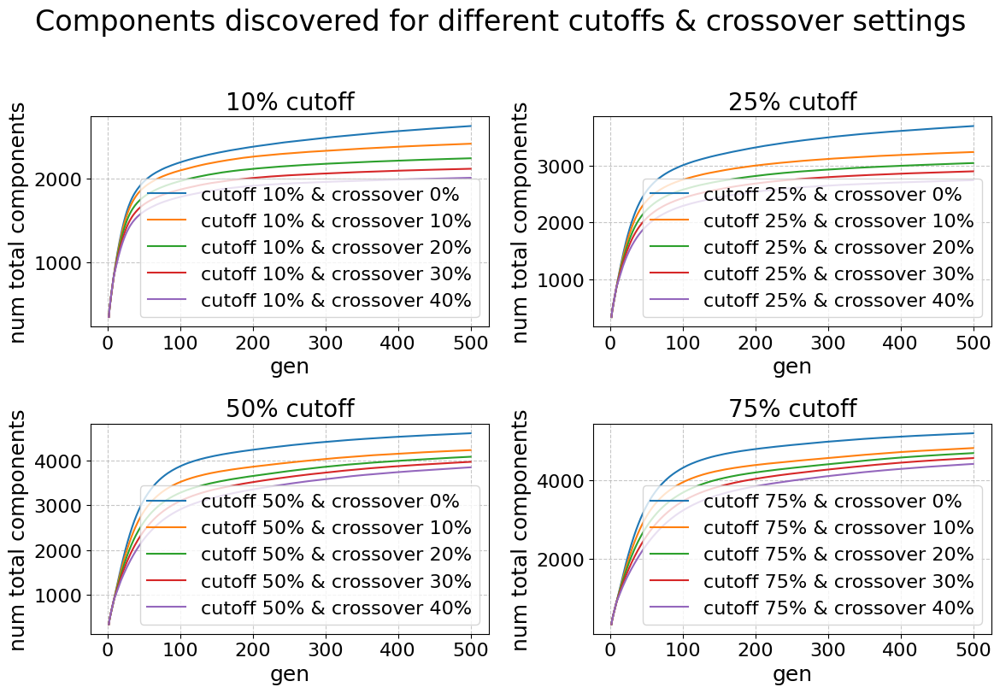

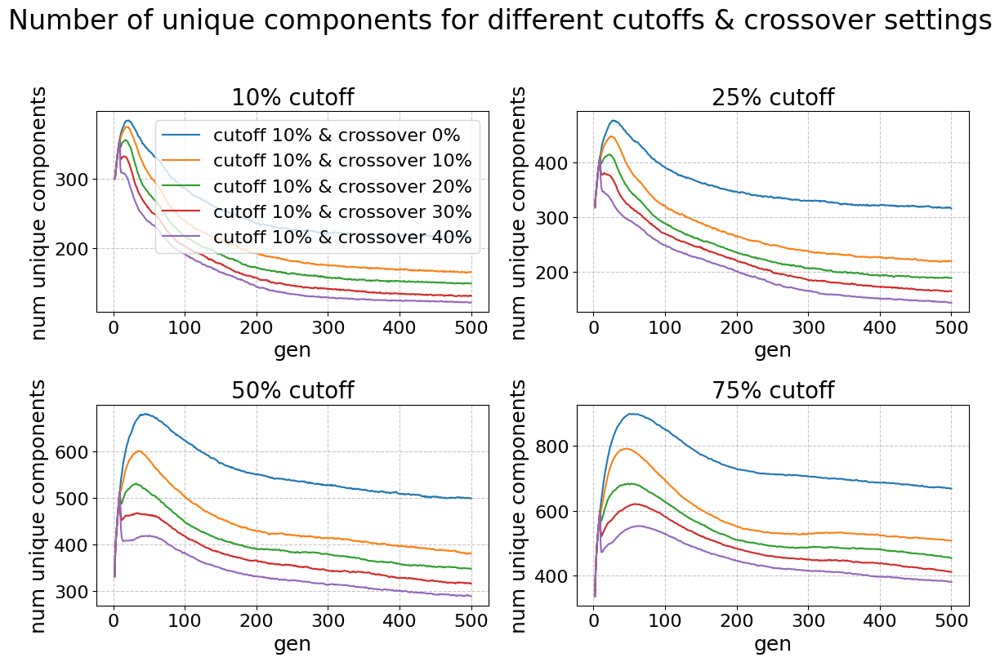

In [288]:
_ = sa.generalized_lineplot(speciation_plt_layout2, speciation_data_sources2, "num_total_components", title="Components discovered for different cutoffs & crossover settings", subplt_titles=grp_titles2)
_ = sa.generalized_lineplot(speciation_plt_layout2, speciation_data_sources2, "num_unique_components", title="Number of unique components for different cutoffs & crossover settings", subplt_titles=grp_titles2, legend_loc="upper right", show_all_legends=False)
_.savefig(analysis_plot_fp+"speciation/cutoff_crossover_unique_comp.pdf", bbox_inches='tight', pad_inches=0.1)


 Again, a higher cutoff obviously leads to more components.

 And crossover leads to fewer components.



 ### Effects of species extinction

 The last parameter that was varied and not yet fully visualized here is the species extinction, which happens after 50 generations of no improvements or not at all.



An error occurred: unable to append to a DataFrame of width 47 with a DataFrame of width 50
this was most likely because there are missing columns in one of the dataframes, will use diagonal join
An error occurred: unable to append to a DataFrame of width 47 with a DataFrame of width 50
this was most likely because there are missing columns in one of the dataframes, will use diagonal join


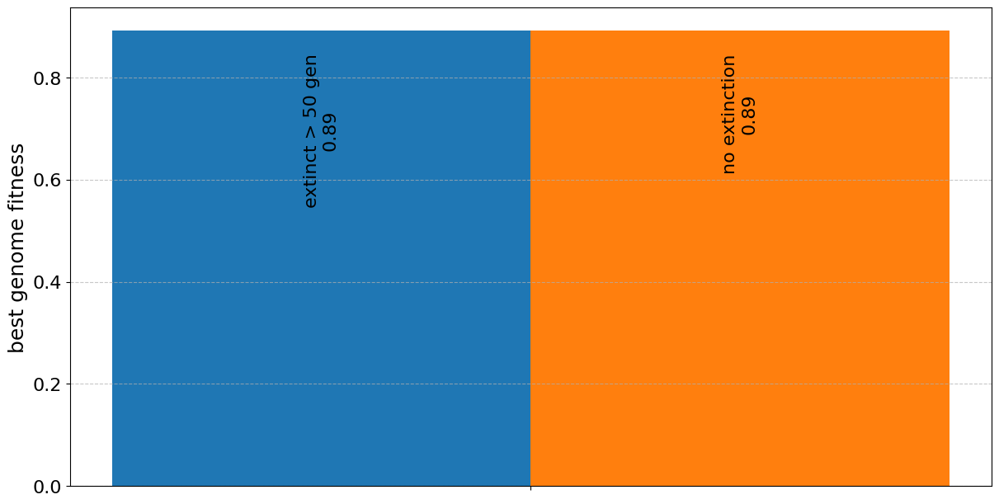

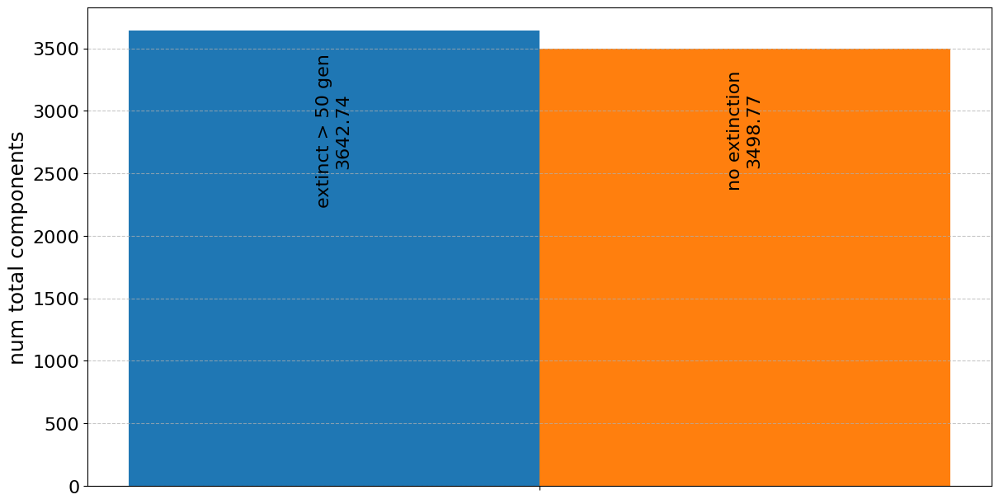

In [206]:
speciation_search3 = {
    "extinct > 50 gen": {"allowed_gens_no_improvement": 50},
    "no extinction": {"allowed_gens_no_improvement": 9999999}
}

speciation_plt_layout3 = [ ["extinct > 50 gen", "no extinction"] ]

 
speciation_data_sources3 = sa.search_and_aggregate_param_results(speciation_res, speciation_search3)
grp_titles3 = [""]
_ = sa.generalized_barplot(speciation_plt_layout3, speciation_data_sources3, "best_genome_fitness", title="", group_titles=grp_titles3, show_errors=False)
_ = sa.generalized_barplot(speciation_plt_layout3, speciation_data_sources3, "num_total_components", title="", group_titles=grp_titles3)


 No effect on fitness, super tiny irrelevant effect on num total components

 #### Species extinction - species

 First, lets check how extinction affects the number of species

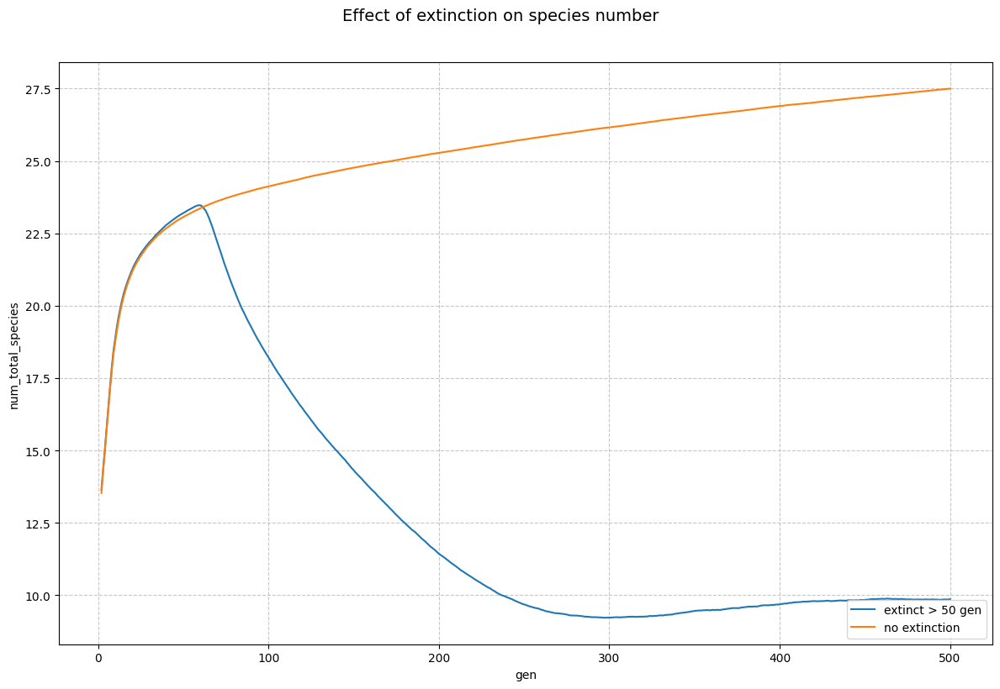

In [34]:
_ = sa.generalized_lineplot(speciation_plt_layout3, speciation_data_sources3, "num_total_species", title="Effect of extinction on species number", subplt_titles=grp_titles3)


 As can be expected, after 50 generations a sharp drop in the number of species starts when species go extinct.

 At around generation 300, the minimum is reached and the number of species starts to approach a kind of equilibrium around ~10 species.



 #### Species extinction - fitness

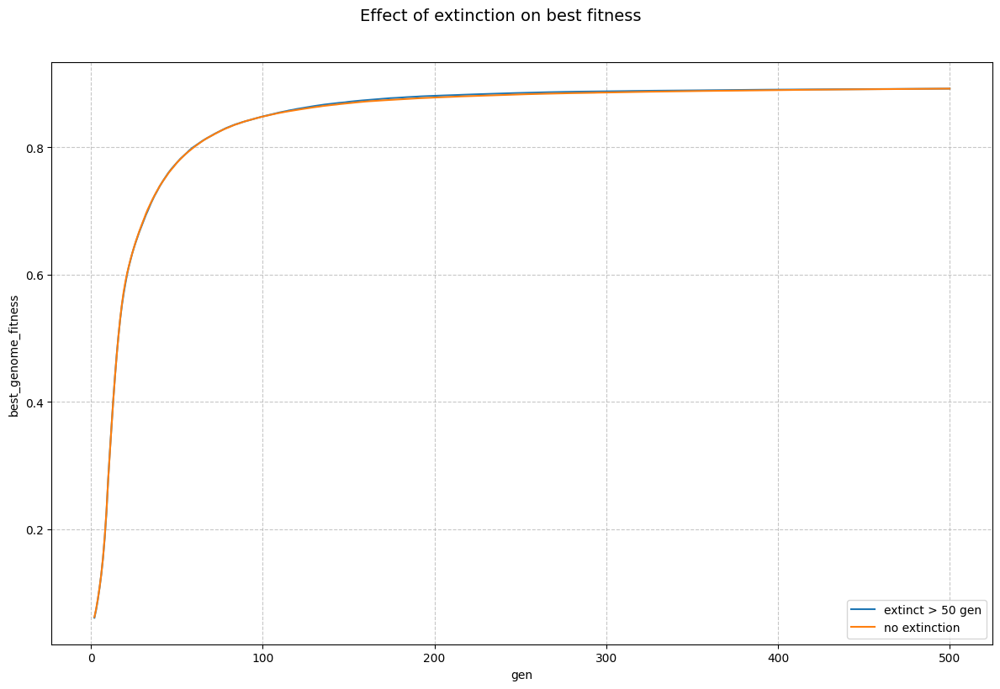

In [35]:
_ = sa.generalized_lineplot(speciation_plt_layout3, speciation_data_sources3, "best_genome_fitness", title="Effect of extinction on best fitness", subplt_titles=grp_titles3)


 No real effect here



 #### Species extinction - components

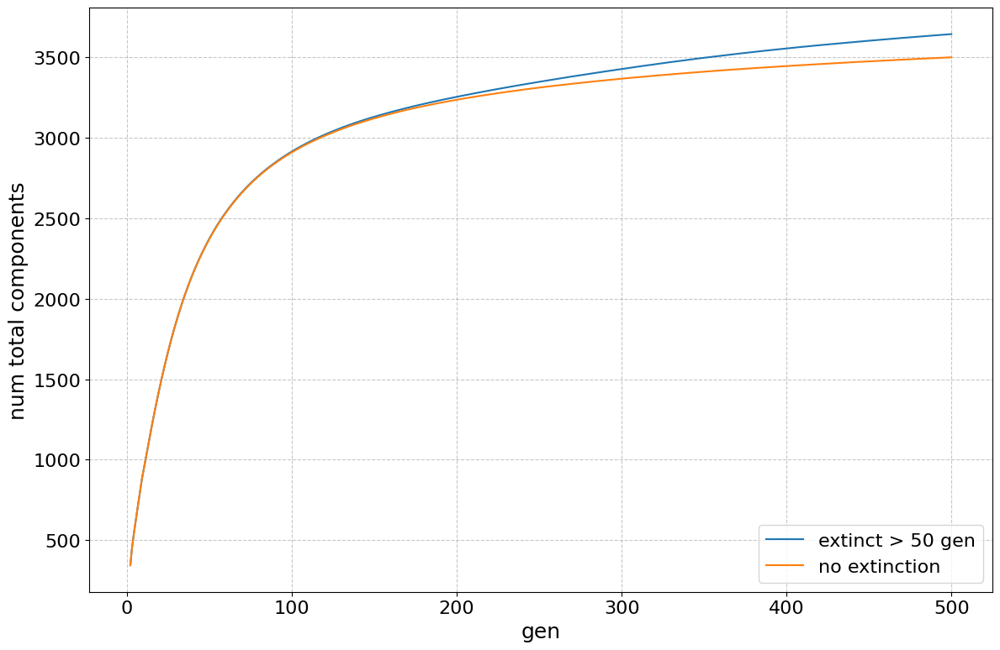

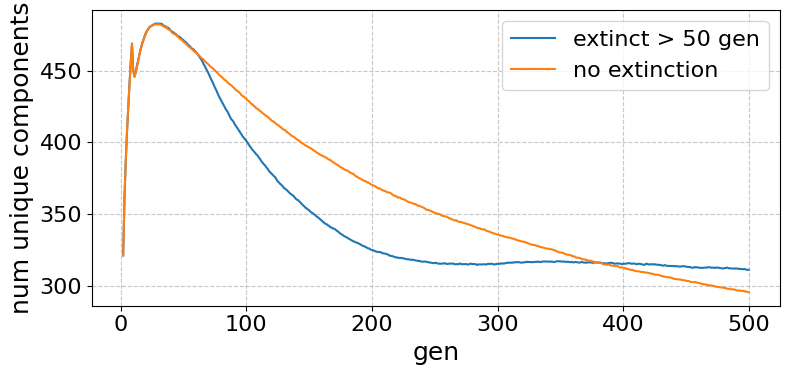

In [213]:
_ = sa.generalized_lineplot(speciation_plt_layout3, speciation_data_sources3, "num_total_components", title="", subplt_titles=grp_titles3)
_ = sa.generalized_lineplot(speciation_plt_layout3, speciation_data_sources3, "num_unique_components", title="", subplt_titles=grp_titles3, figsize=(8,4), legend_loc="upper right")
_.savefig(analysis_plot_fp+"speciation/extinction_unique_comp.pdf")


 **total components**

 slightly higher number of total components can be reached when using extinction.



 **unique components**

 While the extinction leads to a sharper drop of unique components, the curve starts to flatten way before the no extinction setup, causing it to preserve more unique components until the end.

 The unique components stop decreasing right around the time when the number of species approaches its minimum.

 At that point, there are fewer species.

 Then, the number of species slowly increases, maybe this is the cause for diversity preservation.

 I stopped my observations after 500 gens, there is a good chance that component reduction will continue until it reaches a level similar to the no-extinction setups.



 ### Speciation Spawn plots

In [37]:
# # speciation_search1 + speciation_search2 + speciation_search3
# speciation_search = speciation_search1 | speciation_search2 | speciation_search3
# print("\n".join(list(speciation_search.keys())))


 #### Boundary & componentpool Speciation Spawn plots

 I will plot one exemplary setup for the different species boundary and component pool sizes.

 I'm using a low spawn cutoff, because this makes the individual species spawn peaks more visible.

 Holding spawn cutoff, crossover and extinction constant

2


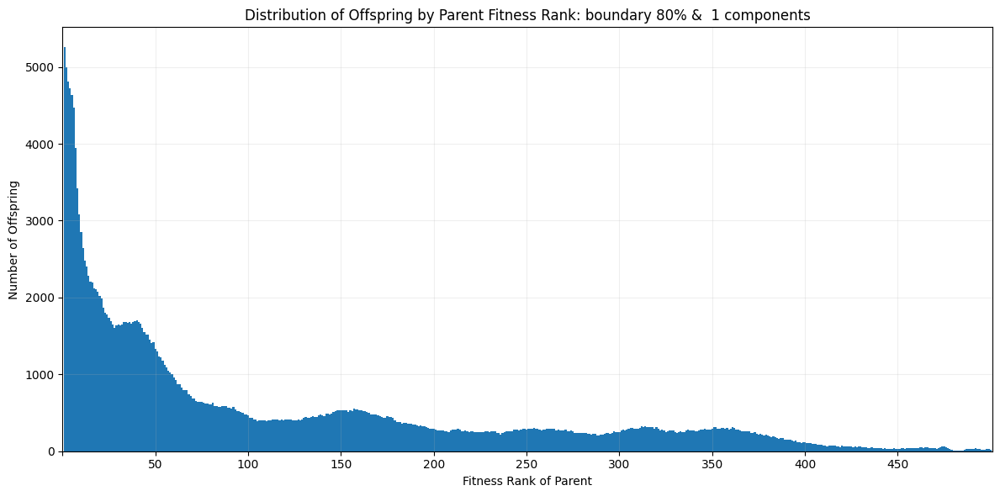

4


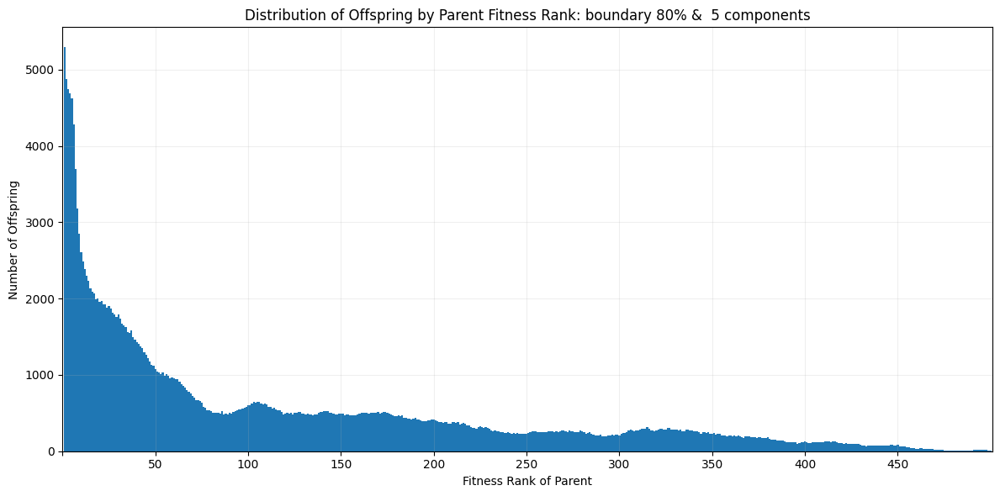

6


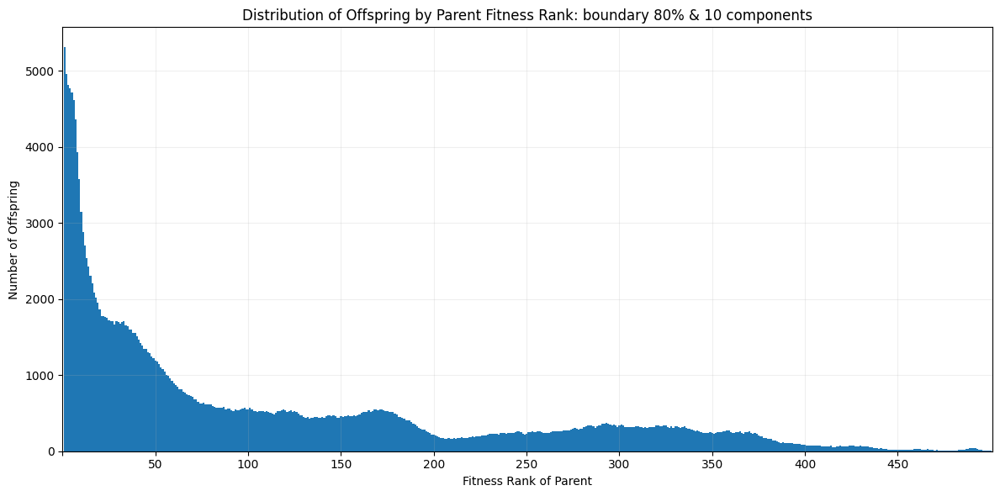

122


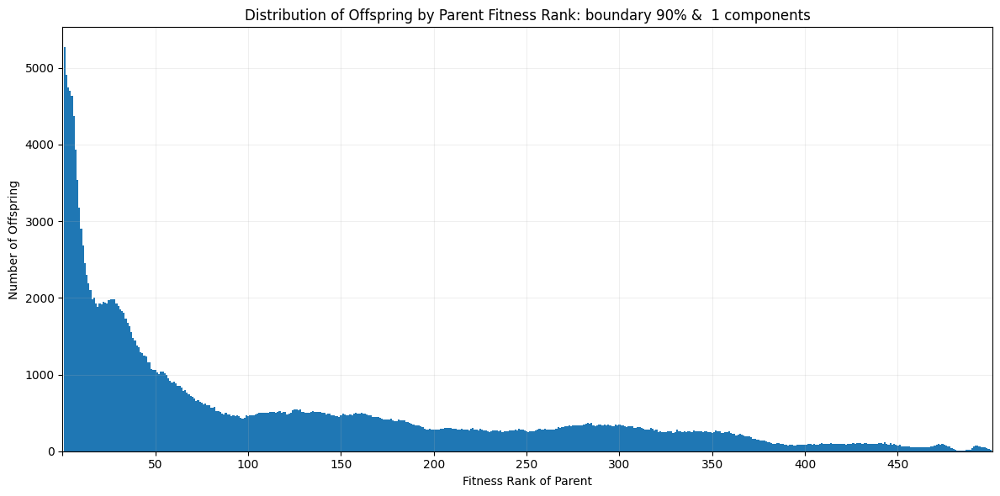

124


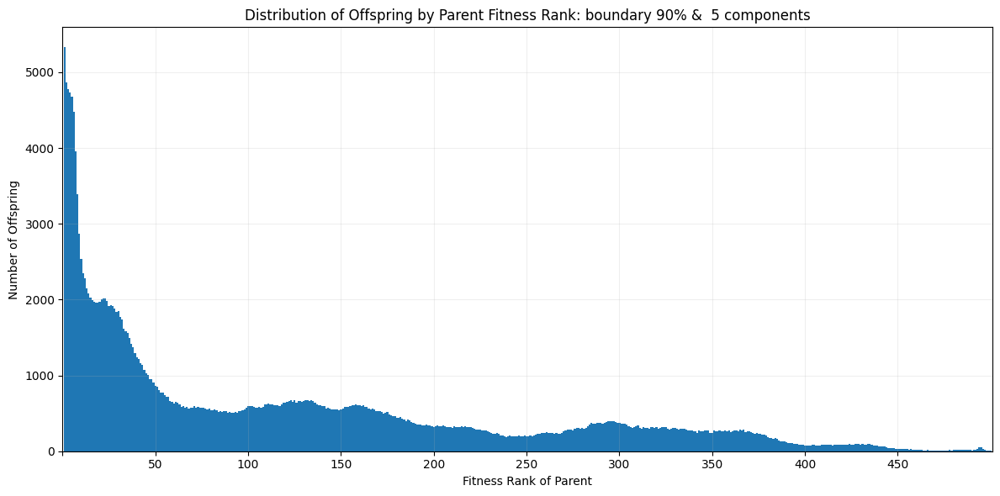

126


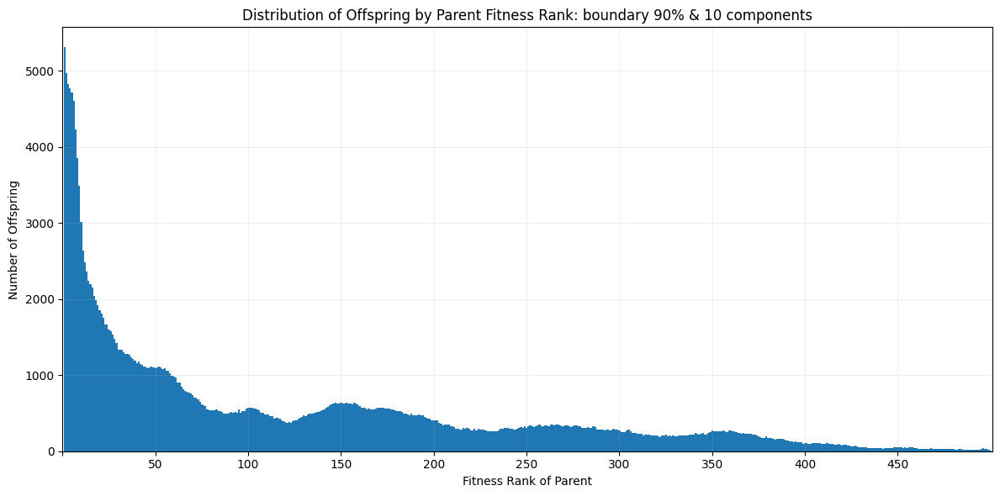

242


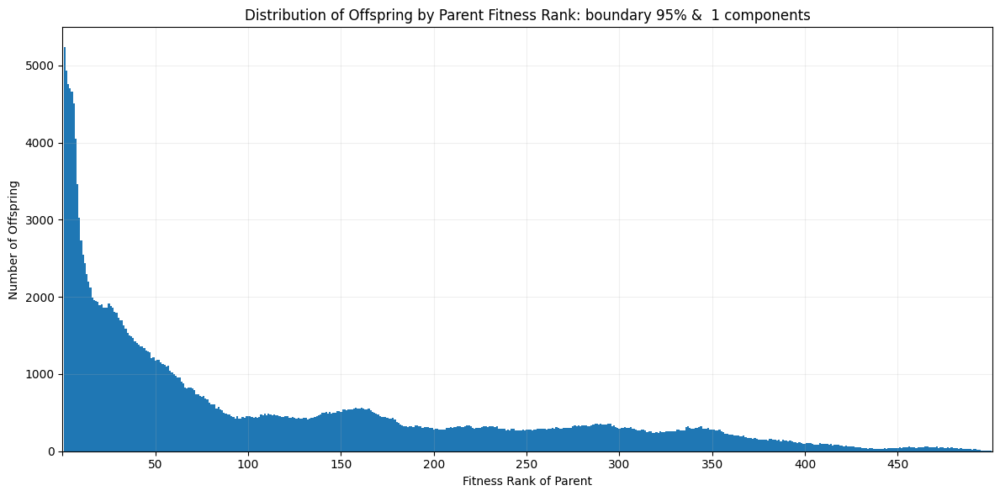

244


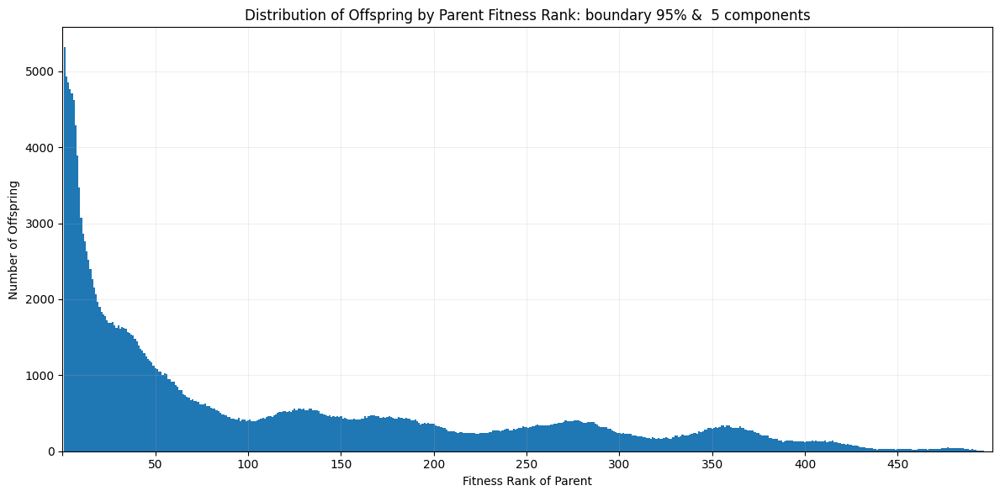

246


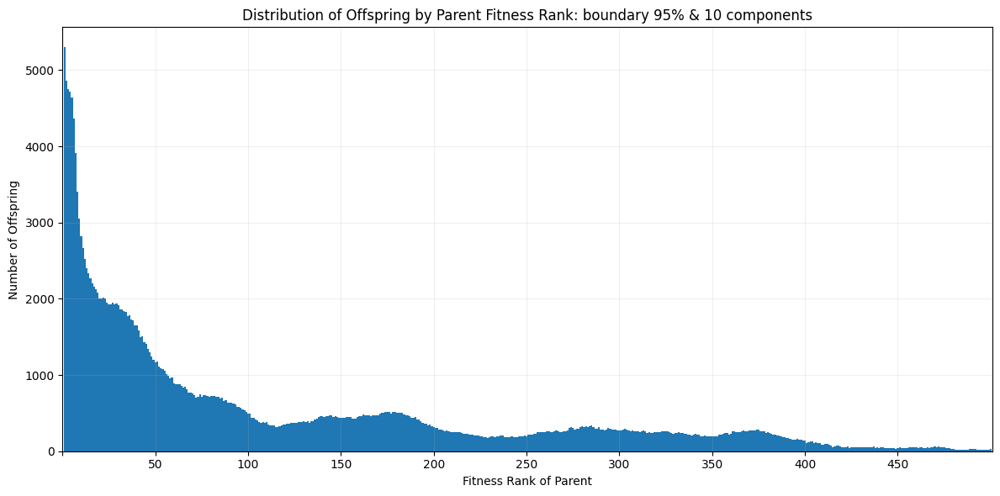

In [38]:
t = 'Distribution of Offspring by Parent Fitness Rank: '
hold_constant1 = {"pop_perc_crossover": 0.0, "spawn_cutoff": 0.1, "allowed_gens_no_improvement": 9999999}
s1 = {k: v | hold_constant1 for k, v in speciation_search1.items()} # use spawn cutoff 0.1 for the search
for s_name, s_id in sorted(sa.search_setups(speciation_res, s1).items(), key= lambda x: x[0]):
    print(s_id[0])
    rs_data = speciation_res["setups"][s_id[0]]['spawn_rank_agg']
    sa.plot_offspring_distribution(rs_data, title=t+s_name)


 Effect of:

 * ~~component pool size: smaller pool -> more species -> distinct peaks become visible for each species~~

     * ~~when there are fewer species, the effect of dominant species is very visible, you can see the cutoff within the species very clearly in those spawn rank plots~~

 * No real visible effect in the aggregated spawn pool when changing boundary and pool size



 #### cutoff & crossover Speciation Spawn plots

 next, I want to look at all the cutoff and crossover settings effect on offspring fitness distribution.

 This time holding boundary, component pool and extinction constant

124


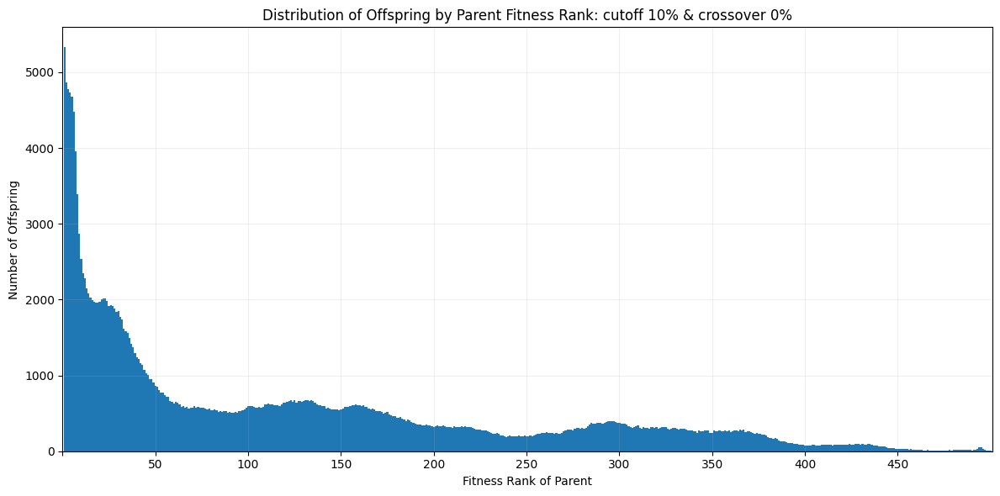

148


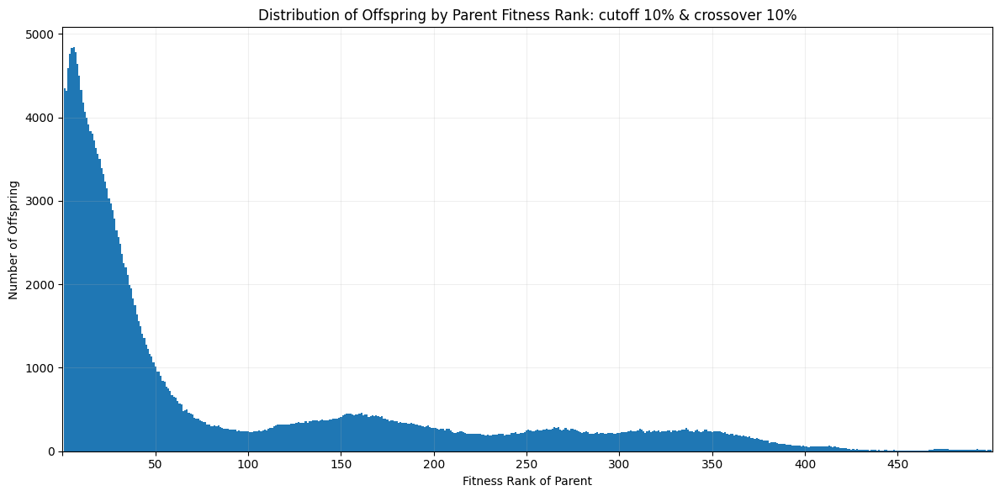

172


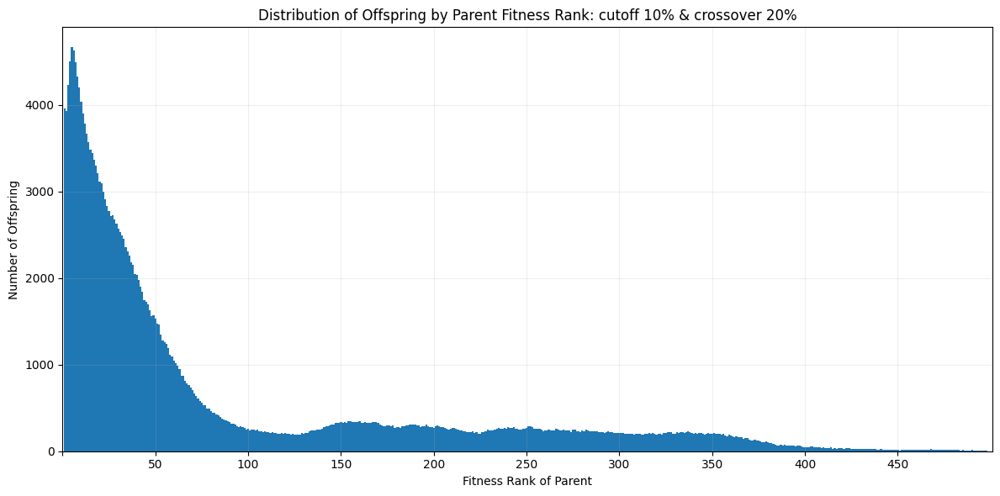

196


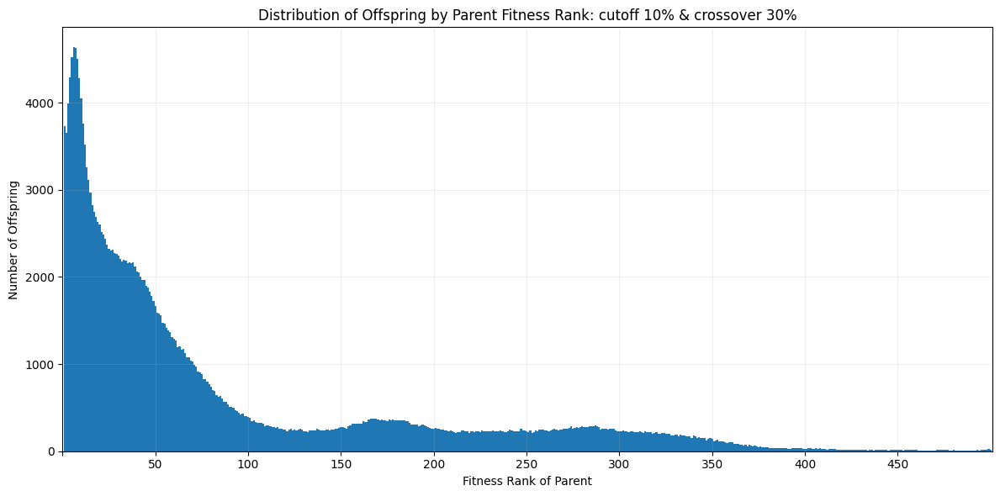

220


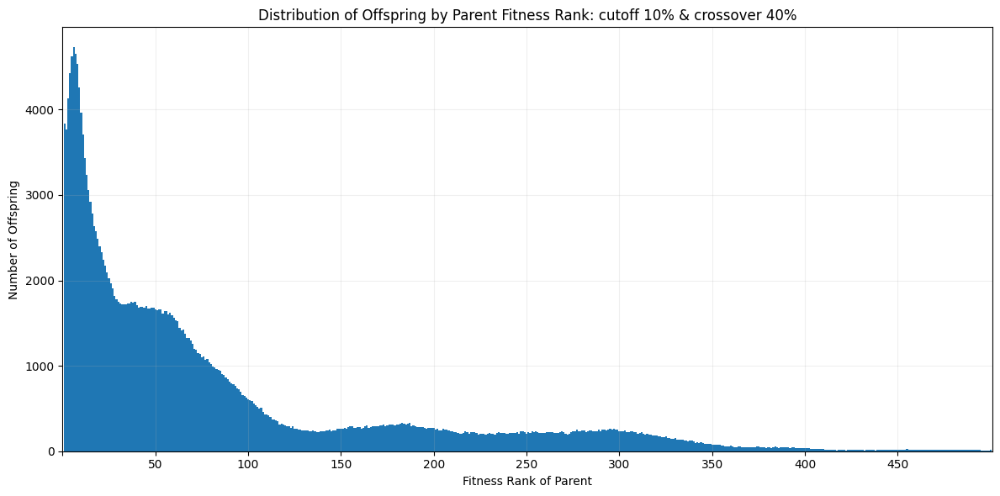

130


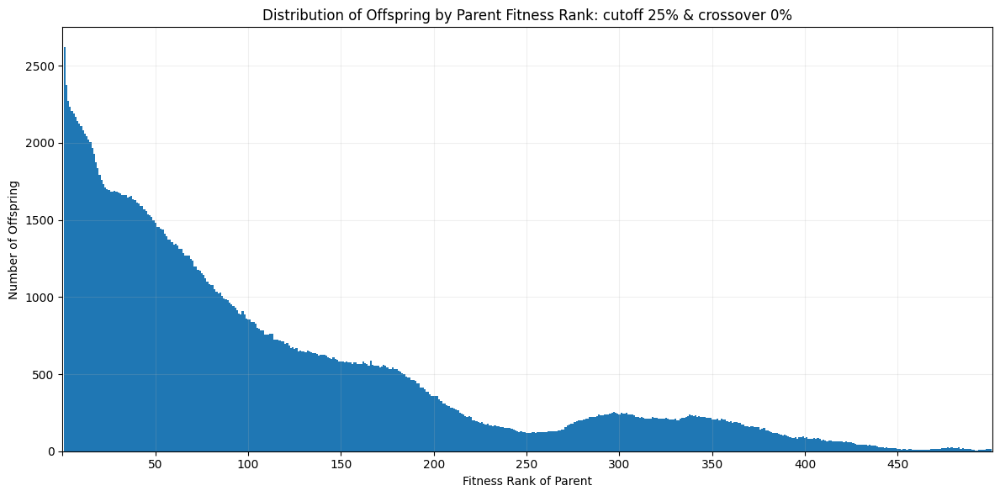

154


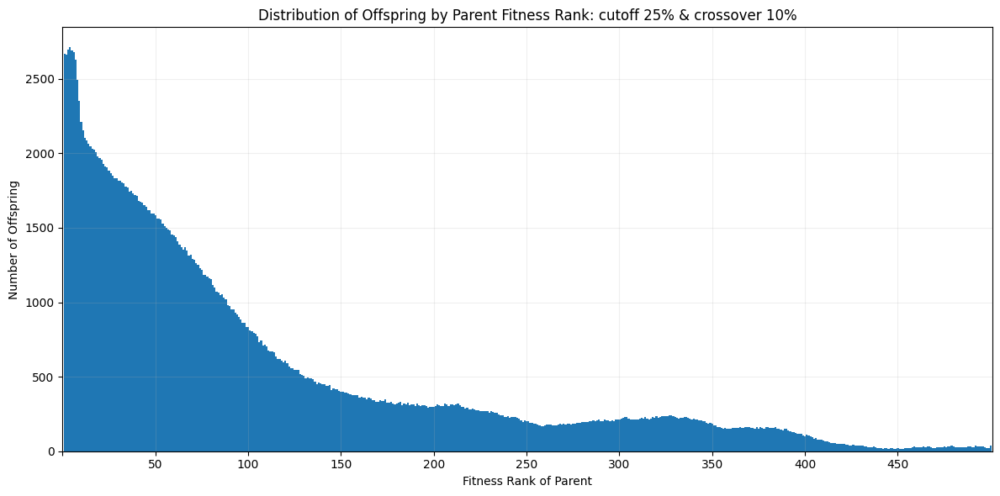

178


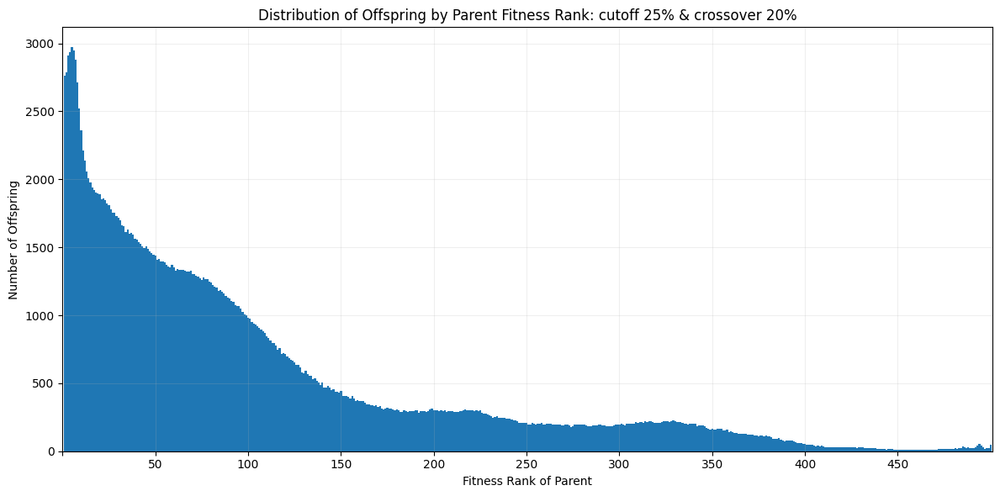

202


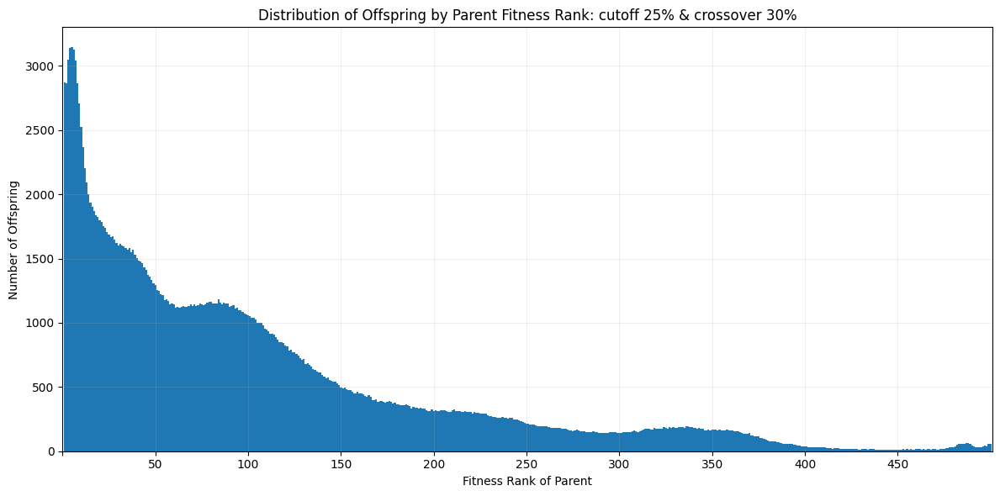

226


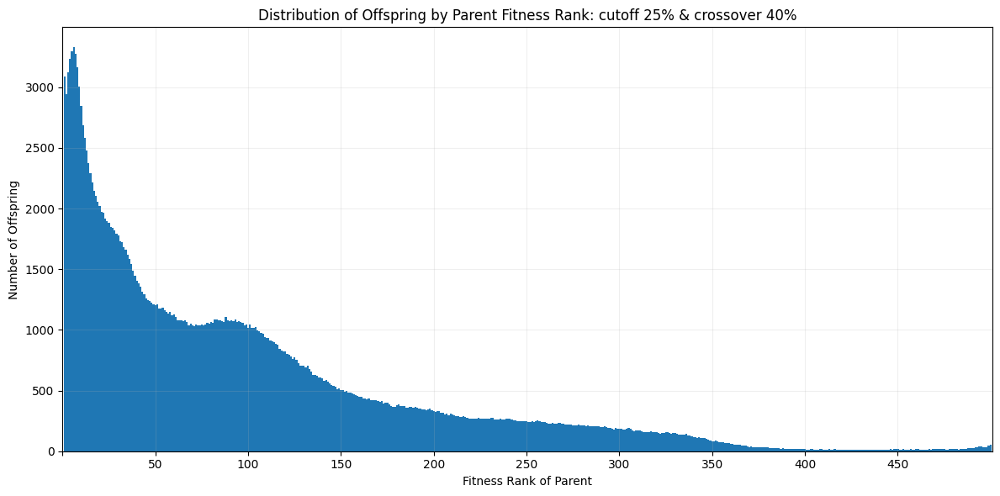

136


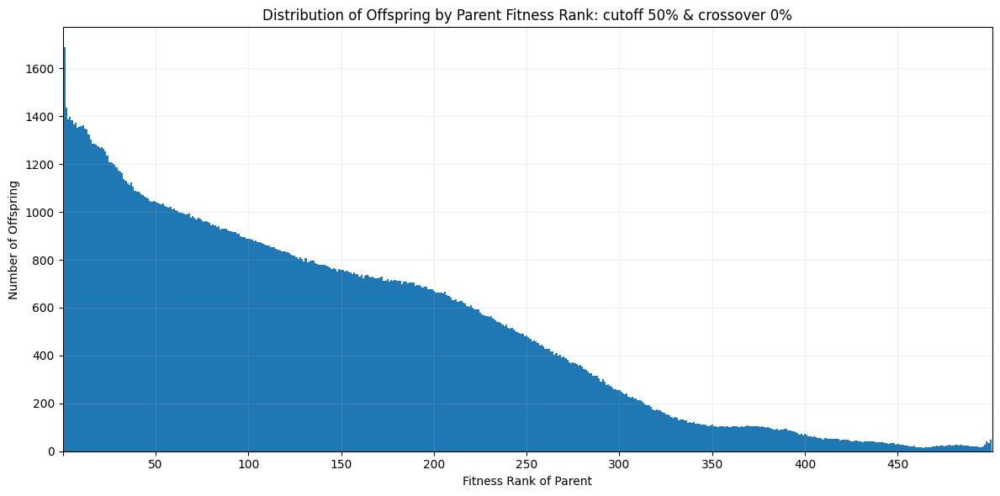

160


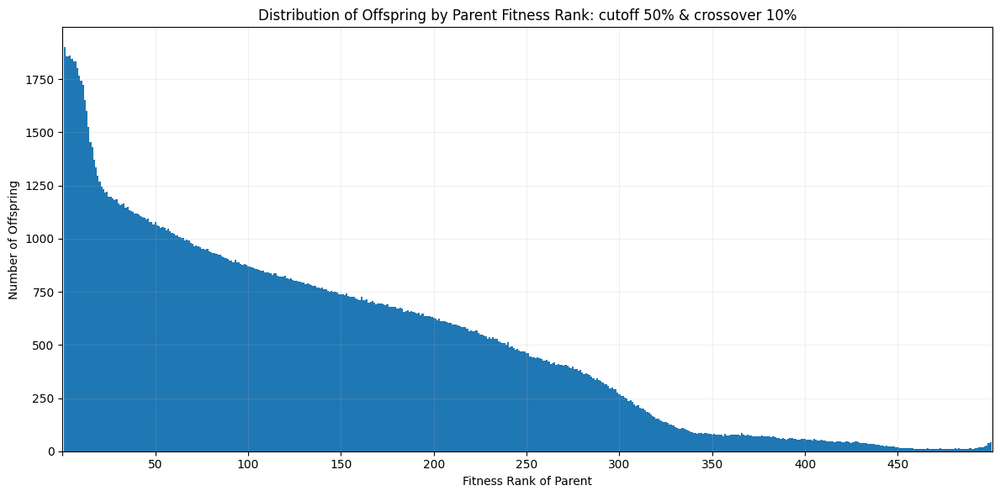

184


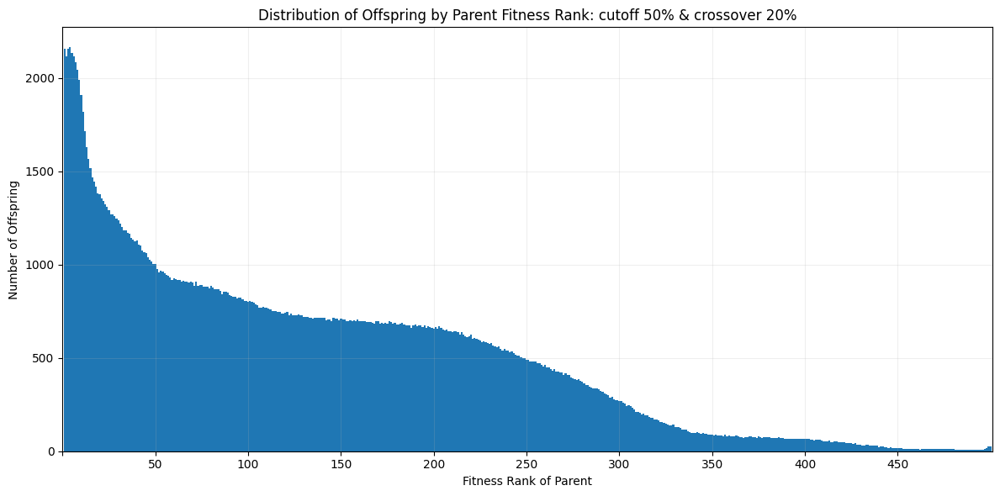

208


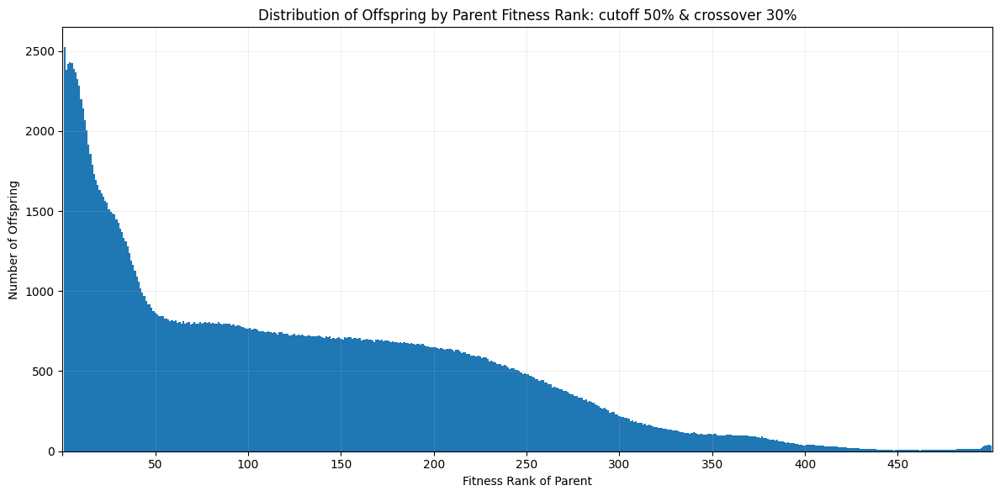

232


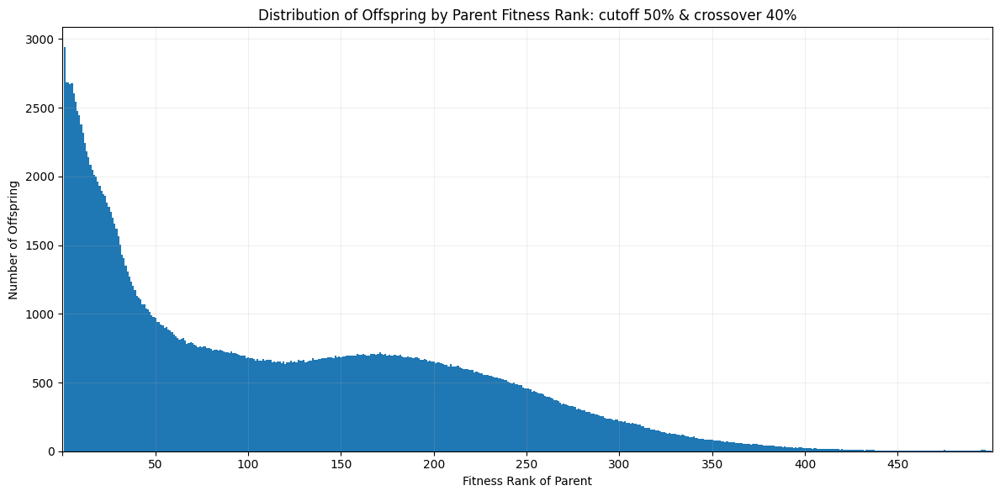

142


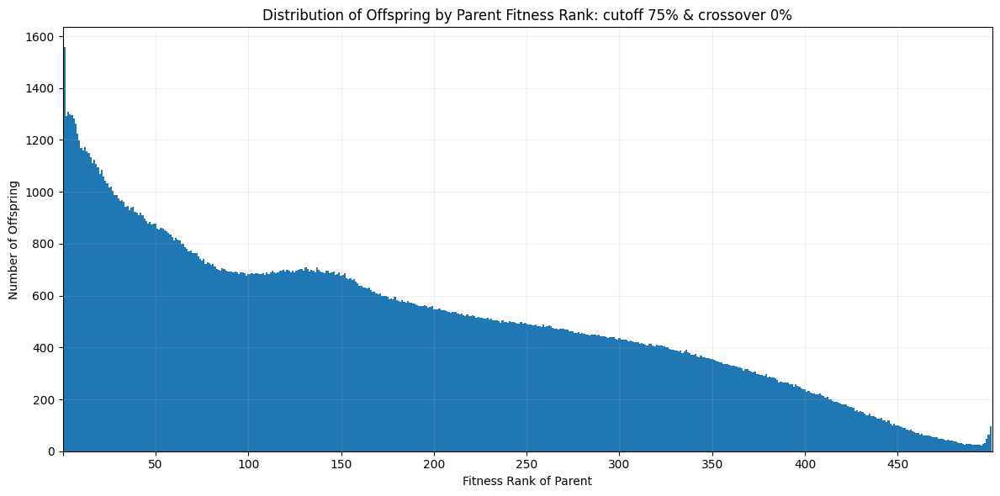

166


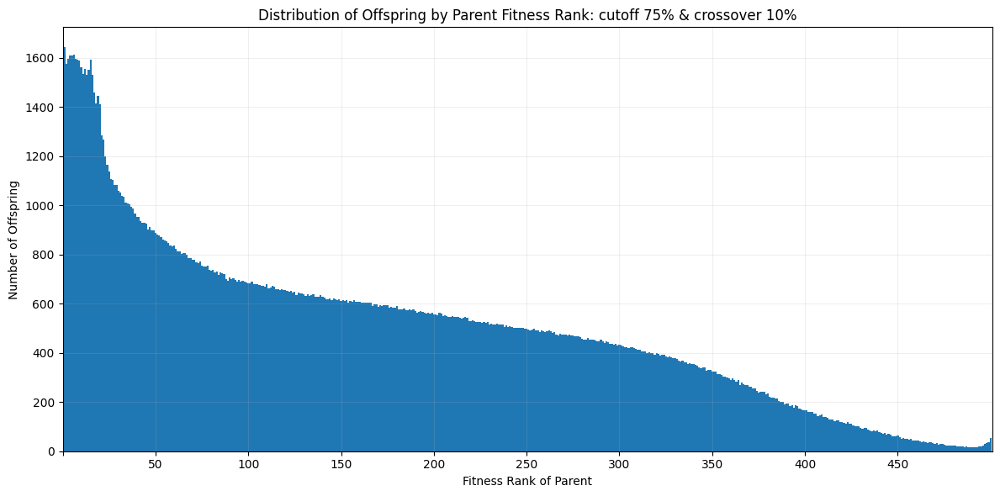

190


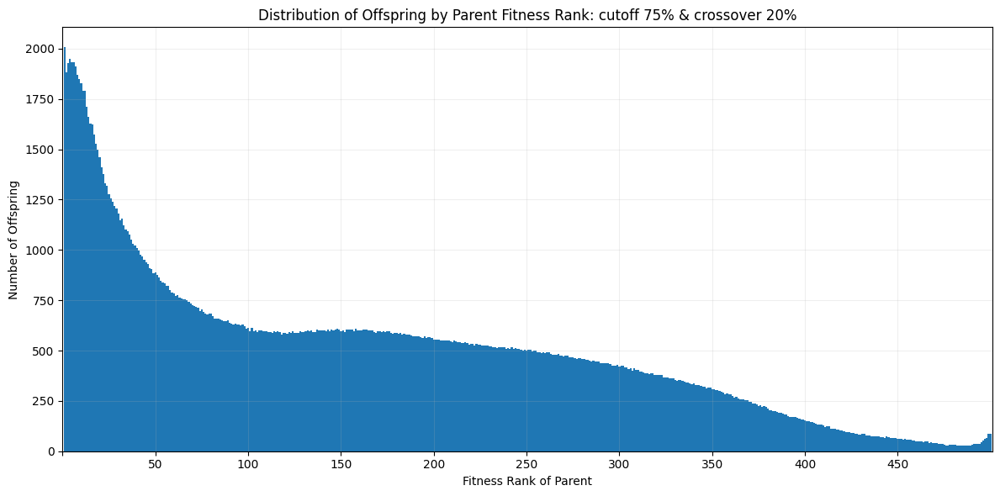

214


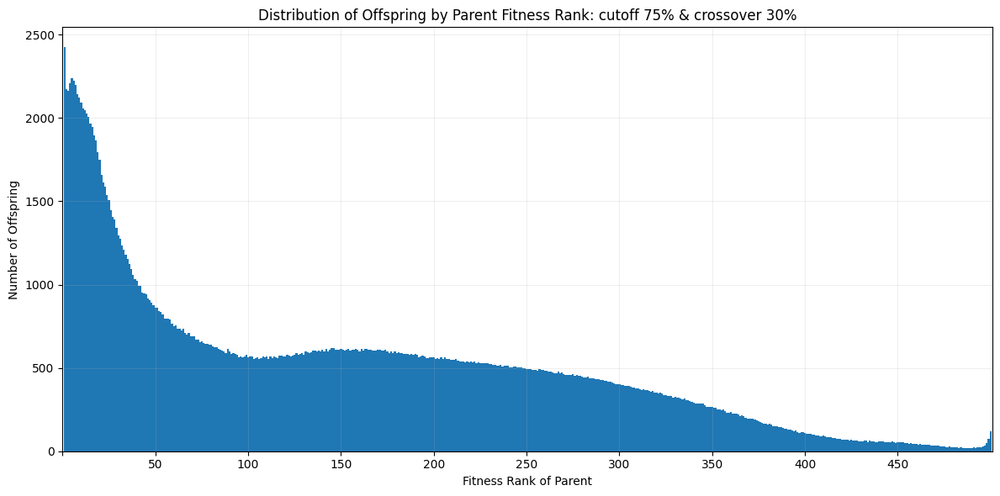

238


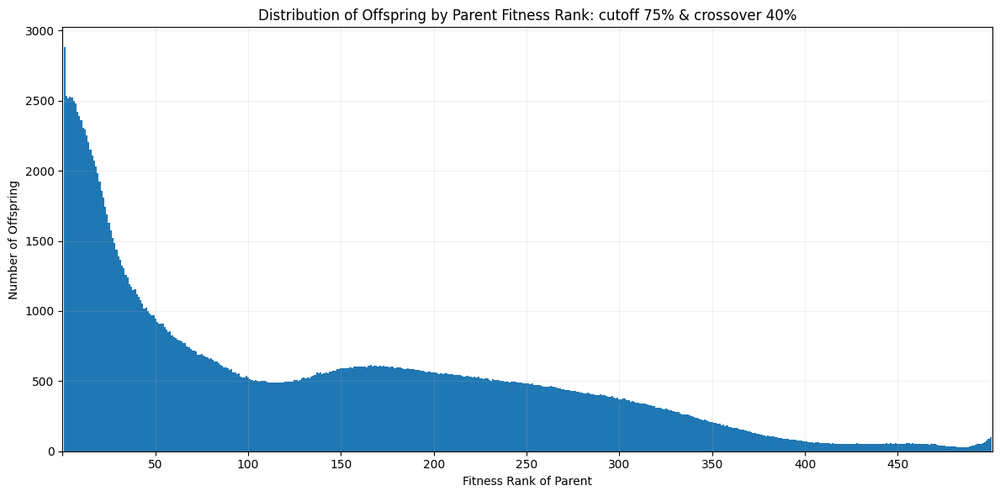

In [39]:
t = 'Distribution of Offspring by Parent Fitness Rank: '

hold_constant2 = {"species_boundary": 0.9, "species_component_pool_size": 5, "allowed_gens_no_improvement": 9999999}
s2 = {k: v | hold_constant2 for k, v in speciation_search2.items()}

for s_name, s_id in sorted(sa.search_setups(speciation_res, s2).items(), key= lambda x: x[0]):
    print(s_id[0])
    rs_data = speciation_res["setups"][s_id[0]]['spawn_rank_agg']
    sa.plot_offspring_distribution(rs_data, title=t+s_name)


 * increasing crossover leads to less pronounced fitness peaks, as the species mix and there are generally more fit genomes in the population, thus shifting the weight of the distribution to the left.

     *  crossover reinforces the left side of the distribution, there are more fit genomes spawned.

     These are often not the elite genomes in the population, it can be seen that the highest peak of the distribution is actually not on the left border of the plot with increasing crossover.

     *  when using a high cutoff, this left-side-reinforcement effect induced by crossover causes a new peak to rise.

     * This supports the idea that crossover is responsible for producing fitter genomes. This could just be an effect of tournament selection for crossover which is a higher selection pressure than the normal speciation spawn loop, in any case, it helps to produce fitter genomes.

 * Increasing the cutoff causes the different peaks between species to become more pronounced, as each species has more "less fit" individuals, including the best species.

     * however this time, it does not appear like the mean shifts left, just every species extends to the right

     * The effect of cutoff seems to be to extend the spawn distribution of each species, thus making them less "peaky" and more flat





 #### Extinction spawn plots

 holding boundary, component pool and crossover constant.

 Varying cutoff extinction and cutoff.

123


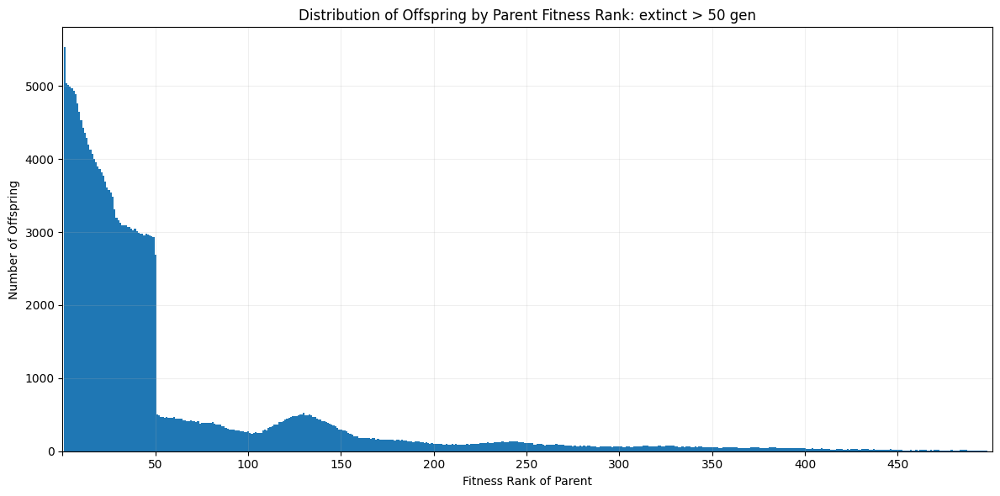

124


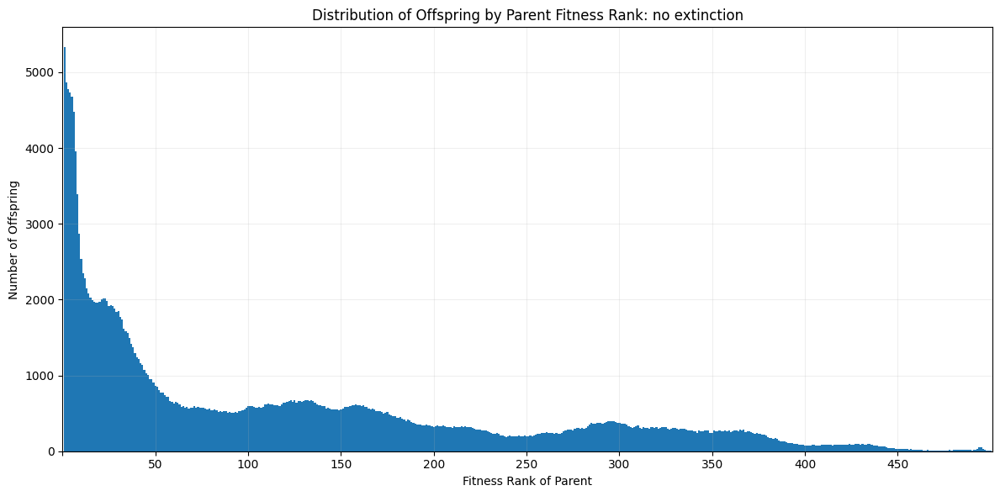

129


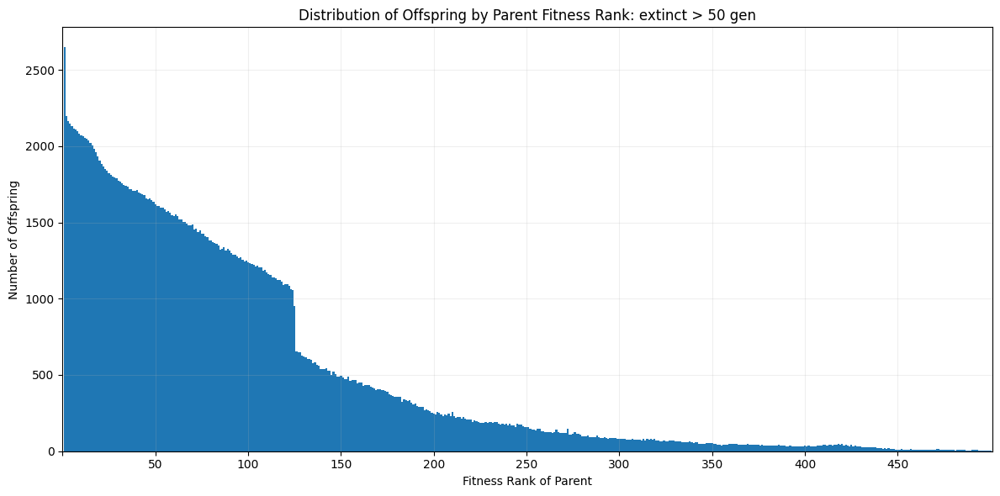

130


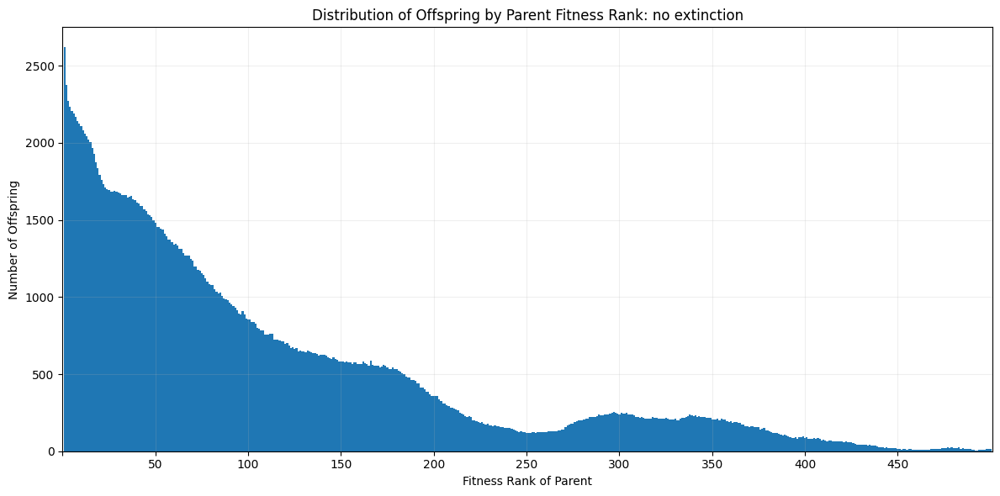

135


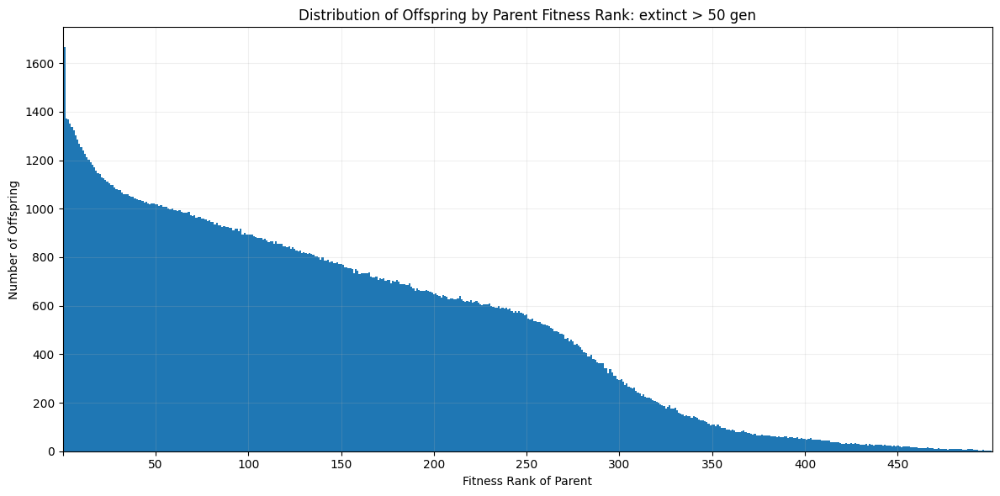

136


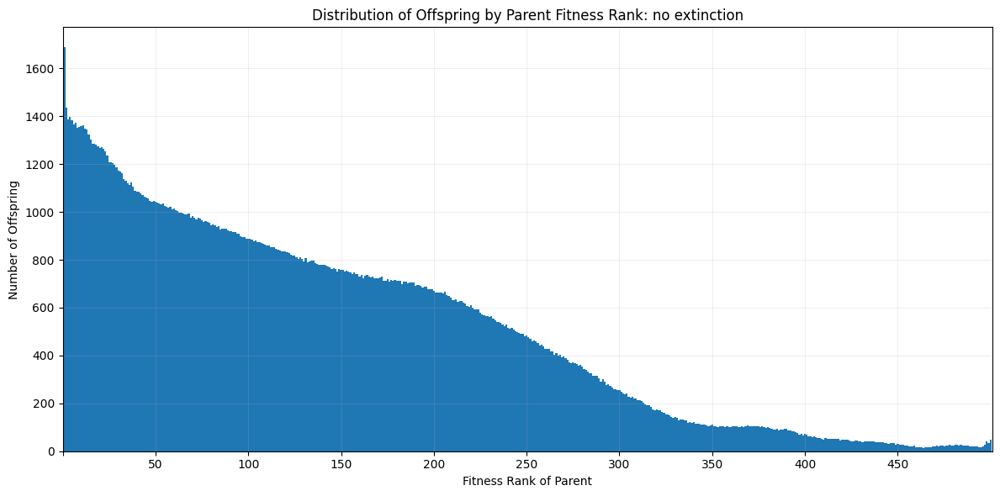

In [40]:
t = 'Distribution of Offspring by Parent Fitness Rank: '

for cu in [0.1, 0.25, 0.5]:
    hold_constant3 = {"species_boundary": 0.9, "pop_perc_crossover": 0.0, "spawn_cutoff": cu, "species_component_pool_size": 5}
    s3 = {k: v | hold_constant3 for k, v in speciation_search3.items()}

    for s_name, s_id in sorted(sa.search_setups(speciation_res, s3).items(), key= lambda x: x[0]):
        print(s_id[0])
        rs_data = speciation_res["setups"][s_id[0]]['spawn_rank_agg']
        sa.plot_offspring_distribution(rs_data, title=t+s_name)


 Extinction looks to have an effect similar to truncation in appearance.

 Compared to using no extinction, the left side of the distribution is heavier, meaning fitter genomes tend to produce more offspring.

 It is also chopped off, there is a visible cliff which is pushed further right with increasing cutoff until it stops being visible.



 I guess extinction has this effect because it kills off stale species, which has the effect of shifting the weight to the left, as unfit species become discarded.

 However after the optimum is reached, it starts killing off other fit species as well, which I think is the cause for the cliff.



 last I want to look at what the "optimum" setup 34 looks like

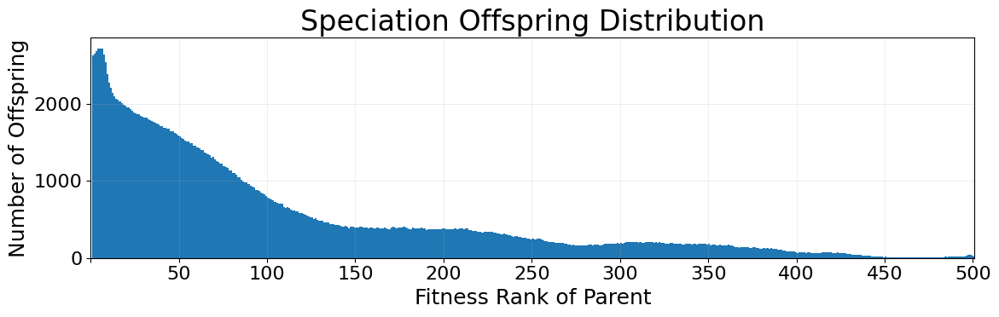

In [244]:
reload(sa)
_ = sa.plot_offspring_distribution(speciation_res["setups"][34]['spawn_rank_agg'], title="Speciation Offspring Distribution", fsize=(12,4))
_.savefig(analysis_plot_fp+"speciation/offspring.pdf")


okay, seems like a distribution where most of the weight is on the left side, but it is not as concentrated as some of the other extremes.



### Speciation selection summarized


### Speciation specific plots

#### What determines similarity

#### Todos for plots
* get the species tree plot from extinction run nr. 2
* get the non-extinciton species tree plot from normal run e.g. 4

i:\EvolvePetriNets\src\neatutils\endreports.py:694: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  figlegend.tight_layout()


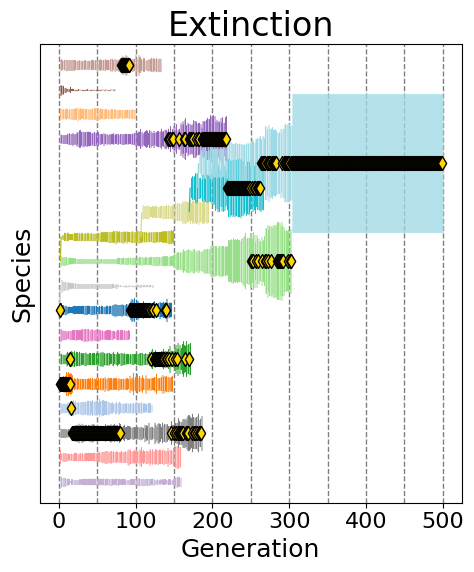

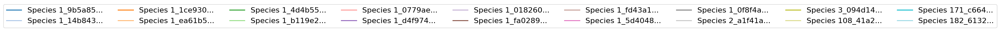

In [281]:
from neatutils import endreports as er
import pandas as pd
reload(er)



def save_species_tree(data_path):
    save_fp = analysis_plot_fp + "speciation/"
    species_df = pl.read_ipc(data_path + "species.feather").to_pandas()
    pop_df = pl.read_ipc(data_path + "population.feather").to_pandas()
    gen_info_df = pl.read_ipc(data_path + "gen_info.feather").to_pandas()
    species_cmap = er.get_species_color_map(species_df)
    er.plot_species_evolution(species_df, pop_df, gen_info_df, species_cmap, save_fp, maxwidth=100, figsize=(5,6))

save_species_tree("../analysis/data/speciation_small_run/execution_data/speciation_extinction/11_01-29-2025_23-24-40/data/")

i:\EvolvePetriNets\src\neatutils\endreports.py:694: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  figlegend.tight_layout()


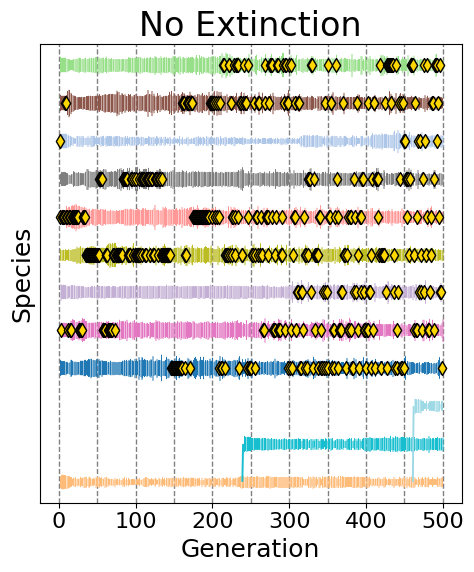

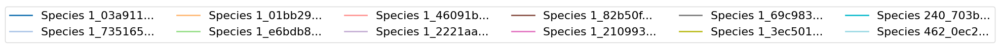

In [284]:
reload(er)
normal_speciation_run_fp ="I:/EvolvePetriNets/analysis/data/speciation_small_run/execution_data/speciation/20_01-29-2025_23-24-26/data/" 
save_species_tree(normal_speciation_run_fp)

### Average Species fitness over time


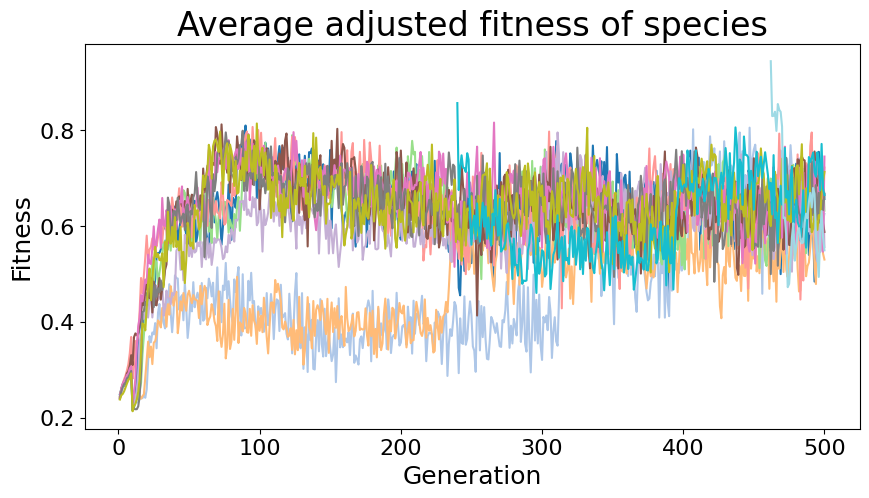

In [285]:
save_fp = analysis_plot_fp + "speciation/"
species_df = pl.read_ipc(normal_speciation_run_fp + "species.feather").to_pandas()
species_cmap = er.get_species_color_map(species_df)

er.plot_avg_species_fit(species_df, species_cmap, save_fp)

### Analyzing species similarity over time
This is done by comparing every combination of existing species in every generation of a run for their jaccard similarity of components.
Doing this for multiple runs and averaging the results of a setup (one with crossover, one without) yields the following plot

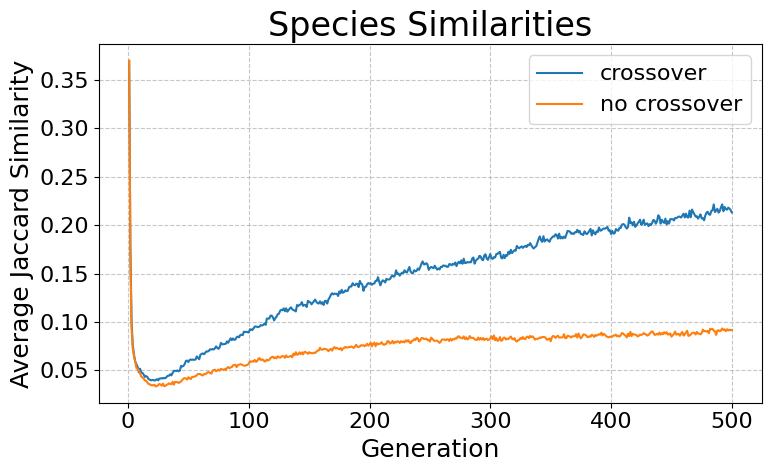

In [280]:
reload(sa)

avg_similarities_normal = sa.get_species_similarities_setup("I:/EvolvePetriNets/analysis/data/speciation_small_run/execution_data/speciation")
avg_similarities_no_cross = sa.get_species_similarities_setup("I:/EvolvePetriNets/analysis/data/speciation_small_run/execution_data/speciation_no_crossover")

similarity_collections = {
    "crossover": avg_similarities_normal,
    "no crossover": avg_similarities_no_cross
}
species_similarities_plot = sa.plot_similarities(similarity_collections, "Species Similarities")
species_similarities_plot.savefig(analysis_plot_fp+"speciation/species_similarities.pdf")

## Comparing selection strategies

Here I compare the three selection strategies using the best parameters I identified on 3 logs of increasing sizes.

Each selection strategy was run 20 times.

The logs are not very large, but increase in all size measures (num events, unique variants, activities).

This is to test if the current best selection strategy (speciation) maintains its edge when scaling up the log.



### Selection strategy params

#### Truncation selection

* 10% crossover

* 1% elites

* 25% cutoff



#### Roulette selection

* 30% crossover

* 5% elites



#### Speciation selection

* 10% crossover

* 25% cutoff

* 80% species boundary

* 5 component pool size

* inf gens allowed no improvement



### Used logs

For both the medium and big log, I used the following PDC properties:

* Dependent tasks: True

* Loops: Simple

* OR constructs: True

* Routing constructs: False

* Optional tasks: False

* Duplicate tasks: False

* Noise: False



#### Small log

The running example log

* path `I:/EvolvePetriNets/pm_data/running_example.xes`

* unique activities: 8

* total events: 42

* total variants: 6



#### Medium log

Log from the 2022 process discover contest (PDC).

* path `I:/EvolvePetriNets/pm_data/pdc_logs/2022/Training Logs/pdc2022_1110000.xes`

* unique activities: 16

* total events: 6280

* total variants: 95



#### Big log

Log from the 2024 process discover contest (PDC).

* path `I:/EvolvePetriNets/pm_data/pdc_logs/2024/Training Logs/pdc2024_11100000.xes`

* unique activities: 27

* total events: 14529

* total variants: 734

In [13]:
from importlib import reload # TODO: remove this later
import scripts.helper_scripts.setup_analysis as sa # helper module for fetching setup analysis
reload(sa)
# crawl the results data and load it into a dict
comparison_res = sa.exec_results_crawler("../analysis/data/selection_comparison", use_setup_num=False, load_best_genomes=False)


Processing setup directories: 0it [00:00, ?it/s]

roulette_big_log

Found cached results for roulette_big_log


Processing setup directories: 4it [00:18,  4.71s/it]

Successfully loaded cached results for roulette_big_log
roulette_medium_log

Found cached results for roulette_medium_log


Processing setup directories: 5it [00:32,  7.14s/it]

Successfully loaded cached results for roulette_medium_log
roulette_small_log

Found cached results for roulette_small_log


Processing setup directories: 6it [00:40,  7.18s/it]

Successfully loaded cached results for roulette_small_log
speciation_big_log

Found cached results for speciation_big_log


Processing setup directories: 7it [01:12, 14.28s/it]

Successfully loaded cached results for speciation_big_log
speciation_medium_log

Found cached results for speciation_medium_log


Processing setup directories: 8it [01:31, 15.70s/it]

Successfully loaded cached results for speciation_medium_log
speciation_small_log

Found cached results for speciation_small_log


Processing setup directories: 9it [01:38, 13.18s/it]

Successfully loaded cached results for speciation_small_log
truncation_big_log

Found cached results for truncation_big_log


Processing setup directories: 10it [01:53, 13.64s/it]

Successfully loaded cached results for truncation_big_log
truncation_medium_log

Found cached results for truncation_medium_log


Processing setup directories: 11it [02:02, 12.34s/it]

Successfully loaded cached results for truncation_medium_log
truncation_small_log

Found cached results for truncation_small_log


Processing setup directories: 12it [02:07, 10.65s/it]

Successfully loaded cached results for truncation_small_log


This time I did not change any params except for the selection strategy, thus I won't do regression.

### Comparing fitness

**TODO** 
* re-run with better fitness func and more gens for all logs
* add a table for comparison based on final results df
* add 3 scatterplots of total components discovered ~ best fitness for each of the three logs
    * point color is the selectionstrat - check if the diversity - fitness effect holds for all three selection functions -> that means more generalizable
* gini coeff for fitness values?

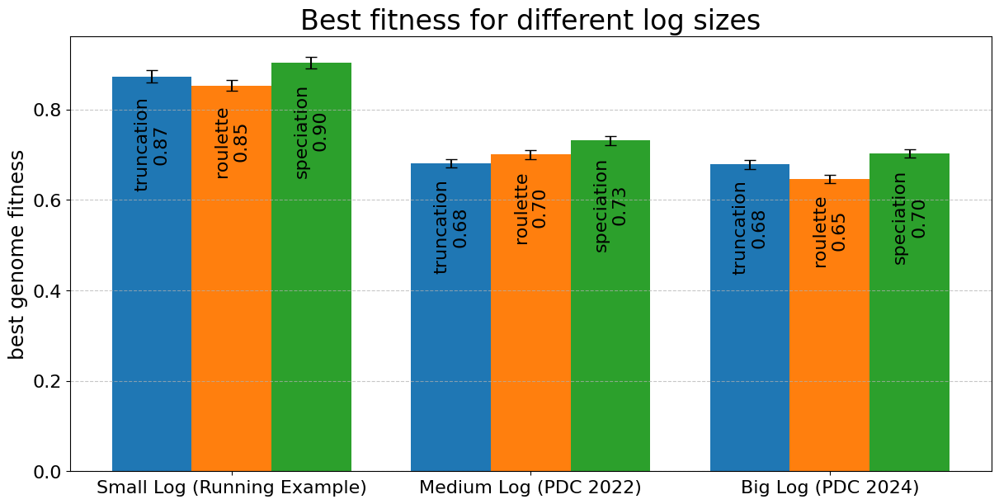

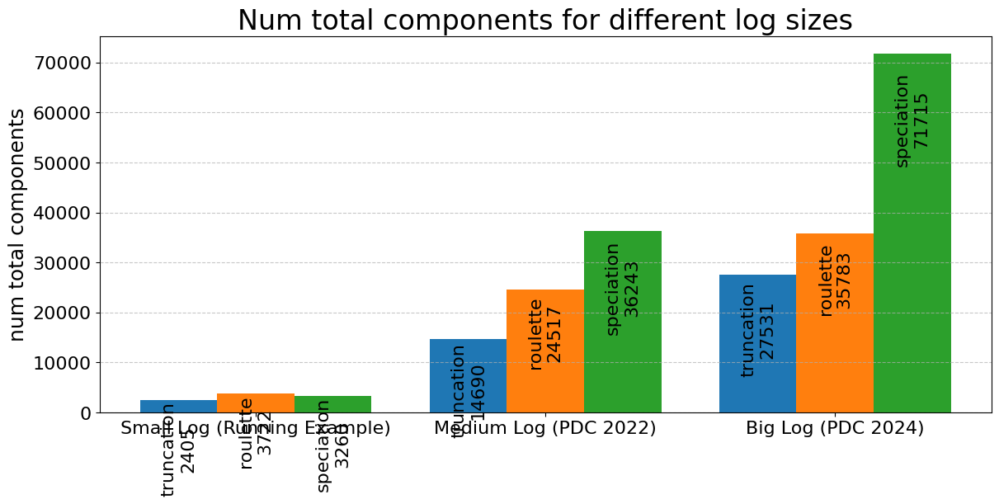

In [38]:
reload(sa)
comparison_search = {}
for k in comparison_res["setups"]:
    comparison_search[k.replace("_", " ")] = [k]

comparison_plt_layout = [
    ["truncation small log", "roulette small log", "speciation small log"],
    ["truncation medium log", "roulette medium log", "speciation medium log"],
    ["truncation big log", "roulette big log", "speciation big log"]
]

 
# strip_second_param = lambda l: l.split('&')[0].strip().split('\n')[0] # lambda to be applied on labels

comparison_data_sources = sa.search_and_aggregate_param_results(comparison_res, search_dict=dict(), search_res=comparison_search)
comparison_groups = ["Small Log (Running Example)", "Medium Log (PDC 2022)", "Big Log (PDC 2024)"]
only_selec_strat = lambda l: l.split()[0] +"\n"+ l.split("\n")[1] # lambda to be applied on labels
plt_best_fit_comparison_logsizes = sa.generalized_barplot(comparison_plt_layout, comparison_data_sources, "best_genome_fitness", title="Best fitness for different log sizes", group_titles=comparison_groups, label_lambda=only_selec_strat)
plt_best_fit_comparison_logsizes.savefig(analysis_plot_fp + "selection/best_fitness.pdf", bbox_inches='tight', pad_inches=0.1)

only_selec_strat_strip_fp = lambda l: l.split()[0] +"\n"+ l.split("\n")[1].split(".")[0] # lambda to be applied on labels
plt_component_comparison_logsizes = sa.generalized_barplot(comparison_plt_layout, comparison_data_sources, "num_total_components", title="Num total components for different log sizes", group_titles=comparison_groups, label_lambda=only_selec_strat_strip_fp)
plt_component_comparison_logsizes.savefig(analysis_plot_fp + "selection/num_components.pdf", bbox_inches='tight', pad_inches=0.1)

# comparison_res["final_report"]


In [15]:
# comparison_res["setups"]["speciation_big_log"]["best_genomes"]
# sel_comp_df, _ = sa.analyze_best_genome_comps(comparison_res)
# sel_comp_df.to_pandas()[["name", "total_unique_comps", "mean_compcount"]]
comparison_res["final_report"]

setupname,run_nr,max_fitness,num_components,Exceptions
str,i64,f64,i64,bool
"""speciation_small_log""",1,0.903509,3310,false
"""speciation_small_log""",2,0.896825,3240,false
"""speciation_small_log""",3,0.903509,3239,false
"""speciation_small_log""",4,0.903509,3295,false
"""speciation_small_log""",5,0.903509,3261,false
…,…,…,…,…
"""truncation_big_log""",8,0.640651,27577,false
"""truncation_big_log""",9,0.642073,25211,false
"""truncation_big_log""",10,0.643748,25982,false


 speciation is still the best selection strat, with roulette and truncation trading places

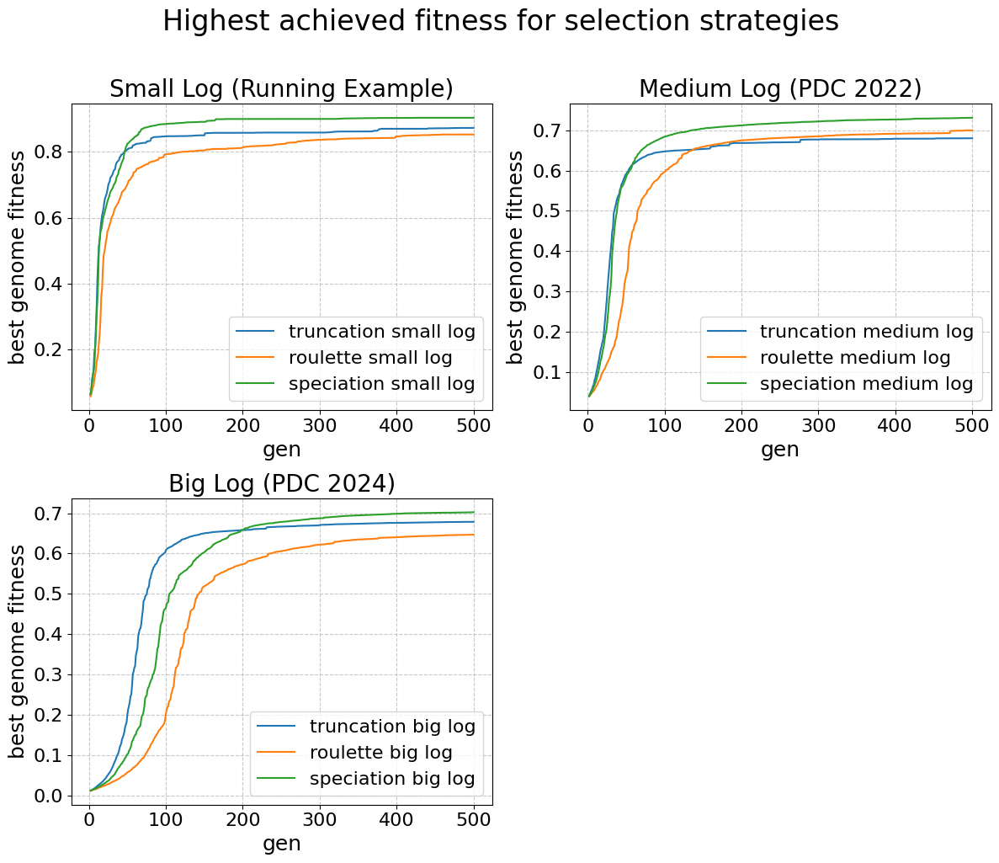

In [51]:
reload(sa)
plt_compare_selection_strats = sa.generalized_lineplot(comparison_plt_layout, comparison_data_sources, "best_genome_fitness", title="Highest achieved fitness for selection strategies", subplt_titles=comparison_groups, figsize=(12,10))
plt_compare_selection_strats.savefig(analysis_plot_fp + "selection/compare_strats.pdf", bbox_inches='tight', pad_inches=0.1)


speciation reaches the best fitness results about as quickly as truncation in all runs but the big log, but surpasses it in max fitness every time.

I also want to look at the variance of fitness over time.
This could also be an indicator if a selection strategy converges faster/makes a more greedy selection of high-fitness individuals (i.e. it takes bigger steps in fitness and sacrifices diversity).
A higher variance in the fitnesses of each generation could correspond to more diversity, because the algorithm also selects less fit individuals.
This is kinda similar to the information from the spawn rank plots.

I am also curious how the fitness variance evolves over time. will it increase and reduce at some point?

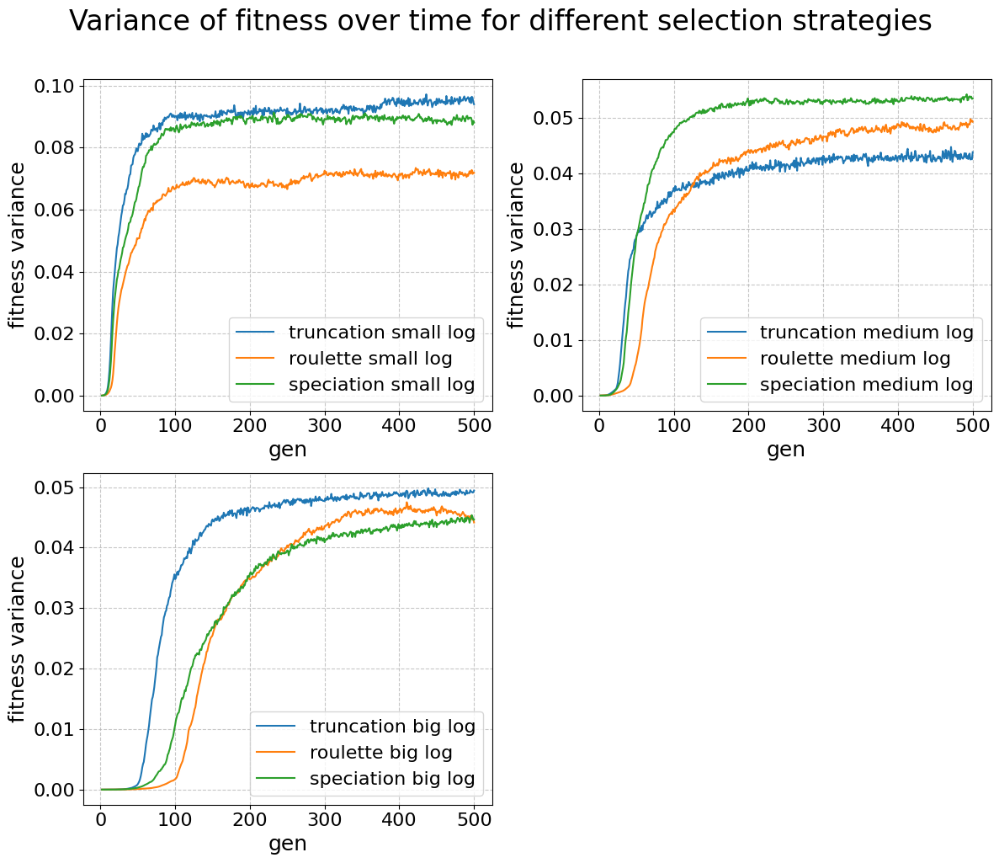

In [53]:
_ = sa.generalized_lineplot(comparison_plt_layout, comparison_data_sources, "fitness_variance", title="Variance of fitness over time for different selection strategies", figsize=(12,10))

The variance of all selection strategies increases over time and does not decrease.
For all selection strategies this indicates that as time increases, the best genomes in the population become much better than the population average (which remains pretty low due to negative effect of random mutations), thus increasing the variance.
After the best fitness starts stagnating, the variance remains constant and does not decrease (which would be the case if the rest of the population aligns with the best solution).

relevant quote from melanie mitchell:
"""Typically, early in the search the fitness variance in the population is high and a small number of individuals are much fitter than the others. Under fitness−proportionate selection, they and their descendents will multiply quickly in the population, in effect preventing the GA from doing any further exploration. This is known as "premature convergence.""""

 ### Comparing total components

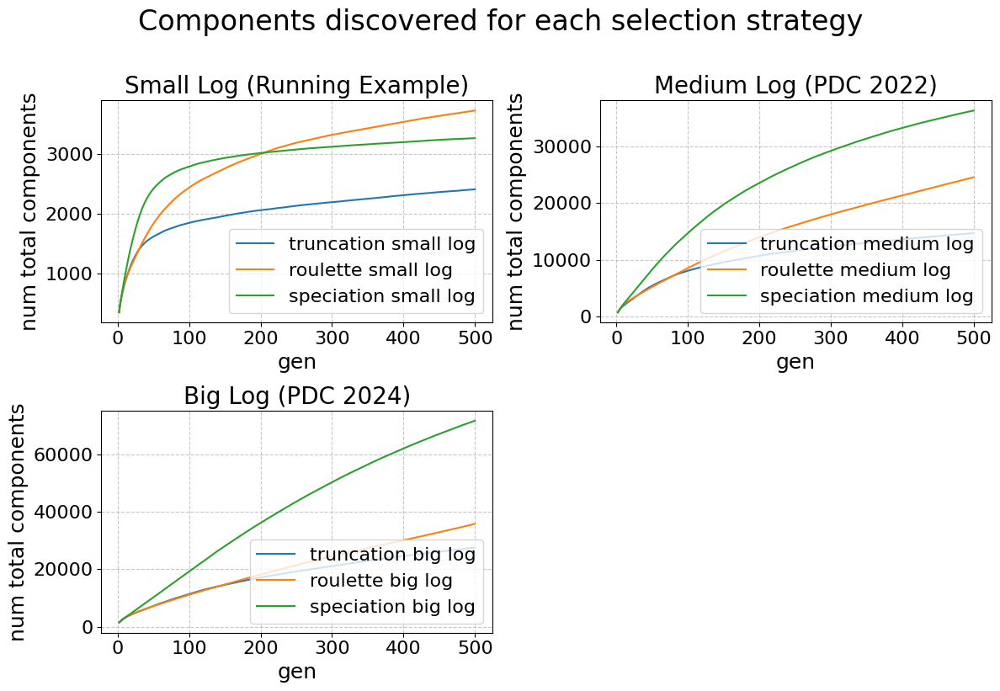

In [54]:
_ = sa.generalized_lineplot(comparison_plt_layout, comparison_data_sources, "num_total_components", title="Components discovered for each selection strategy", subplt_titles=comparison_groups)


 ### Comparing unique components

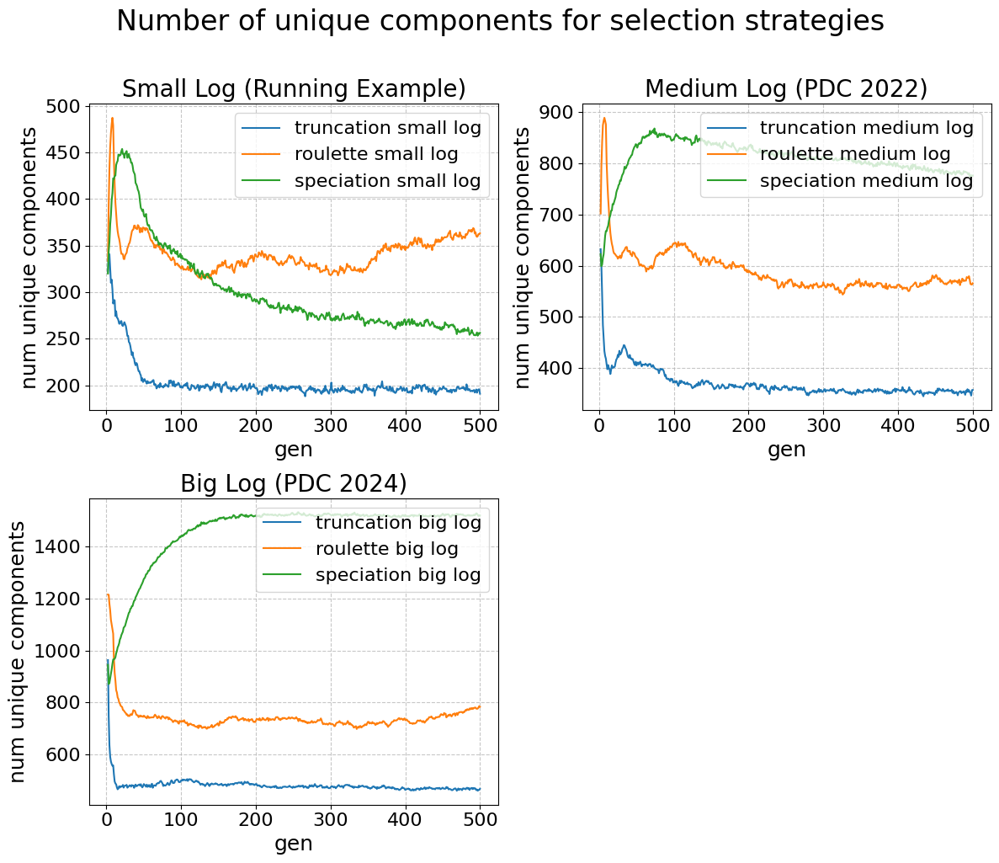

In [56]:
plt_compare_unique_components_selstrats = sa.generalized_lineplot(comparison_plt_layout, comparison_data_sources, "num_unique_components", title="Number of unique components for selection strategies", subplt_titles=comparison_groups, legend_loc="upper right", figsize=(12,10))
plt_compare_unique_components_selstrats.savefig(analysis_plot_fp + "selection/unique_components.pdf", bbox_inches='tight', pad_inches=0.1)



 # Scaling tests



 ## Scaling popsize

 How does performance change as popsize increases?



 ### Small log

 I tested this using speciation selection with the same parameters as used in the selection strat comparison.

 The test was conducted on the running example log, with a 10 runs of 1000 generations.



 **TODOs**

 * also look at time cost

 * scale up to mid size log

In [47]:
from importlib import reload # TODO: remove this later
import scripts.helper_scripts.setup_analysis as sa # helper module for fetching setup analysis
reload(sa)
# crawl the results data and load it into a dict
small_popsize_res = sa.exec_results_crawler("../analysis/data/popsize_small_log", use_setup_num=False)


Processing setup directories: 18it [00:00, 2763.45it/s]


Found cached results for 100
Successfully loaded cached results for 100

Found cached results for 1000
Successfully loaded cached results for 1000

Found cached results for 150
Successfully loaded cached results for 150

Found cached results for 200
Successfully loaded cached results for 200

Found cached results for 250
Successfully loaded cached results for 250

Found cached results for 300
Successfully loaded cached results for 300

Found cached results for 350
Successfully loaded cached results for 350

Found cached results for 400
Successfully loaded cached results for 400

Found cached results for 450
Successfully loaded cached results for 450

Found cached results for 50
Successfully loaded cached results for 50

Found cached results for 500
Successfully loaded cached results for 500

Found cached results for 600
Successfully loaded cached results for 600

Found cached results for 700
Successfully loaded cached results for 700

Found cached results for 800
Successfully loaded c

#### comparing fitness curves

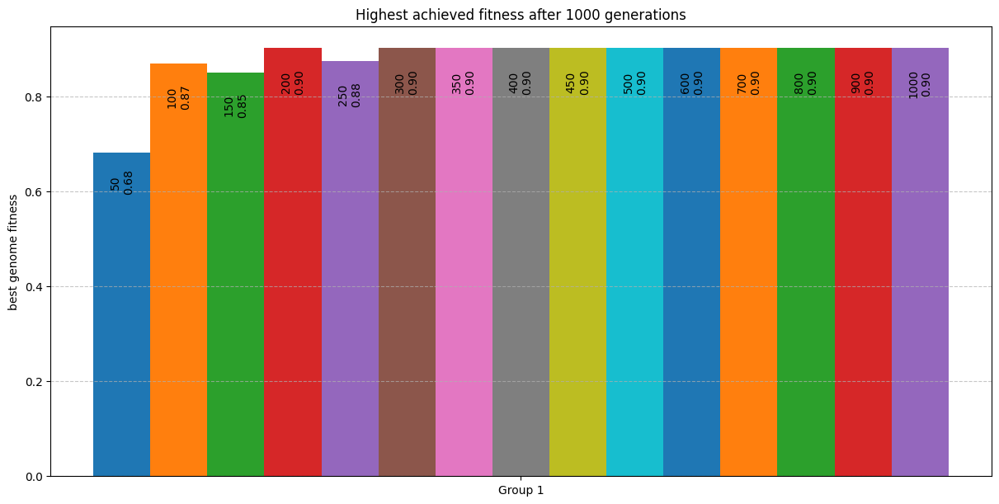

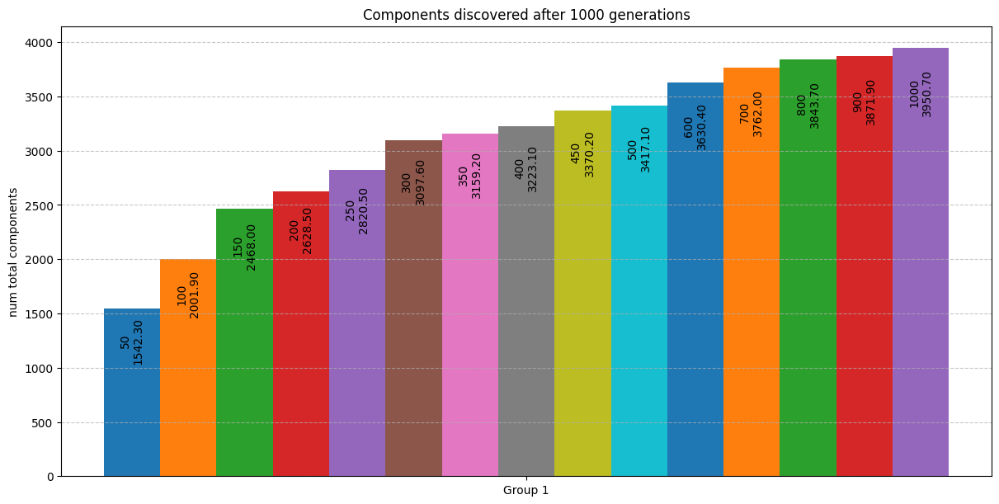

In [48]:
popsize_search = {
    "50":   {"popsize": 50}, "100":  {"popsize": 100}, "150":  {"popsize": 150},
    "200":  {"popsize": 200}, "250":  {"popsize": 250}, "300":  {"popsize": 300},
    "350":  {"popsize": 350}, "400":  {"popsize": 400}, "450":  {"popsize": 450},
    "500":  {"popsize": 500}, "600":  {"popsize": 600}, "700":  {"popsize": 700},
    "800":  {"popsize": 800}, "900":  {"popsize": 900}, "1000": {"popsize": 1000},
}


popsize_plt_layout = [[ "50", "100", "150", "200", "250", "300", "350", "400",
    "450", "500", "600", "700", "800", "900", "1000" ] ]

 
small_popsize_data_sources = sa.search_and_aggregate_param_results(small_popsize_res, popsize_search)
_ = sa.generalized_barplot(popsize_plt_layout, small_popsize_data_sources, "best_genome_fitness", title="Highest achieved fitness after 1000 generations")
_ = sa.generalized_barplot(popsize_plt_layout, small_popsize_data_sources, "num_total_components", title="Components discovered after 1000 generations")



#### popsize - fitness

First, lets look at the fitness progression when using the different crossover and fitness settings

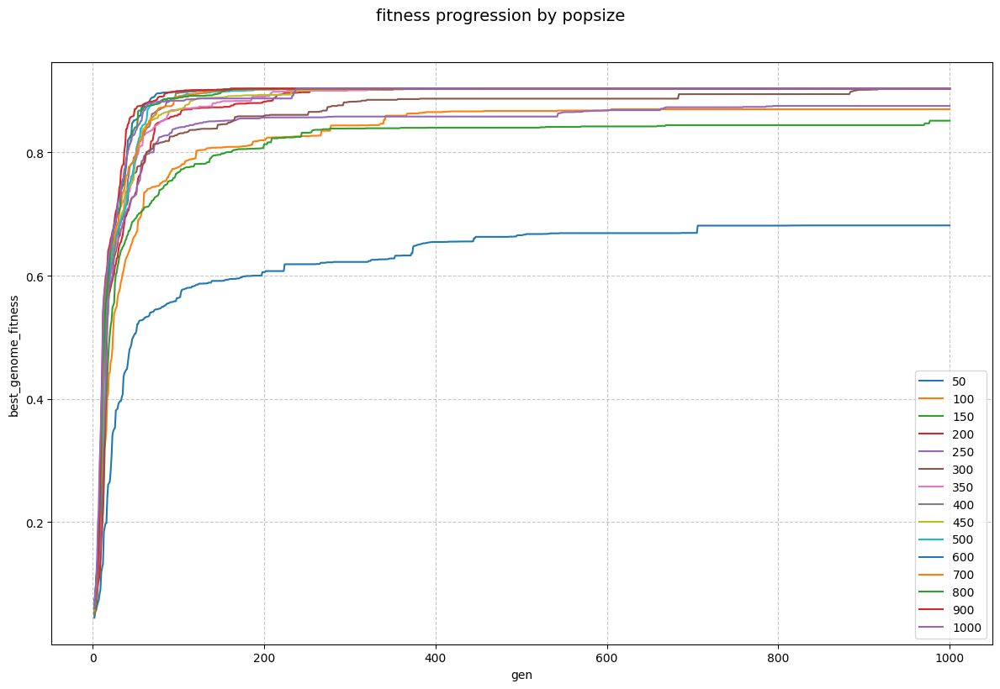

In [49]:
_ = sa.generalized_lineplot(popsize_plt_layout, small_popsize_data_sources, "best_genome_fitness", title="fitness progression by popsize")


 Actually great results, indicating that there is not much of a benefit going higher than 500 gens

 This also shows that you can't directly "bruteforce" better results by simply sampling with a larger population.

 Beyond a certain point, increasing the population size won't result in bigger fitness increases.

 This shows that the search is more sophisticated than just sampling every point in the search space, if that were the case, then there would be a bigger benefit to larger population sizes.

#### comparing gens until max fit
todo

filter each setup for the first generation that achieved that
* runs max fitness (also save that fitness)
* the overall max fitness for the running example log per my definition


### Big log (incomplete run)
This is too inefficient, I had to terminate early, only got 62 runs across a setups up to popsize 400. Num of runs is unevenly distributed across setups

Nonetheless, here is the same analysis for the medium log, 1000 generations per run

Also, I intended to run the medium log but accidentally ran the big log. No wonder it took so long LOL

In [3]:
from importlib import reload # TODO: remove this later
import scripts.helper_scripts.setup_analysis as sa # helper module for fetching setup analysis
reload(sa)
# crawl the results data and load it into a dict
big_popsize_res = sa.exec_results_crawler("../analysis/data/popsize_big_log", use_setup_num=False)

Processing setup directories: 11it [00:00, 1363.40it/s]


Found cached results for 100
Successfully loaded cached results for 100

Found cached results for 150
Successfully loaded cached results for 150

Found cached results for 200
Successfully loaded cached results for 200

Found cached results for 250
Successfully loaded cached results for 250

Found cached results for 300
Successfully loaded cached results for 300

Found cached results for 350
Successfully loaded cached results for 350

Found cached results for 400
Successfully loaded cached results for 400

Found cached results for 50
Successfully loaded cached results for 50


 #### comparing fitness curves

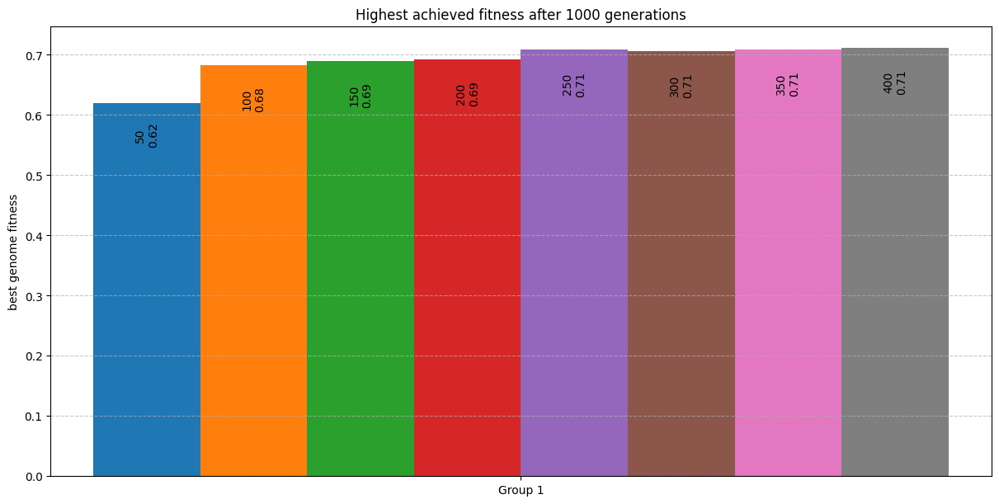

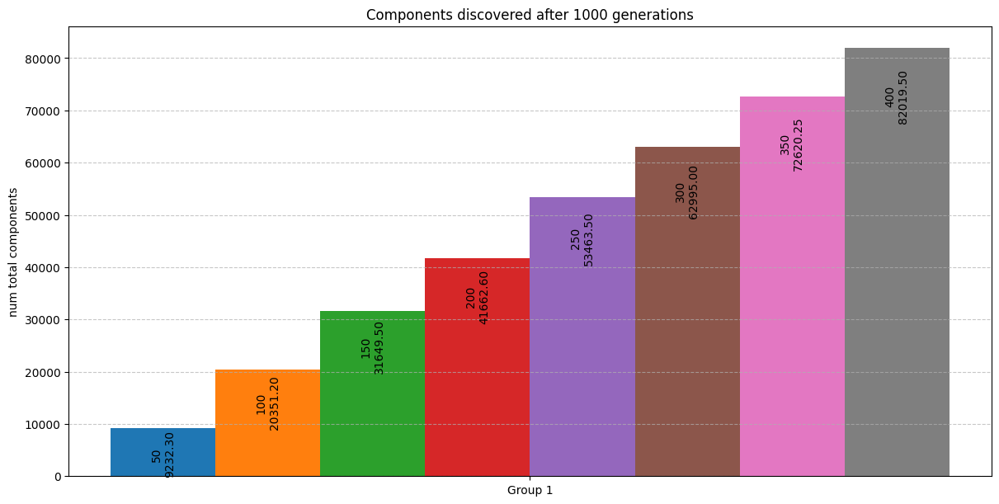

In [4]:
big_popsize_search = {
    "50":   {"popsize": 50}, "100":  {"popsize": 100}, "150":  {"popsize": 150},
    "200":  {"popsize": 200}, "250":  {"popsize": 250}, "300":  {"popsize": 300},
    "350":  {"popsize": 350}, "400":  {"popsize": 400}, "450":  {"popsize": 450},
}


big_popsize_plt_layout = [["50", "100", "150", "200", "250", "300", "350", "400"]]

 
big_popsize_data_sources = sa.search_and_aggregate_param_results(big_popsize_res, big_popsize_search)
_ = sa.generalized_barplot(big_popsize_plt_layout, big_popsize_data_sources, "best_genome_fitness", title="Highest achieved fitness after 1000 generations")
_ = sa.generalized_barplot(big_popsize_plt_layout, big_popsize_data_sources, "num_total_components", title="Components discovered after 1000 generations")



 ### popsize - fitness

 First, lets look at the fitness progression when using the different crossover and fitness settings

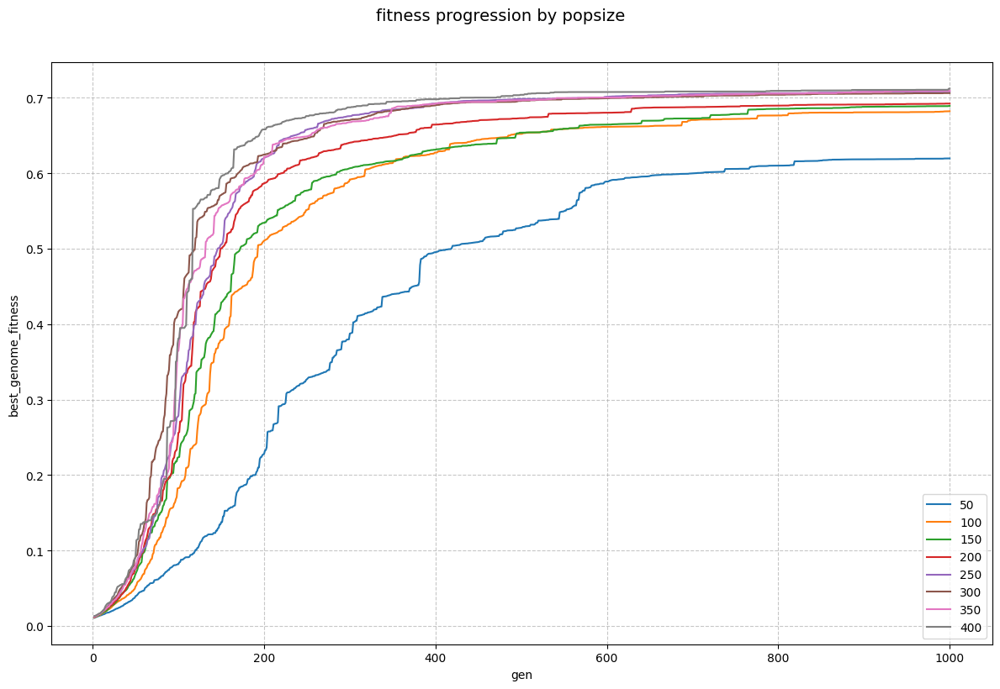

In [6]:
_ = sa.generalized_lineplot(big_popsize_plt_layout, big_popsize_data_sources, "best_genome_fitness", title="fitness progression by popsize")


Even though the data is incomplete, this is extremely reassuring :)
There seem to be similar diminishing returns to increasing the popsize, even though the searchspace is much larger this time.
Best of all, the diminishing returns do not start at much higher population sizes than in the tiny log! In fact, a popsize of 250 seems to yield quite good results

An interesting side observation is also that even though the results are aggregated, and in the case of the popsize 50 run (blue line) there are 10 runs, the aggregate fitness line still has steps.
The aggregate should normally smooth-over such steps, but maybe there are so many really steep steps in the the runs that they still show up a bit in the aggregate.
Would have to look at the individual runs with popsize 50 to see if there are crazy steps that lead to this.

# Comparing old TBR against new TBR
I used the code from an old version commit [73e4031](https://github.com/pastra98/EvolvePetriNets/tree/73e4031b8777bfd72c213a68e0f59e36b66f6749) against new version [64b0211](https://github.com/pastra98/EvolvePetriNets/tree/64b021105a9e2ad2874ec2b24f6806a118e6229c).

Both runs are running example, 300 popsize 300 gens.
Claude helped write a quick function to process the log and spit out the differences in eval times

In [11]:
reload(sa)
oldcode = "../analysis/data/compare_old_replay_new_replay/old_code_300p_300g_re/prob_01/1_01-22-2025_16-03-56/1_01-22-2025_16-03-56.log"
newcode = "../analysis/data/compare_old_replay_new_replay/new_code_300p_300g_re/testme/1_01-22-2025_16-20-17/1_01-22-2025_16-20-17.log"
speed_diff = sa.compare_ga_logs(newcode, oldcode)


Log 1:
Average evaluation time: 0.0291 seconds
Total evaluation time: 8.7373 seconds
Number of generations: 300

Log 2:
Average evaluation time: 0.8754 seconds
Total evaluation time: 262.6167 seconds
Number of generations: 300

Log 1 is 30.06x faster than Log 2


# Fitness Function
todos:
* test the tbr multiplier?

## Finding good weights for the running example log
After I found out that anchors are indeed important, but can be set to the same value across all metrics, I decided to test some weight configs for the small log

**test description:**

For logs without hidden transitions (like running example) these should be the only metrics that are needed.

Anchors are used, but they are all 0.3 and set to aggregated replay fitness.

For agg replay fitness, the weights 1, 2 and 3 are tested

For the following other metrics, I tested 0, 0.5 and 1
* remaining score
* over enabled trans
* num arcs
* sink score

therefore not included in the fitness function weight test are:
* io-connectedness: should not be necessary, the new replay function should punish those anyways
* mean-by-max: also probably not necessary, it is not really a good indicator of model quality and just some heuristic shit I made up
* trans-by-tasks: not needed, because this log does not require hidden transitions and I disabled the mutations for that
* precision: I just implemented that in principle to have the thing from literature, but it doesn't really say anything
* token-usage: agg replay fit should take care of that
* trans-by-places: similarly just a meaningless heuristic that I included

10 runs for each setup

**todos**
* This can be tested by compiling all mutations that improved simplicity or precision metrics, and measuring the change in replay fitness.
* Use some other metrics to measure the quality dimensions of process models. this is important for testing if the algorithm is naturally inclined towards generalization over precision.
* Actually look at the weight configurations and figure out what makes them work, what their differences are etc.
* Compare those also against the results from the midsize log
* this might also be a good place for comparing the results obtained based on different metrics

In [44]:
from importlib import reload
import scripts.helper_scripts.setup_analysis as sa
reload(sa)

running_example_fit_weights = sa.exec_results_crawler("../analysis/data/fitness_weights_test_running_example")

Processing setup directories: 0it [00:00, ?it/s]

setup_1

Found cached results for setup_1


Processing setup directories: 4it [00:02,  1.41it/s]

Successfully loaded cached results for setup_1
setup_10

Found cached results for setup_10


Processing setup directories: 5it [00:05,  1.23s/it]

Successfully loaded cached results for setup_10
setup_100

Found cached results for setup_100


Processing setup directories: 6it [00:08,  1.69s/it]

Successfully loaded cached results for setup_100
setup_101

Found cached results for setup_101


Processing setup directories: 7it [00:11,  2.00s/it]

Successfully loaded cached results for setup_101
setup_102

Found cached results for setup_102


Processing setup directories: 8it [00:14,  2.24s/it]

Successfully loaded cached results for setup_102
setup_103

Found cached results for setup_103


Processing setup directories: 9it [00:16,  2.23s/it]

Successfully loaded cached results for setup_103
setup_104

Found cached results for setup_104


Processing setup directories: 10it [00:18,  2.16s/it]

Successfully loaded cached results for setup_104
setup_105

Found cached results for setup_105


Processing setup directories: 11it [00:20,  2.16s/it]

Successfully loaded cached results for setup_105
setup_106

Found cached results for setup_106


Processing setup directories: 12it [00:22,  2.19s/it]

Successfully loaded cached results for setup_106
setup_107

Found cached results for setup_107


Processing setup directories: 13it [00:24,  2.14s/it]

Successfully loaded cached results for setup_107
setup_108

Found cached results for setup_108


Processing setup directories: 14it [00:27,  2.19s/it]

Successfully loaded cached results for setup_108
setup_109

Found cached results for setup_109


Processing setup directories: 15it [00:29,  2.18s/it]

Successfully loaded cached results for setup_109
setup_11

Found cached results for setup_11


Processing setup directories: 16it [00:32,  2.46s/it]

Successfully loaded cached results for setup_11
setup_110

Found cached results for setup_110


Processing setup directories: 17it [00:34,  2.29s/it]

Successfully loaded cached results for setup_110
setup_111

Found cached results for setup_111


Processing setup directories: 18it [00:36,  2.30s/it]

Successfully loaded cached results for setup_111
setup_112

Found cached results for setup_112


Processing setup directories: 19it [00:38,  2.17s/it]

Successfully loaded cached results for setup_112
setup_113

Found cached results for setup_113


Processing setup directories: 20it [00:40,  2.20s/it]

Successfully loaded cached results for setup_113
setup_114

Found cached results for setup_114


Processing setup directories: 21it [00:42,  2.24s/it]

Successfully loaded cached results for setup_114
setup_115

Found cached results for setup_115


Processing setup directories: 22it [00:45,  2.28s/it]

Successfully loaded cached results for setup_115
setup_116

Found cached results for setup_116


Processing setup directories: 23it [00:47,  2.21s/it]

Successfully loaded cached results for setup_116
setup_117

Found cached results for setup_117


Processing setup directories: 24it [00:49,  2.30s/it]

Successfully loaded cached results for setup_117
setup_118

Found cached results for setup_118


Processing setup directories: 25it [00:52,  2.31s/it]

Successfully loaded cached results for setup_118
setup_119

Found cached results for setup_119


Processing setup directories: 26it [00:54,  2.29s/it]

Successfully loaded cached results for setup_119
setup_12

Found cached results for setup_12


Processing setup directories: 27it [00:57,  2.56s/it]

Successfully loaded cached results for setup_12
setup_120

Found cached results for setup_120


Processing setup directories: 28it [01:00,  2.53s/it]

Successfully loaded cached results for setup_120
setup_121

Found cached results for setup_121


Processing setup directories: 29it [01:02,  2.44s/it]

Successfully loaded cached results for setup_121
setup_122

Found cached results for setup_122


Processing setup directories: 30it [01:04,  2.40s/it]

Successfully loaded cached results for setup_122
setup_123

Found cached results for setup_123


Processing setup directories: 31it [01:06,  2.34s/it]

Successfully loaded cached results for setup_123
setup_124

Found cached results for setup_124


Processing setup directories: 32it [01:09,  2.31s/it]

Successfully loaded cached results for setup_124
setup_125

Found cached results for setup_125


Processing setup directories: 33it [01:11,  2.21s/it]

Successfully loaded cached results for setup_125
setup_126

Found cached results for setup_126


Processing setup directories: 34it [01:13,  2.29s/it]

Successfully loaded cached results for setup_126
setup_127

Found cached results for setup_127


Processing setup directories: 35it [01:16,  2.36s/it]

Successfully loaded cached results for setup_127
setup_128

Found cached results for setup_128


Processing setup directories: 36it [01:18,  2.40s/it]

Successfully loaded cached results for setup_128
setup_129

Found cached results for setup_129


Processing setup directories: 37it [01:21,  2.49s/it]

Successfully loaded cached results for setup_129
setup_13

Found cached results for setup_13


Processing setup directories: 38it [01:23,  2.38s/it]

Successfully loaded cached results for setup_13
setup_130

Found cached results for setup_130


Processing setup directories: 39it [01:25,  2.40s/it]

Successfully loaded cached results for setup_130
setup_131

Found cached results for setup_131


Processing setup directories: 40it [01:28,  2.41s/it]

Successfully loaded cached results for setup_131
setup_132

Found cached results for setup_132


Processing setup directories: 41it [01:30,  2.42s/it]

Successfully loaded cached results for setup_132
setup_133

Found cached results for setup_133


Processing setup directories: 42it [01:32,  2.33s/it]

Successfully loaded cached results for setup_133
setup_134

Found cached results for setup_134


Processing setup directories: 43it [01:35,  2.33s/it]

Successfully loaded cached results for setup_134
setup_135

Found cached results for setup_135


Processing setup directories: 44it [01:37,  2.28s/it]

Successfully loaded cached results for setup_135
setup_136

Found cached results for setup_136


Processing setup directories: 45it [01:39,  2.31s/it]

Successfully loaded cached results for setup_136
setup_137

Found cached results for setup_137


Processing setup directories: 46it [01:41,  2.27s/it]

Successfully loaded cached results for setup_137
setup_138

Found cached results for setup_138


Processing setup directories: 47it [01:44,  2.24s/it]

Successfully loaded cached results for setup_138
setup_139

Found cached results for setup_139


Processing setup directories: 48it [01:45,  2.15s/it]

Successfully loaded cached results for setup_139
setup_14

Found cached results for setup_14


Processing setup directories: 49it [01:48,  2.24s/it]

Successfully loaded cached results for setup_14
setup_140

Found cached results for setup_140


Processing setup directories: 50it [01:50,  2.14s/it]

Successfully loaded cached results for setup_140
setup_141

Found cached results for setup_141


Processing setup directories: 51it [01:52,  2.17s/it]

Successfully loaded cached results for setup_141
setup_142

Found cached results for setup_142


Processing setup directories: 52it [01:54,  2.19s/it]

Successfully loaded cached results for setup_142
setup_143

Found cached results for setup_143


Processing setup directories: 53it [01:56,  2.09s/it]

Successfully loaded cached results for setup_143
setup_144

Found cached results for setup_144


Processing setup directories: 54it [01:58,  2.13s/it]

Successfully loaded cached results for setup_144
setup_145

Found cached results for setup_145


Processing setup directories: 55it [02:00,  2.12s/it]

Successfully loaded cached results for setup_145
setup_146

Found cached results for setup_146


Processing setup directories: 56it [02:03,  2.20s/it]

Successfully loaded cached results for setup_146
setup_147

Found cached results for setup_147


Processing setup directories: 57it [02:05,  2.30s/it]

Successfully loaded cached results for setup_147
setup_148

Found cached results for setup_148


Processing setup directories: 58it [02:08,  2.29s/it]

Successfully loaded cached results for setup_148
setup_149

Found cached results for setup_149


Processing setup directories: 59it [02:10,  2.25s/it]

Successfully loaded cached results for setup_149
setup_15

Found cached results for setup_15


Processing setup directories: 60it [02:12,  2.28s/it]

Successfully loaded cached results for setup_15
setup_150

Found cached results for setup_150


Processing setup directories: 61it [02:15,  2.31s/it]

Successfully loaded cached results for setup_150
setup_151

Found cached results for setup_151


Processing setup directories: 62it [02:17,  2.22s/it]

Successfully loaded cached results for setup_151
setup_152

Found cached results for setup_152


Processing setup directories: 63it [02:19,  2.16s/it]

Successfully loaded cached results for setup_152
setup_153

Found cached results for setup_153


Processing setup directories: 64it [02:21,  2.20s/it]

Successfully loaded cached results for setup_153
setup_154

Found cached results for setup_154


Processing setup directories: 65it [02:23,  2.26s/it]

Successfully loaded cached results for setup_154
setup_155

Found cached results for setup_155


Processing setup directories: 66it [02:26,  2.32s/it]

Successfully loaded cached results for setup_155
setup_156

Found cached results for setup_156


Processing setup directories: 67it [02:28,  2.29s/it]

Successfully loaded cached results for setup_156
setup_157

Found cached results for setup_157


Processing setup directories: 68it [02:30,  2.30s/it]

Successfully loaded cached results for setup_157
setup_158

Found cached results for setup_158


Processing setup directories: 69it [02:33,  2.33s/it]

Successfully loaded cached results for setup_158
setup_159

Found cached results for setup_159


Processing setup directories: 70it [02:35,  2.38s/it]

Successfully loaded cached results for setup_159
setup_16

Found cached results for setup_16


Processing setup directories: 71it [02:37,  2.28s/it]

Successfully loaded cached results for setup_16
setup_160

Found cached results for setup_160


Processing setup directories: 72it [02:39,  2.26s/it]

Successfully loaded cached results for setup_160
setup_161

Found cached results for setup_161


Processing setup directories: 73it [02:42,  2.21s/it]

Successfully loaded cached results for setup_161
setup_162

Found cached results for setup_162


Processing setup directories: 74it [02:44,  2.24s/it]

Successfully loaded cached results for setup_162
setup_163

Found cached results for setup_163


Processing setup directories: 75it [02:47,  2.53s/it]

Successfully loaded cached results for setup_163
setup_164

Found cached results for setup_164


Processing setup directories: 76it [02:50,  2.76s/it]

Successfully loaded cached results for setup_164
setup_165

Found cached results for setup_165


Processing setup directories: 77it [02:54,  2.93s/it]

Successfully loaded cached results for setup_165
setup_166

Found cached results for setup_166


Processing setup directories: 78it [02:56,  2.74s/it]

Successfully loaded cached results for setup_166
setup_167

Found cached results for setup_167


Processing setup directories: 79it [02:58,  2.64s/it]

Successfully loaded cached results for setup_167
setup_168

Found cached results for setup_168


Processing setup directories: 80it [03:01,  2.64s/it]

Successfully loaded cached results for setup_168
setup_169

Found cached results for setup_169


Processing setup directories: 81it [03:03,  2.57s/it]

Successfully loaded cached results for setup_169
setup_17

Found cached results for setup_17


Processing setup directories: 82it [03:06,  2.49s/it]

Successfully loaded cached results for setup_17
setup_170

Found cached results for setup_170


Processing setup directories: 83it [03:08,  2.43s/it]

Successfully loaded cached results for setup_170
setup_171

Found cached results for setup_171


Processing setup directories: 84it [03:10,  2.41s/it]

Successfully loaded cached results for setup_171
setup_172

Found cached results for setup_172


Processing setup directories: 85it [03:13,  2.58s/it]

Successfully loaded cached results for setup_172
setup_173

Found cached results for setup_173


Processing setup directories: 86it [03:16,  2.71s/it]

Successfully loaded cached results for setup_173
setup_174

Found cached results for setup_174


Processing setup directories: 87it [03:19,  2.75s/it]

Successfully loaded cached results for setup_174
setup_175

Found cached results for setup_175


Processing setup directories: 88it [03:22,  2.62s/it]

Successfully loaded cached results for setup_175
setup_176

Found cached results for setup_176


Processing setup directories: 89it [03:24,  2.55s/it]

Successfully loaded cached results for setup_176
setup_177

Found cached results for setup_177


Processing setup directories: 90it [03:26,  2.51s/it]

Successfully loaded cached results for setup_177
setup_178

Found cached results for setup_178


Processing setup directories: 91it [03:29,  2.48s/it]

Successfully loaded cached results for setup_178
setup_179

Found cached results for setup_179


Processing setup directories: 92it [03:31,  2.45s/it]

Successfully loaded cached results for setup_179
setup_18

Found cached results for setup_18


Processing setup directories: 93it [03:33,  2.35s/it]

Successfully loaded cached results for setup_18
setup_180

Found cached results for setup_180


Processing setup directories: 94it [03:36,  2.36s/it]

Successfully loaded cached results for setup_180
setup_181

Found cached results for setup_181


Processing setup directories: 95it [03:39,  2.62s/it]

Successfully loaded cached results for setup_181
setup_182

Found cached results for setup_182


Processing setup directories: 96it [03:42,  2.79s/it]

Successfully loaded cached results for setup_182
setup_183

Found cached results for setup_183


Processing setup directories: 97it [03:45,  2.91s/it]

Successfully loaded cached results for setup_183
setup_184

Found cached results for setup_184


Processing setup directories: 98it [03:48,  2.75s/it]

Successfully loaded cached results for setup_184
setup_185

Found cached results for setup_185


Processing setup directories: 99it [03:50,  2.58s/it]

Successfully loaded cached results for setup_185
setup_186

Found cached results for setup_186


Processing setup directories: 100it [03:52,  2.53s/it]

Successfully loaded cached results for setup_186
setup_187

Found cached results for setup_187


Processing setup directories: 101it [03:55,  2.49s/it]

Successfully loaded cached results for setup_187
setup_188

Found cached results for setup_188


Processing setup directories: 102it [03:57,  2.45s/it]

Successfully loaded cached results for setup_188
setup_189

Found cached results for setup_189


Processing setup directories: 103it [03:59,  2.36s/it]

Successfully loaded cached results for setup_189
setup_19

Found cached results for setup_19


Processing setup directories: 104it [04:03,  2.72s/it]

Successfully loaded cached results for setup_19
setup_190

Found cached results for setup_190


Processing setup directories: 105it [04:05,  2.47s/it]

Successfully loaded cached results for setup_190
setup_191

Found cached results for setup_191


Processing setup directories: 106it [04:07,  2.45s/it]

Successfully loaded cached results for setup_191
setup_192

Found cached results for setup_192


Processing setup directories: 107it [04:09,  2.34s/it]

Successfully loaded cached results for setup_192
setup_193

Found cached results for setup_193


Processing setup directories: 108it [04:11,  2.31s/it]

Successfully loaded cached results for setup_193
setup_194

Found cached results for setup_194


Processing setup directories: 109it [04:13,  2.24s/it]

Successfully loaded cached results for setup_194
setup_195

Found cached results for setup_195


Processing setup directories: 110it [04:16,  2.25s/it]

Successfully loaded cached results for setup_195
setup_196

Found cached results for setup_196


Processing setup directories: 111it [04:18,  2.23s/it]

Successfully loaded cached results for setup_196
setup_197

Found cached results for setup_197


Processing setup directories: 112it [04:20,  2.15s/it]

Successfully loaded cached results for setup_197
setup_198

Found cached results for setup_198


Processing setup directories: 113it [04:22,  2.22s/it]

Successfully loaded cached results for setup_198
setup_199

Found cached results for setup_199


Processing setup directories: 114it [04:25,  2.28s/it]

Successfully loaded cached results for setup_199
setup_2

Found cached results for setup_2


Processing setup directories: 115it [04:28,  2.61s/it]

Successfully loaded cached results for setup_2
setup_20

Found cached results for setup_20


Processing setup directories: 116it [04:31,  2.84s/it]

Successfully loaded cached results for setup_20
setup_200

Found cached results for setup_200


Processing setup directories: 117it [04:34,  2.69s/it]

Successfully loaded cached results for setup_200
setup_201

Found cached results for setup_201


Processing setup directories: 118it [04:36,  2.66s/it]

Successfully loaded cached results for setup_201
setup_202

Found cached results for setup_202


Processing setup directories: 119it [04:39,  2.60s/it]

Successfully loaded cached results for setup_202
setup_203

Found cached results for setup_203


Processing setup directories: 120it [04:41,  2.56s/it]

Successfully loaded cached results for setup_203
setup_204

Found cached results for setup_204


Processing setup directories: 121it [04:43,  2.48s/it]

Successfully loaded cached results for setup_204
setup_205

Found cached results for setup_205


Processing setup directories: 122it [04:46,  2.43s/it]

Successfully loaded cached results for setup_205
setup_206

Found cached results for setup_206


Processing setup directories: 123it [04:48,  2.41s/it]

Successfully loaded cached results for setup_206
setup_207

Found cached results for setup_207


Processing setup directories: 124it [04:50,  2.31s/it]

Successfully loaded cached results for setup_207
setup_208

Found cached results for setup_208


Processing setup directories: 125it [04:53,  2.39s/it]

Successfully loaded cached results for setup_208
setup_209

Found cached results for setup_209


Processing setup directories: 126it [04:55,  2.44s/it]

Successfully loaded cached results for setup_209
setup_21

Found cached results for setup_21


Processing setup directories: 127it [04:59,  2.79s/it]

Successfully loaded cached results for setup_21
setup_210

Found cached results for setup_210


Processing setup directories: 128it [05:02,  2.72s/it]

Successfully loaded cached results for setup_210
setup_211

Found cached results for setup_211


Processing setup directories: 129it [05:04,  2.64s/it]

Successfully loaded cached results for setup_211
setup_212

Found cached results for setup_212


Processing setup directories: 130it [05:06,  2.59s/it]

Successfully loaded cached results for setup_212
setup_213

Found cached results for setup_213


Processing setup directories: 131it [05:09,  2.60s/it]

Successfully loaded cached results for setup_213
setup_214

Found cached results for setup_214


Processing setup directories: 132it [05:11,  2.47s/it]

Successfully loaded cached results for setup_214
setup_215

Found cached results for setup_215


Processing setup directories: 133it [05:14,  2.46s/it]

Successfully loaded cached results for setup_215
setup_216

Found cached results for setup_216


Processing setup directories: 134it [05:16,  2.45s/it]

Successfully loaded cached results for setup_216
setup_217

Found cached results for setup_217


Processing setup directories: 135it [05:18,  2.33s/it]

Successfully loaded cached results for setup_217
setup_218

Found cached results for setup_218


Processing setup directories: 136it [05:20,  2.27s/it]

Successfully loaded cached results for setup_218
setup_219

Found cached results for setup_219


Processing setup directories: 137it [05:23,  2.31s/it]

Successfully loaded cached results for setup_219
setup_22

Found cached results for setup_22


Processing setup directories: 138it [05:25,  2.35s/it]

Successfully loaded cached results for setup_22
setup_220

Found cached results for setup_220


Processing setup directories: 139it [05:27,  2.26s/it]

Successfully loaded cached results for setup_220
setup_221

Found cached results for setup_221


Processing setup directories: 140it [05:30,  2.28s/it]

Successfully loaded cached results for setup_221
setup_222

Found cached results for setup_222


Processing setup directories: 141it [05:32,  2.22s/it]

Successfully loaded cached results for setup_222
setup_223

Found cached results for setup_223


Processing setup directories: 142it [05:34,  2.23s/it]

Successfully loaded cached results for setup_223
setup_224

Found cached results for setup_224


Processing setup directories: 143it [05:36,  2.17s/it]

Successfully loaded cached results for setup_224
setup_225

Found cached results for setup_225


Processing setup directories: 144it [05:38,  2.20s/it]

Successfully loaded cached results for setup_225
setup_226

Found cached results for setup_226


Processing setup directories: 145it [05:41,  2.27s/it]

Successfully loaded cached results for setup_226
setup_227

Found cached results for setup_227


Processing setup directories: 146it [05:43,  2.27s/it]

Successfully loaded cached results for setup_227
setup_228

Found cached results for setup_228


Processing setup directories: 147it [05:45,  2.36s/it]

Successfully loaded cached results for setup_228
setup_229

Found cached results for setup_229


Processing setup directories: 148it [05:48,  2.39s/it]

Successfully loaded cached results for setup_229
setup_23

Found cached results for setup_23


Processing setup directories: 149it [05:50,  2.36s/it]

Successfully loaded cached results for setup_23
setup_230

Found cached results for setup_230


Processing setup directories: 150it [05:53,  2.40s/it]

Successfully loaded cached results for setup_230
setup_231

Found cached results for setup_231


Processing setup directories: 151it [05:55,  2.44s/it]

Successfully loaded cached results for setup_231
setup_232

Found cached results for setup_232


Processing setup directories: 152it [05:57,  2.35s/it]

Successfully loaded cached results for setup_232
setup_233

Found cached results for setup_233


Processing setup directories: 153it [06:00,  2.39s/it]

Successfully loaded cached results for setup_233
setup_234

Found cached results for setup_234


Processing setup directories: 154it [06:02,  2.31s/it]

Successfully loaded cached results for setup_234
setup_235

Found cached results for setup_235


Processing setup directories: 155it [06:05,  2.41s/it]

Successfully loaded cached results for setup_235
setup_236

Found cached results for setup_236


Processing setup directories: 156it [06:07,  2.47s/it]

Successfully loaded cached results for setup_236
setup_237

Found cached results for setup_237


Processing setup directories: 157it [06:10,  2.54s/it]

Successfully loaded cached results for setup_237
setup_238

Found cached results for setup_238


Processing setup directories: 158it [06:12,  2.53s/it]

Successfully loaded cached results for setup_238
setup_239

Found cached results for setup_239


Processing setup directories: 159it [06:15,  2.45s/it]

Successfully loaded cached results for setup_239
setup_24

Found cached results for setup_24


Processing setup directories: 160it [06:17,  2.47s/it]

Successfully loaded cached results for setup_24
setup_240

Found cached results for setup_240


Processing setup directories: 161it [06:20,  2.50s/it]

Successfully loaded cached results for setup_240
setup_241

Found cached results for setup_241


Processing setup directories: 162it [06:22,  2.40s/it]

Successfully loaded cached results for setup_241
setup_242

Found cached results for setup_242


Processing setup directories: 163it [06:24,  2.42s/it]

Successfully loaded cached results for setup_242
setup_243

Found cached results for setup_243


Processing setup directories: 164it [06:27,  2.42s/it]

Successfully loaded cached results for setup_243
setup_25

Found cached results for setup_25


Processing setup directories: 165it [06:29,  2.37s/it]

Successfully loaded cached results for setup_25
setup_26

Found cached results for setup_26


Processing setup directories: 166it [06:32,  2.40s/it]

Successfully loaded cached results for setup_26
setup_27

Found cached results for setup_27


Processing setup directories: 167it [06:34,  2.43s/it]

Successfully loaded cached results for setup_27
setup_28

Found cached results for setup_28


Processing setup directories: 168it [06:36,  2.31s/it]

Successfully loaded cached results for setup_28
setup_29

Found cached results for setup_29


Processing setup directories: 169it [06:38,  2.33s/it]

Successfully loaded cached results for setup_29
setup_3

Found cached results for setup_3


Processing setup directories: 170it [06:42,  2.66s/it]

Successfully loaded cached results for setup_3
setup_30

Found cached results for setup_30


Processing setup directories: 171it [06:44,  2.53s/it]

Successfully loaded cached results for setup_30
setup_31

Found cached results for setup_31


Processing setup directories: 172it [06:46,  2.46s/it]

Successfully loaded cached results for setup_31
setup_32

Found cached results for setup_32


Processing setup directories: 173it [06:49,  2.36s/it]

Successfully loaded cached results for setup_32
setup_33

Found cached results for setup_33


Processing setup directories: 174it [06:51,  2.37s/it]

Successfully loaded cached results for setup_33
setup_34

Found cached results for setup_34


Processing setup directories: 175it [06:53,  2.28s/it]

Successfully loaded cached results for setup_34
setup_35

Found cached results for setup_35


Processing setup directories: 176it [06:55,  2.29s/it]

Successfully loaded cached results for setup_35
setup_36

Found cached results for setup_36


Processing setup directories: 177it [06:58,  2.29s/it]

Successfully loaded cached results for setup_36
setup_37

Found cached results for setup_37


Processing setup directories: 178it [07:00,  2.24s/it]

Successfully loaded cached results for setup_37
setup_38

Found cached results for setup_38


Processing setup directories: 179it [07:02,  2.35s/it]

Successfully loaded cached results for setup_38
setup_39

Found cached results for setup_39


Processing setup directories: 180it [07:05,  2.43s/it]

Successfully loaded cached results for setup_39
setup_4

Found cached results for setup_4


Processing setup directories: 181it [07:08,  2.50s/it]

Successfully loaded cached results for setup_4
setup_40

Found cached results for setup_40


Processing setup directories: 182it [07:10,  2.35s/it]

Successfully loaded cached results for setup_40
setup_41

Found cached results for setup_41


Processing setup directories: 183it [07:12,  2.37s/it]

Successfully loaded cached results for setup_41
setup_42

Found cached results for setup_42


Processing setup directories: 184it [07:15,  2.39s/it]

Successfully loaded cached results for setup_42
setup_43

Found cached results for setup_43


Processing setup directories: 185it [07:17,  2.41s/it]

Successfully loaded cached results for setup_43
setup_44

Found cached results for setup_44


Processing setup directories: 186it [07:19,  2.35s/it]

Successfully loaded cached results for setup_44
setup_45

Found cached results for setup_45


Processing setup directories: 187it [07:22,  2.39s/it]

Successfully loaded cached results for setup_45
setup_46

Found cached results for setup_46


Processing setup directories: 188it [07:24,  2.46s/it]

Successfully loaded cached results for setup_46
setup_47

Found cached results for setup_47


Processing setup directories: 189it [07:27,  2.58s/it]

Successfully loaded cached results for setup_47
setup_48

Found cached results for setup_48


Processing setup directories: 190it [07:30,  2.64s/it]

Successfully loaded cached results for setup_48
setup_49

Found cached results for setup_49


Processing setup directories: 191it [07:33,  2.63s/it]

Successfully loaded cached results for setup_49
setup_5

Found cached results for setup_5


Processing setup directories: 192it [07:35,  2.59s/it]

Successfully loaded cached results for setup_5
setup_50

Found cached results for setup_50


Processing setup directories: 193it [07:37,  2.53s/it]

Successfully loaded cached results for setup_50
setup_51

Found cached results for setup_51


Processing setup directories: 194it [07:40,  2.55s/it]

Successfully loaded cached results for setup_51
setup_52

Found cached results for setup_52


Processing setup directories: 195it [07:42,  2.53s/it]

Successfully loaded cached results for setup_52
setup_53

Found cached results for setup_53


Processing setup directories: 196it [07:45,  2.49s/it]

Successfully loaded cached results for setup_53
setup_54

Found cached results for setup_54


Processing setup directories: 197it [07:47,  2.53s/it]

Successfully loaded cached results for setup_54
setup_55

Found cached results for setup_55


Processing setup directories: 198it [07:50,  2.40s/it]

Successfully loaded cached results for setup_55
setup_56

Found cached results for setup_56


Processing setup directories: 199it [07:52,  2.45s/it]

Successfully loaded cached results for setup_56
setup_57

Found cached results for setup_57


Processing setup directories: 200it [07:55,  2.44s/it]

Successfully loaded cached results for setup_57
setup_58

Found cached results for setup_58


Processing setup directories: 201it [07:57,  2.41s/it]

Successfully loaded cached results for setup_58
setup_59

Found cached results for setup_59


Processing setup directories: 202it [07:59,  2.34s/it]

Successfully loaded cached results for setup_59
setup_6

Found cached results for setup_6


Processing setup directories: 203it [08:02,  2.53s/it]

Successfully loaded cached results for setup_6
setup_60

Found cached results for setup_60


Processing setup directories: 204it [08:04,  2.43s/it]

Successfully loaded cached results for setup_60
setup_61

Found cached results for setup_61


Processing setup directories: 205it [08:07,  2.43s/it]

Successfully loaded cached results for setup_61
setup_62

Found cached results for setup_62


Processing setup directories: 206it [08:09,  2.38s/it]

Successfully loaded cached results for setup_62
setup_63

Found cached results for setup_63


Processing setup directories: 207it [08:11,  2.39s/it]

Successfully loaded cached results for setup_63
setup_64

Found cached results for setup_64


Processing setup directories: 208it [08:14,  2.43s/it]

Successfully loaded cached results for setup_64
setup_65

Found cached results for setup_65


Processing setup directories: 209it [08:17,  2.56s/it]

Successfully loaded cached results for setup_65
setup_66

Found cached results for setup_66


Processing setup directories: 210it [08:20,  2.63s/it]

Successfully loaded cached results for setup_66
setup_67

Found cached results for setup_67


Processing setup directories: 211it [08:22,  2.59s/it]

Successfully loaded cached results for setup_67
setup_68

Found cached results for setup_68


Processing setup directories: 212it [08:25,  2.64s/it]

Successfully loaded cached results for setup_68
setup_69

Found cached results for setup_69


Processing setup directories: 213it [08:27,  2.55s/it]

Successfully loaded cached results for setup_69
setup_7

Found cached results for setup_7


Processing setup directories: 214it [08:30,  2.57s/it]

Successfully loaded cached results for setup_7
setup_70

Found cached results for setup_70


Processing setup directories: 215it [08:32,  2.58s/it]

Successfully loaded cached results for setup_70
setup_71

Found cached results for setup_71


Processing setup directories: 216it [08:35,  2.46s/it]

Successfully loaded cached results for setup_71
setup_72

Found cached results for setup_72


Processing setup directories: 217it [08:37,  2.50s/it]

Successfully loaded cached results for setup_72
setup_73

Found cached results for setup_73


Processing setup directories: 218it [08:40,  2.59s/it]

Successfully loaded cached results for setup_73
setup_74

Found cached results for setup_74


Processing setup directories: 219it [08:43,  2.67s/it]

Successfully loaded cached results for setup_74
setup_75

Found cached results for setup_75


Processing setup directories: 220it [08:46,  2.75s/it]

Successfully loaded cached results for setup_75
setup_76

Found cached results for setup_76


Processing setup directories: 221it [08:48,  2.62s/it]

Successfully loaded cached results for setup_76
setup_77

Found cached results for setup_77


Processing setup directories: 222it [08:51,  2.65s/it]

Successfully loaded cached results for setup_77
setup_78

Found cached results for setup_78


Processing setup directories: 223it [08:54,  2.67s/it]

Successfully loaded cached results for setup_78
setup_79

Found cached results for setup_79


Processing setup directories: 224it [08:56,  2.58s/it]

Successfully loaded cached results for setup_79
setup_8

Found cached results for setup_8


Processing setup directories: 225it [08:58,  2.57s/it]

Successfully loaded cached results for setup_8
setup_80

Found cached results for setup_80


Processing setup directories: 226it [09:01,  2.58s/it]

Successfully loaded cached results for setup_80
setup_81

Found cached results for setup_81


Processing setup directories: 227it [09:03,  2.54s/it]

Successfully loaded cached results for setup_81
setup_82

Found cached results for setup_82


Processing setup directories: 228it [09:07,  2.88s/it]

Successfully loaded cached results for setup_82
setup_83

Found cached results for setup_83


Processing setup directories: 229it [09:11,  3.13s/it]

Successfully loaded cached results for setup_83
setup_84

Found cached results for setup_84


Processing setup directories: 230it [09:15,  3.32s/it]

Successfully loaded cached results for setup_84
setup_85

Found cached results for setup_85


Processing setup directories: 231it [09:17,  3.15s/it]

Successfully loaded cached results for setup_85
setup_86

Found cached results for setup_86


Processing setup directories: 232it [09:20,  3.07s/it]

Successfully loaded cached results for setup_86
setup_87

Found cached results for setup_87


Processing setup directories: 233it [09:23,  2.98s/it]

Successfully loaded cached results for setup_87
setup_88

Found cached results for setup_88


Processing setup directories: 234it [09:26,  2.85s/it]

Successfully loaded cached results for setup_88
setup_89

Found cached results for setup_89


Processing setup directories: 235it [09:28,  2.78s/it]

Successfully loaded cached results for setup_89
setup_9

Found cached results for setup_9


Processing setup directories: 236it [09:31,  2.72s/it]

Successfully loaded cached results for setup_9
setup_90

Found cached results for setup_90


Processing setup directories: 237it [09:34,  2.81s/it]

Successfully loaded cached results for setup_90
setup_91

Found cached results for setup_91


Processing setup directories: 238it [09:37,  2.99s/it]

Successfully loaded cached results for setup_91
setup_92

Found cached results for setup_92


Processing setup directories: 239it [09:41,  3.10s/it]

Successfully loaded cached results for setup_92
setup_93

Found cached results for setup_93


Processing setup directories: 240it [09:44,  3.20s/it]

Successfully loaded cached results for setup_93
setup_94

Found cached results for setup_94


Processing setup directories: 241it [09:47,  3.03s/it]

Successfully loaded cached results for setup_94
setup_95

Found cached results for setup_95


Processing setup directories: 242it [09:49,  2.97s/it]

Successfully loaded cached results for setup_95
setup_96

Found cached results for setup_96


Processing setup directories: 243it [09:52,  2.91s/it]

Successfully loaded cached results for setup_96
setup_97

Found cached results for setup_97


Processing setup directories: 244it [09:55,  2.81s/it]

Successfully loaded cached results for setup_97
setup_98

Found cached results for setup_98


Processing setup directories: 245it [09:57,  2.71s/it]

Successfully loaded cached results for setup_98
setup_99

Found cached results for setup_99


Processing setup directories: 246it [10:00,  2.44s/it]

Successfully loaded cached results for setup_99


In [37]:
cc_re_df, _ = sa.analyze_best_genome_comps(running_example_fit_weights)
cc_re_df.sort("comp_delta")

name,total_unique_comps,mean_compcount,comp_delta,setup_unique_comps
i64,i64,f64,f64,object
215,7,7.0,0.0,"{98, 99, 130, 4, 17, 113, 83}"
80,7,7.0,0.0,"{98, 99, 130, 4, 17, 113, 83}"
81,7,7.0,0.0,"{98, 99, 130, 4, 17, 113, 83}"
125,8,6.9,1.1,"{98, 99, 4, 130, 47, 17, 113, 83}"
242,8,6.9,1.1,"{98, 99, 130, 4, 47, 17, 113, 83}"
…,…,…,…,…
82,80,9.8,70.2,"{1, 4, 6, 521, 11, 12, 528, 19, 22, 23, 24, 25, 537, 543, 38, 41, 42, 556, 45, 557, 56, 64, 578, 70, 588, 77, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602, 90, 603, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 111, 113, 127, 129, 141, 147, 150, 156, 227, 251, 280, 283, 309, 311, 324, 330, 343, 363, 375, 402, 412, 413, 428, 442, 448, 481, 503, 509}"
163,81,10.1,70.9,"{1, 4, 11, 17, 30, 31, 38, 43, 47, 53, 59, 65, 68, 77, 93, 99, 121, 124, 127, 140, 154, 170, 185, 194, 195, 197, 203, 214, 229, 232, 246, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326}"
2,82,10.5,71.5,"{512, 513, 514, 515, 4, 516, 517, 518, 519, 9, 520, 521, 522, 523, 524, 525, 3, 526, 27, 29, 31, 38, 40, 42, 53, 57, 65, 93, 97, 98, 104, 110, 111, 114, 118, 120, 130, 145, 147, 148, 150, 156, 190, 197, 199, 204, 208, 237, 245, 248, 249, 255, 258, 283, 291, 312, 345, 364, 368, 369, 370, 378, 381, 382, 390, 408, 417, 441, 442, 468, 486, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511}"


The first three setups seem to work perfectly! Wow!
* todo: Need to analyze what makes them work


### Narrowing down the very best running example metrics
Because the first three metrics all perfectly converged for 10 runs, it would be interesting to figure out if among those 3 parameters there is a difference if I run them 100 times each.

In [5]:
from importlib import reload
import scripts.helper_scripts.setup_analysis as sa

running_example_top3_fit_weights = sa.exec_results_crawler("../analysis/data/narrowing_best_running_example_weights")

Processing setup directories: 0it [00:00, ?it/s]

setup_215


Processing setup directories: 4it [00:46, 11.69s/it]


Saved aggregated results for setup_215
setup_80


Processing setup directories: 5it [01:25, 18.89s/it]


Saved aggregated results for setup_80
setup_81


Processing setup directories: 6it [02:03, 20.56s/it]


Saved aggregated results for setup_81


In [6]:
cc_re_top3_df, _ = sa.analyze_best_genome_comps(running_example_top3_fit_weights)
cc_re_top3_df.sort("comp_delta")

name,total_unique_comps,mean_compcount,comp_delta,setup_unique_comps
i64,i64,f64,f64,object
215,8,6.57,1.43,"{0, 1, 2, 3, 4, 5, 6, 7}"
81,10,6.69,3.31,"{0, 1, 2, 3, 4, 5, 6, 7, 14, 15}"
80,14,6.82,7.18,"{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13}"


ok, 215 seems to have highest convergence rate but I need to verify if these are actually the components I need

### Best setup (215) ablations study
To visualize the importance of each metric, I ran four tests where in each test I set set one of the weights (except replay fitness to 0). A default setup is also included for comparsion.


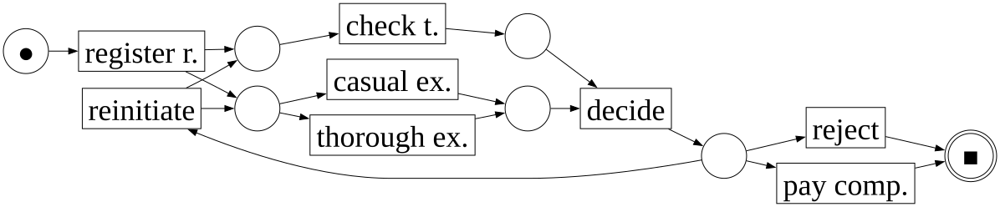

In [20]:
from importlib import reload
import scripts.helper_scripts.setup_analysis as sa
import scripts.analysis_scripts.useful_functions as uf
from IPython.display import display
reload(sa)

abl_path = "../analysis/data/ablations_running_example/execution_data/chosen_for_viz/"

normal = abl_path + "setup_215.pkl.gz"
no_sink_score = abl_path + "no_sink_score.pkl.gz"
no_overenabled = abl_path + "no_overenabled.pkl.gz"
no_num_arcs = abl_path + "no_num_arcs.pkl.gz"
no_remaining = abl_path + "no_remaining.pkl.gz"

with open(abl_path + "normal_big.pdf", "wb") as f:
    gviz = sa.plot_digraph(uf.load_genome(normal)); display(gviz)
    f.write(gviz.pipe(format="pdf"))


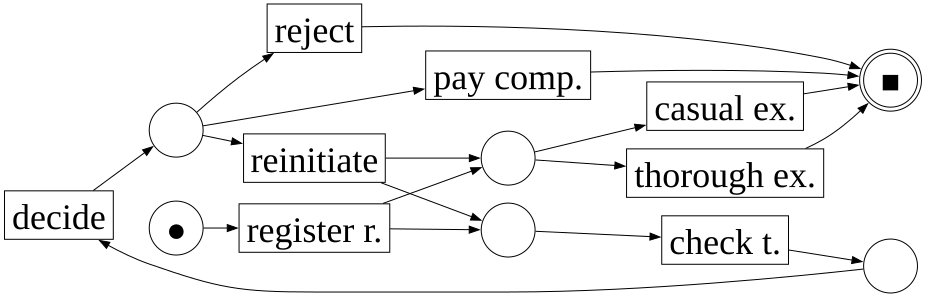

In [21]:
with open(abl_path + "no_sink_score_big.pdf", "wb") as f:
    gviz = sa.plot_digraph(uf.load_genome(no_sink_score)); display(gviz)
    f.write(gviz.pipe(format="pdf"))

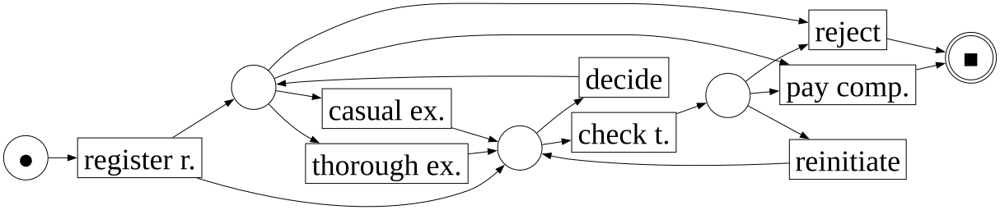

In [22]:
with open(abl_path + "no_overenabled_big.pdf", "wb") as f:
    gviz = sa.plot_digraph(uf.load_genome(no_overenabled)); display(gviz)
    f.write(gviz.pipe(format="pdf"))

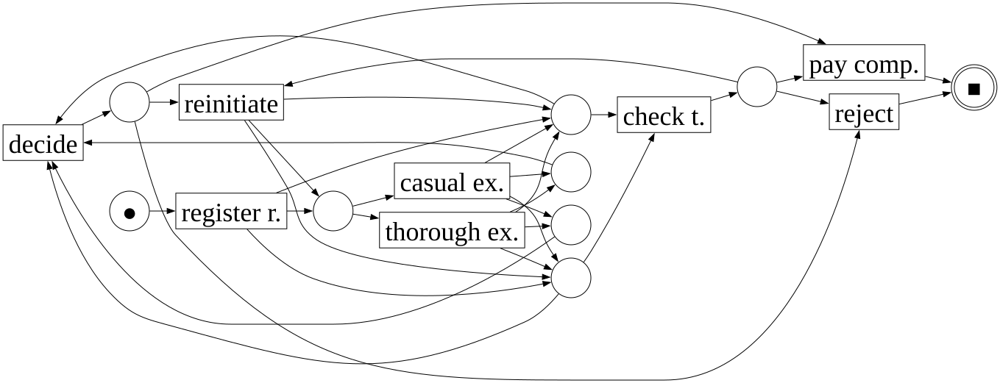

In [26]:
with open(abl_path + "no_num_arcs_big.pdf", "wb") as f:
    gviz = sa.plot_digraph(uf.load_genome(no_num_arcs)); display(gviz)
    f.write(gviz.pipe(format="pdf"))

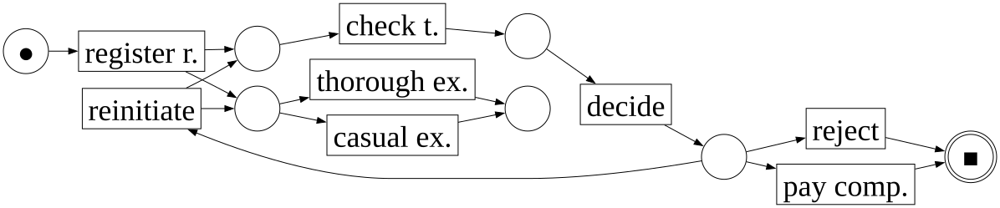

In [30]:
with open(abl_path + "no_remaining_big.pdf", "wb") as f:
    gviz = sa.plot_digraph(uf.load_genome(no_remaining)); display(gviz)
    f.write(gviz.pipe(format="pdf"))

## Finding weights for the midsize log
I selected the 20 best weight combinations from the running example, and ran those n the pdc 2022 log (without hidden trans etc. look at the stuff I wrote for the selection strat comparison)

`I:/EvolvePetriNets/pm_data/pdc_logs/2022/Training Logs/pdc2022_1110000.xes`

In [36]:
midlog_fit_weights = sa.exec_results_crawler("../analysis/data/fitness_weights_test_midlog")

Processing setup directories: 5it [00:00, 48.03it/s]

setup_125

Found cached results for setup_125
Successfully loaded cached results for setup_125
setup_126

Found cached results for setup_126
Successfully loaded cached results for setup_126
setup_132

Found cached results for setup_132
Successfully loaded cached results for setup_132
setup_134

Found cached results for setup_134
Successfully loaded cached results for setup_134
setup_135

Found cached results for setup_135


Processing setup directories: 10it [00:00, 28.21it/s]

Successfully loaded cached results for setup_135
setup_152

Found cached results for setup_152
Successfully loaded cached results for setup_152
setup_153

Found cached results for setup_153
Successfully loaded cached results for setup_153
setup_158

Found cached results for setup_158
Successfully loaded cached results for setup_158
setup_203

Found cached results for setup_203
Successfully loaded cached results for setup_203
setup_206

Found cached results for setup_206


Processing setup directories: 17it [00:00, 24.08it/s]

Successfully loaded cached results for setup_206
setup_212

Found cached results for setup_212
Successfully loaded cached results for setup_212
setup_215

Found cached results for setup_215
Successfully loaded cached results for setup_215
setup_216

Found cached results for setup_216
Successfully loaded cached results for setup_216
setup_230

Found cached results for setup_230
Successfully loaded cached results for setup_230
setup_240

Found cached results for setup_240


Processing setup directories: 20it [00:00, 23.42it/s]

Successfully loaded cached results for setup_240
setup_242

Found cached results for setup_242
Successfully loaded cached results for setup_242
setup_45

Found cached results for setup_45
Successfully loaded cached results for setup_45
setup_54

Found cached results for setup_54
Successfully loaded cached results for setup_54
setup_80

Found cached results for setup_80
Successfully loaded cached results for setup_80
setup_81

Found cached results for setup_81


Processing setup directories: 23it [00:00, 24.76it/s]

Successfully loaded cached results for setup_81


In [37]:
cc_ml_df, _ = sa.analyze_best_genome_comps(midlog_fit_weights)
cc_ml_df.sort("comp_delta")

name,total_unique_comps,mean_compcount,comp_delta,setup_unique_comps
i64,i64,f64,f64,object
153,35,8.5,26.5,"{1, 2, 4, 6, 7, 137, 10, 138, 12, 9, 16, 17, 24, 28, 161, 38, 169, 42, 170, 171, 172, 173, 174, 175, 47, 176, 177, 178, 179, 180, 57, 95, 99, 102, 103}"
158,34,7.2,26.8,"{1, 2, 4, 6, 7, 10, 16, 153, 156, 161, 163, 169, 42, 172, 52, 181, 182, 183, 184, 185, 186, 187, 188, 83, 86, 87, 88, 92, 95, 97, 103, 104, 126, 127}"
230,35,8.2,26.8,"{2, 4, 6, 7, 137, 10, 266, 15, 16, 276, 277, 22, 278, 279, 280, 153, 281, 282, 283, 159, 161, 39, 168, 42, 57, 62, 77, 86, 87, 215, 91, 93, 99, 104, 126}"
212,35,7.6,27.4,"{1, 2, 4, 6, 7, 10, 12, 150, 26, 159, 160, 38, 169, 42, 174, 47, 64, 202, 86, 87, 88, 91, 92, 95, 224, 225, 97, 226, 227, 101, 228, 229, 104, 119, 126}"
132,38,8.0,30.0,"{1, 2, 3, 4, 6, 7, 9, 10, 12, 16, 26, 31, 38, 42, 47, 49, 64, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103}"
…,…,…,…,…
125,47,7.7,39.3,"{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46}"
206,47,7.5,39.5,"{2, 3, 4, 131, 6, 7, 10, 138, 12, 80, 19, 23, 155, 28, 163, 38, 168, 42, 47, 176, 62, 191, 63, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 86, 214, 215, 216, 217, 218, 219, 220, 221, 222, 95, 223, 103, 121}"
135,48,8.1,39.9,"{1, 2, 130, 4, 131, 6, 132, 133, 9, 10, 134, 3, 135, 7, 15, 136, 137, 138, 139, 140, 141, 142, 23, 143, 144, 145, 146, 147, 148, 30, 150, 151, 152, 153, 154, 37, 38, 42, 43, 44, 46, 63, 87, 92, 95, 100, 149, 126}"


Unfortunately with the same parameters there is no perfect convergence this time, as none of the setups achieved a comp_delta of 0.
setup 215 is only the eleventh best...
Also interesting that the 3 weight configs of the running example (215, 80, 81) did not make it to the top spots this time.
need to compare differences there. 

Also, when looking at the genomes, the best setup 153 (e.g. run 3, which is the best run):
* does achieve 1.0 agg_replay
* decent num arcs (0.41)
* pretty good remaining score (0.939..)
* sink score 1.0
* but terrible over_enabled_trans, and therefore really bad precision. This is because it is effectively a flow model, as can be seen in the attached image (path: `I:\EvolvePetriNets\analysis\data\fitness_weights_test_midlog\execution_data\setup_153\3_01-17-2025_02-47-38`):

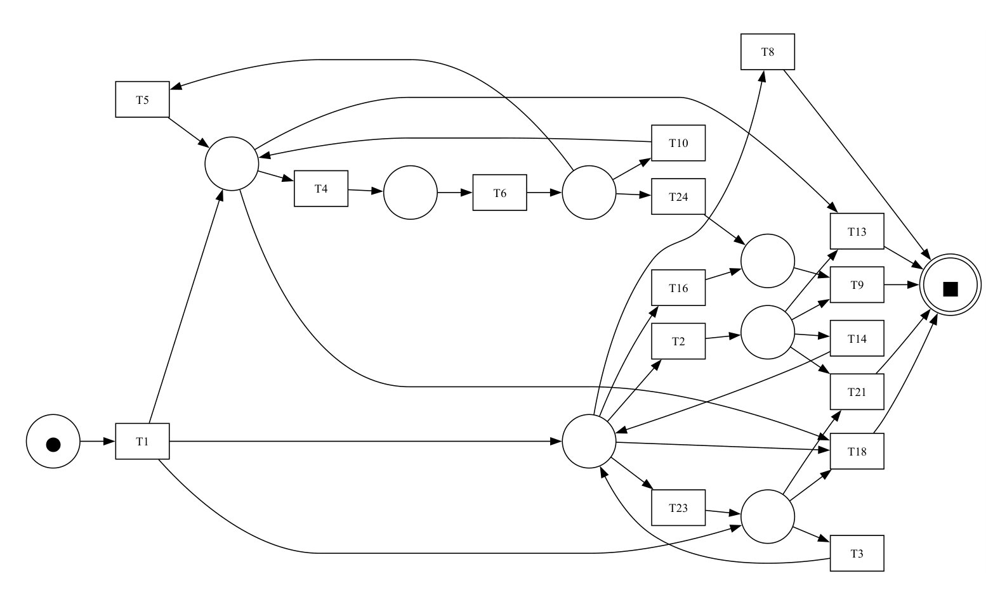

Perhaps I'm now pushing against the limits of the current GWFM, and there is no fitness function that would lead to perfect convergence.

Still worthwhile looking at which params worked, and what the differences are. 
Maybe with different anchor values I could get slightly better results


<!-- **todo**
* look at how long it took to reach convergence
* look at various jaccard distances between the runs -->

I ended up picking setup 230 as the "best" because just from the top 3 they are pretty equal in performance and 230 also uses agg_replay_fit weight like the best weightset for the running example.
I just don't have the time to run hundreds of simulations of the bigger logs.

### Calculating F-Scores for PDC Logs -test
copied from [pdc2022](https://icpmconference.org/2022/process-discovery-contest/):

For each training log, the “Discovery.bat” file is used to discover a model from the training log. Next, the “Classify.bat” is used to classify every trace in the test log against the corresponding trace in the base log using the discovered model. This results in a positive accuracy rate P and a negative accuracy rate N for this training log. From these, its F-score F is computed as 2*(P*N)/(P+N). The end score for the discovery algorithm is the average F-score over all 480 training logs.



## Finding weights for the big log
I selected the 16 best weight from the midsize log test (above) and tested them on the big log:
`I:/EvolvePetriNets/pm_data/pdc_logs/2024/Training Logs/pdc2024_11100000.xes`

In [4]:
from importlib import reload
import scripts.helper_scripts.setup_analysis as sa

biglog_fit_weights_res = sa.exec_results_crawler("../analysis/data/fitness_weights_test_biglog")

Processing setup directories: 18it [00:00, 407.75it/s]

setup_125

Found cached results for setup_125
Successfully loaded cached results for setup_125
setup_132

Found cached results for setup_132
Successfully loaded cached results for setup_132
setup_134

Found cached results for setup_134
Successfully loaded cached results for setup_134
setup_152

Found cached results for setup_152
Successfully loaded cached results for setup_152
setup_153

Found cached results for setup_153
Successfully loaded cached results for setup_153
setup_158

Found cached results for setup_158
Successfully loaded cached results for setup_158
setup_203

Found cached results for setup_203
Successfully loaded cached results for setup_203
setup_212

Found cached results for setup_212
Successfully loaded cached results for setup_212
setup_215

Found cached results for setup_215
Successfully loaded cached results for setup_215
setup_230

Found cached results for setup_230
Successfully loaded cached results for setup_230
setup_240

Found cached results for setup_240
Succ

In [5]:
cc_bl_df, _ = sa.analyze_best_genome_comps(biglog_fit_weights_res)
cc_bl_df.sort("comp_delta")

name,total_unique_comps,mean_compcount,comp_delta,setup_unique_comps
i64,i64,f64,f64,object
54,103,12.888889,90.111111,"{2, 8, 34, 48, 50, 51, 53, 78, 105, 626, 115, 150, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 246, 247, 773, 265, 273, 286, 329, 336, 352, 386, 392, 471}"
132,106,12.9,93.1,"{2, 8, 13, 39, 41, 50, 81, 105, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206}"
153,109,13.7,95.3,"{2, 3, 5, 8, 23, 36, 39, 41, 50, 81, 83, 105, 150, 195, 216, 226, 245, 247, 265, 280, 315, 334, 336, 349, 351, 366, 386, 392, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474}"
215,109,13.3,95.7,"{2, 5, 8, 9, 265, 542, 34, 36, 41, 556, 50, 582, 105, 123, 150, 677, 184, 706, 233, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 327, 848, 849, 850, 851, 852, 853}"
125,109,13.0,96.0,"{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108}"
…,…,…,…,…
240,117,15.4,101.6,"{1024, 1025, 2, 1026, 1027, 5, 1028, 8, 39, 41, 50, 72, 81, 83, 105, 629, 634, 123, 156, 204, 233, 240, 265, 273, 280, 336, 351, 355, 366, 367, 368, 369, 387, 412, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023}"
152,117,14.8,102.2,"{2, 3, 8, 13, 23, 33, 34, 39, 41, 50, 81, 83, 99, 105, 129, 153, 204, 216, 218, 233, 246, 247, 248, 265, 280, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 38

thats a terrible result. All of these weight combinations suck and produce a huge variance in the evolved best genomes.
However, as setup 215 is the 4th "best", I'll pick that one as the best set of metrics for the big log.

### Testing the f-score computation
Here I just test my f-score calculation for pdc logs

In [11]:
bg = biglog_fit_weights_res["setups"][215]["best_genomes"]

for g in bg:
    confusion = sa.get_pdc_f_score(g, "111000", "2024")
    print(confusion["f_score"])

missing perc 0.04
0.7601713062098501
missing perc 0.04
0.7970244420828905
missing perc 0.04
0.8495197438633937
missing perc 0.04
0.8694714131607336
missing perc 0.04
0.7650158061116965
missing perc 0.04
0.8363636363636364
missing perc 0.04
0.8199152542372882
missing perc 0.04
0.7991498405951115
missing perc 0.04
0.7712137486573578
missing perc 0.04
0.81203007518797


## Comparing the best fitness function weights between all 3 logs
* I would have hoped that the bigger logs have less variance in their results.
* But the performance of the algorithm really goes down for bigger logs.
* while the results on the midlog are also terrible, they are at least very slightly better than the results on the biglog, where the best models are just so heterogenous that it really doesn't matter which one. the best (54) has a delta of 95 while the worst has a delta of 113. thats not really worth mentioning.
* really weird that the two pdc logs don't share a set of good weight :\

comparing setup 215 (best for the small log and decent enough (4th) for the biglog) against setup 230 shows the following differences

| metric    | 230 | 215 |
|--------   | --- | --- |
|remaining  | 1   | 0.5 |
|overenabled| 0.5 | 1   |
|numarcs    | 0.5 | 1   |

somehow that makes a difference for the midlog...
I don't even...

## Are anchor values helpful?
**TODO** re-run this with good parameters (that were first found using weights test)

In [4]:
from importlib import reload
import scripts.helper_scripts.setup_analysis as sa
reload(sa)

anchor_test_res = sa.exec_results_crawler("../analysis/data/fitness_anchor_test_running_example", use_setup_num=False)

Processing setup directories: 0it [00:00, ?it/s]

default_anchor

Found cached results for default_anchor


Processing setup directories: 1it [00:02,  2.26s/it]

Successfully loaded cached results for default_anchor
no_anchor

Found cached results for no_anchor


Processing setup directories: 6it [00:03,  2.43it/s]

Successfully loaded cached results for no_anchor
simple_anchor_001

Found cached results for simple_anchor_001


Processing setup directories: 7it [00:03,  2.08it/s]

Successfully loaded cached results for simple_anchor_001
simple_anchor_01

Found cached results for simple_anchor_01


Processing setup directories: 8it [00:05,  1.30it/s]

Successfully loaded cached results for simple_anchor_01
simple_anchor_02

Found cached results for simple_anchor_02


Processing setup directories: 9it [00:07,  1.14s/it]

Successfully loaded cached results for simple_anchor_02
simple_anchor_03

Found cached results for simple_anchor_03


Processing setup directories: 10it [00:09,  1.38s/it]

Successfully loaded cached results for simple_anchor_03
simple_anchor_04

Found cached results for simple_anchor_04


Processing setup directories: 11it [00:11,  1.55s/it]

Successfully loaded cached results for simple_anchor_04
simple_anchor_05

Found cached results for simple_anchor_05


Processing setup directories: 12it [00:14,  1.18s/it]

Successfully loaded cached results for simple_anchor_05


In [42]:
# analyze_best_genome_comps(fit_test)
reload(sa)
cc_anchor_df, uc = sa.analyze_best_genome_comps(anchor_test_res)
cc_anchor_df.sort("comp_delta")

name,total_unique_comps,mean_compcount,comp_delta,setup_unique_comps
str,i64,f64,f64,object
"""simple_anchor_01""",8,6.8,1.2,"{0, 1, 2, 3, 4, 5, 6, 7}"
"""simple_anchor_04""",8,6.8,1.2,"{0, 1, 2, 3, 4, 5, 6, 7}"
"""simple_anchor_03""",8,6.6,1.4,"{0, 1, 2, 3, 4, 5, 6, 7}"
"""simple_anchor_05""",8,6.6,1.4,"{0, 1, 2, 3, 4, 5, 6, 7}"
"""default_anchor""",8,6.5,1.5,"{0, 1, 2, 3, 4, 5, 6, 7}"
"""simple_anchor_02""",8,6.5,1.5,"{0, 1, 2, 3, 4, 5, 6, 7}"
"""no_anchor""",8,2.8,5.2,"{8, 9, 10, 11, 12, 13, 14, 15}"
"""simple_anchor_001""",12,2.9,9.1,"{8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21}"


* The only important thing for the anchors seems to be to tie the other metrics to replay fitness.
* They can all use the same anchor value, it does not really seem to matter if they use different anchor values.
* The anchor value can also be set pretty low, but definitely above 0.1. Since it doesn't matter that much probably, an anchor of 0.3 or or 0.4 is probably okay.
* Even if I combine all unique components from the runs with anchor values 0.1 - 0.5, it still just comes out to 8 unique components, which is the same spread as in the individual setups. This means there is no real difference in the components generated by the different setups.
* convergence does take a bit longer with a higher anchor, and more components (todo show the plots for this)
* I have a hunch that for more complex logs with many different variants it would be beneficial to set the anchor value a bit higher (todo -test this)

In [43]:

sa.get_jaccard_dist_between_comps(cc_anchor_df, "simple_anchor_01", "simple_anchor_001")
sa.get_jaccard_dist_between_comps(cc_anchor_df, "simple_anchor_01", "simple_anchor_02")

Jaccard similarity simple_anchor_01 - simple_anchor_001
 0.0
Jaccard similarity simple_anchor_01 - simple_anchor_02
 1.0


The code above measures the distance between the sets of components from different anchor-value runs.
A setup with an anchor of just 0.1, i.e. 10% replay fitness required to add every other metric managed to perfectly converge on components that are the same as those with an anchor of 20%.
On the other hand a setup where metrics are anchored to just 0.01, i.e. 1% replay fitness actually shares no components with the 10% anchor. The limit for the small log therefore lies somewhere between 1-10%. 

todo: would be interesting to test for bigger logs as well

## Is the replay multiplier helpful?
The replay multiplier is increased for every consecutive problem-free transition firing.
I have compared a multiplier of 1.5, meaning that every successive good transition the mult will be increased by 1.5 vs. 1, which stays constant, i.e. no multiplier.

In [2]:
from importlib import reload
import scripts.helper_scripts.setup_analysis as sa
reload(sa)

multiplier_test_res = sa.exec_results_crawler("../analysis/data/replay_mult_running_example", use_setup_num=False)

Processing setup directories: 0it [00:00, ?it/s]

no_mult


Processing setup directories: 4it [00:09,  2.41s/it]


Saved aggregated results for no_mult
with_mult


Processing setup directories: 5it [00:18,  3.74s/it]


Saved aggregated results for with_mult


In [4]:
# analyze_best_genome_comps(fit_test)
reload(sa)
mult_anchor_df, _ = sa.analyze_best_genome_comps(multiplier_test_res)
mult_anchor_df.sort("comp_delta")

name,total_unique_comps,mean_compcount,comp_delta,setup_unique_comps
str,i64,f64,f64,object
"""with_mult""",8,6.8,1.2,"{0, 1, 2, 3, 4, 5, 6, 7}"
"""no_mult""",8,6.76,1.24,"{0, 1, 2, 3, 4, 5, 6, 7}"


* Need to rerun with the very best fitness function for running example
* More runs also for higher precision
* compare fitness curves

# Mutation Analysis
* also need to activate mutations that add hidden transitions for logs where hidden transitions are used

## T-value distributions


Statistics for random:
Count of non-NA values: 594
Mean: -0.011
Std: 2.482
Min: -3.176
Max: 18.468

Statistics for guided:
Count of non-NA values: 596
Mean: -0.091
Std: 1.954
Min: -6.403
Max: 6.739

Statistics for random:
Count of non-NA values: 704
Mean: -0.614
Std: 1.991
Min: -4.040
Max: 13.840

Statistics for guided:
Count of non-NA values: 693
Mean: -0.592
Std: 1.895
Min: -5.246
Max: 13.863


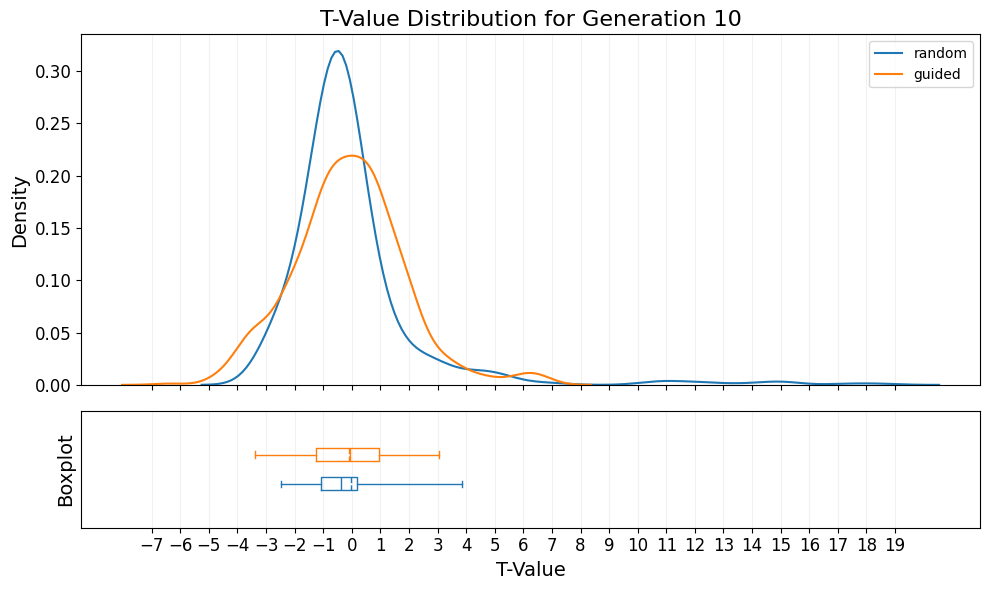

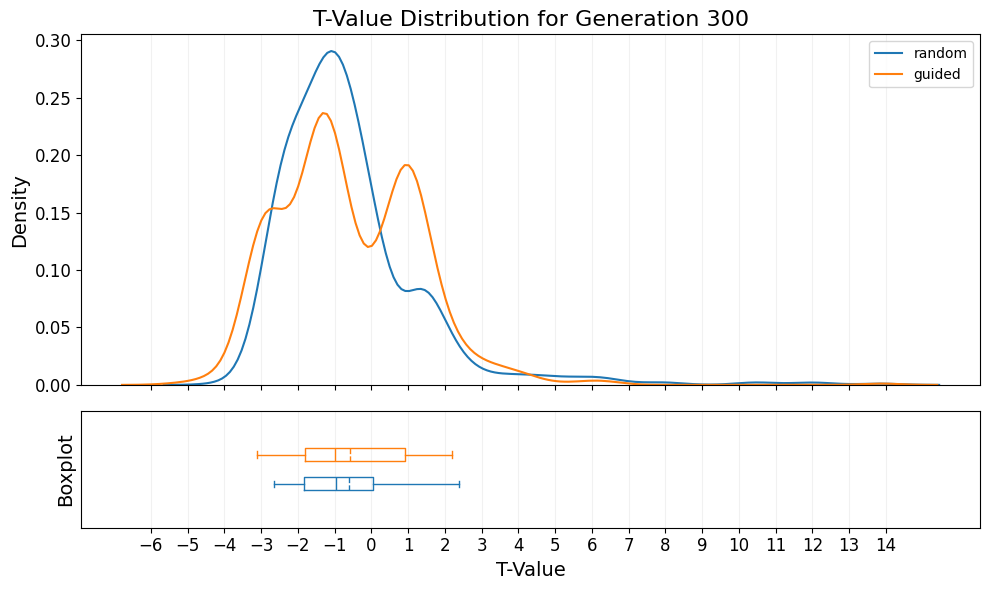

In [23]:
import scripts.helper_scripts.setup_analysis as sa
reload(sa)

fp_dict = {
    'random': "I:/EvolvePetriNets/analysis/data/comparing_t_value_distributions/midlog_no_t.pkl.gz",
    'guided': "I:/EvolvePetriNets/analysis/data/comparing_t_value_distributions/midlog_yes_t.pkl.gz"
}

mutation_t_vals_gen_10 = sa.plot_t_value_distributions(fp_dict, 10)
mutation_t_vals_gen_300 = sa.plot_t_value_distributions(fp_dict, 300)

mutation_t_vals_gen_10.savefig(analysis_plot_fp + "mutation_t_vals_gen_10.pdf")
mutation_t_vals_gen_300.savefig(analysis_plot_fp + "mutation_t_vals_gen_300.pdf")

The above code compares the t-values of a run with guided mutations (midsize log) against a run with fully random mutations.

The observations are taken at 10 and 300 generations, and the point is to:
* show the "natural" distribution of component t-values (blue line). Selection obviously really impacts what the distribution looks like.
Mutation settings probably also have an effect, but don't know how strong.
* shows what the distribution looks like with guided mutations, ceteris paribus.

The visualization is currently used in the thesis

**mutation todos:**
* dependency graph of mutations -> meta process mining
* avg num mutations needed to evolve solution

## Guided mutations
That first test is more a preliminary result (as not all runs completed for some reason).
Point is just to see what effect guided mutations have on a bigger log such as the midsize log - and if they limit search space coverage too much.

In [161]:
from importlib import reload
import scripts.helper_scripts.setup_analysis as sa
reload(sa)

guided_res = sa.exec_results_crawler("../analysis/data/guided_mutations_effect/", use_setup_num=False)
# sa.extract_run_metrics("../analysis/data/guided_mutations_effect/").write_ipc("../analysis/data/guided_mutations_effect/final_report_df.feather")

Processing setup directories: 0it [00:00, ?it/s]

speciation_midlog_fully_random


Processing setup directories: 2it [00:11,  5.91s/it]


Saved aggregated results for speciation_midlog_fully_random
speciation_midlog_guided


Processing setup directories: 3it [00:26,  8.95s/it]


Saved aggregated results for speciation_midlog_guided


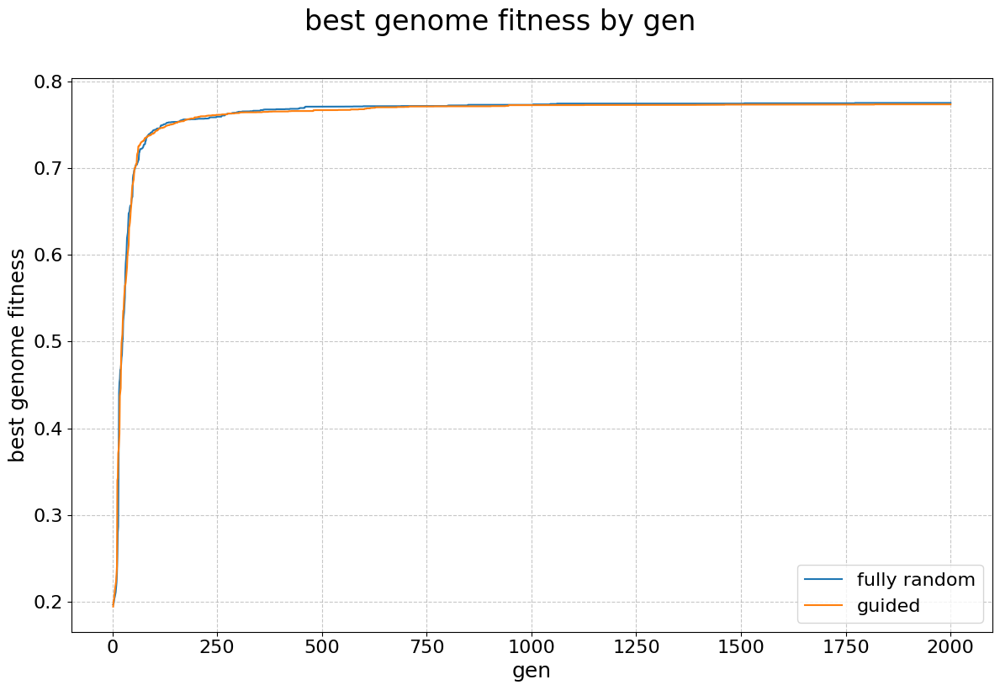

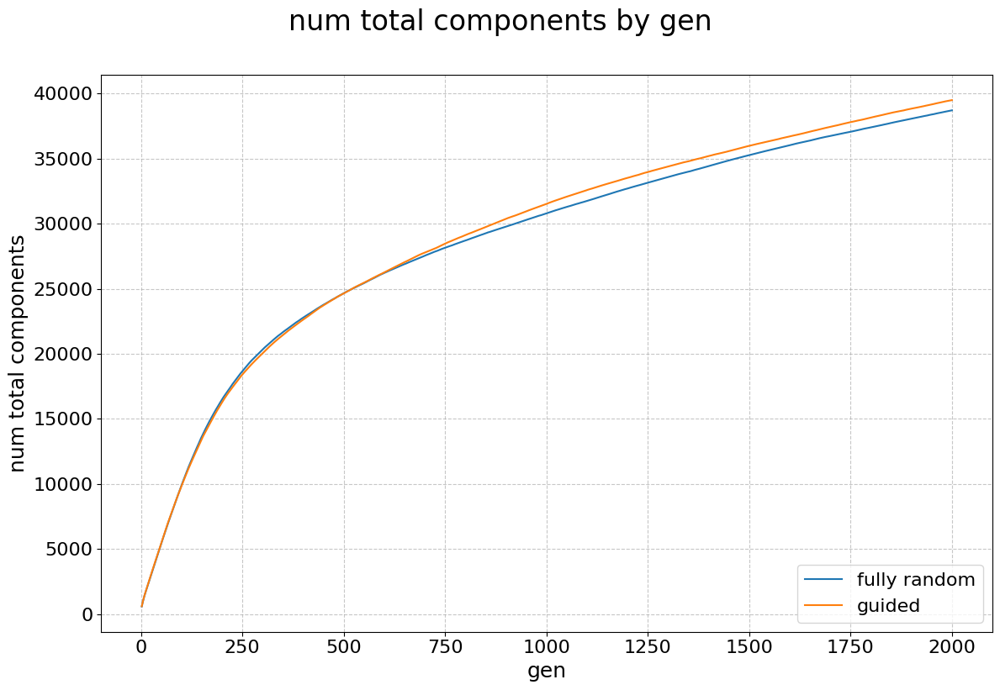

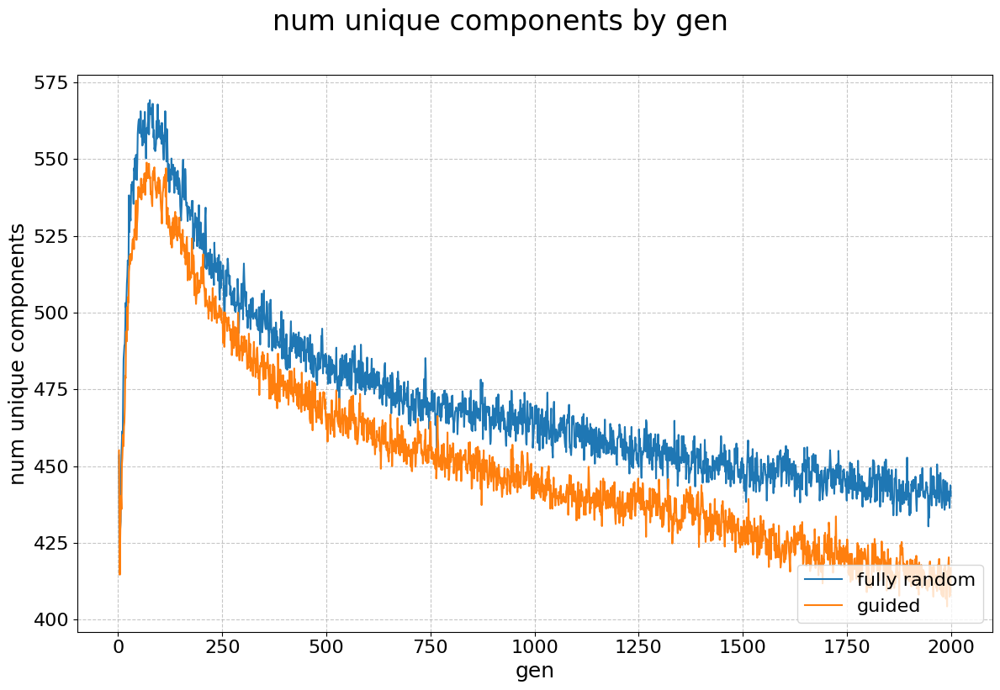

In [170]:
# guided_res["setups"]['speciation_midlog_guided']["gen_info_agg"]
# targets = ["best_genome_fitness", "num_total_components", "num_unique_components"]

guided_plt_data = {
    "fully random": guided_res["setups"]['speciation_midlog_fully_random']["gen_info_agg"],
    "guided": guided_res["setups"]['speciation_midlog_guided']["gen_info_agg"]
}
guided_plt_layout = [["fully random", "guided"]]
_ = sa.generalized_lineplot(guided_plt_layout, guided_plt_data, "best_genome_fitness")
_ = sa.generalized_lineplot(guided_plt_layout, guided_plt_data, "num_total_components")
_ = sa.generalized_lineplot(guided_plt_layout, guided_plt_data, "num_unique_components")

will need to conduct more tests, but that is an encouraging result for a bigger log. I was just worried that guided mutations might have constrained the search space way too much

# Bootstrapping test 
I won't fragment the log. Better to provide the deterministic miners with full information.
Though it would be interesting to build on fragments.
but that requires a more decisions again how to split up the log and implementation changes for which I don't have time anymore.